## Final version - simplified SVD

In [50]:
import os
from google.cloud import bigquery

# Initialize BigQuery client
client = bigquery.Client()
print("Authenticated successfully!")

Authenticated successfully!


In [51]:
!pip install surprise


[notice] A new release of pip available: 22.2.1 -> 25.0.1
[notice] To update, run: python -m pip install --upgrade pip


In [52]:
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split, cross_validate, GridSearchCV
from surprise.accuracy import rmse
import pandas as pd

# Define BigQuery client
client = bigquery.Client(project="film-wizard-453315")

# Define batch size & dataset properties
BATCH_SIZE = 1_000_000  # 100k rows per batch
TOTAL_ROWS = 32_000_000  # Approximate total dataset size
reader = Reader(rating_scale=(0.5, 5))

### **GL df**
sample_query = """
SELECT userId, movieId, rating
FROM `film-wizard-453315.Grouplens.raw_grouplens_ratings`
ORDER BY RAND()
LIMIT 1000000
"""

# Fetch data from BigQuery
gl_df = client.query(sample_query).to_dataframe()
print("Loaded data from BigQuery:", gl_df.shape)
display(gl_df.head(5))

data = Dataset.load_from_df(gl_df, reader)

Loaded data from BigQuery: (1000000, 3)


,userId,movieId,rating
0,183771,2144,3.0
1,178837,908,4.0
2,166738,1374,5.0
3,46126,104,4.0
4,169856,44555,4.5


In [53]:
gl_df['userId'].max()+1

new_user_ratings = pd.read_csv('/Users/tigranarzumanov/code/tigran-a17/ratings.csv')
new_user_ratings = new_user_ratings[new_user_ratings['Year'] <= 2022]
new_user_ratings

,Date,Name,Year,Letterboxd URI,Rating
0,09/05/2021,"Three Billboards Outside Ebbing, Missouri",2017,https://boxd.it/ceBS,4.5
1,16/05/2021,Nomadland,2020,https://boxd.it/lnRy,4.0
2,17/05/2021,Lady Bird,2017,https://boxd.it/dGNE,3.0
3,03/07/2021,Yesterday,2019,https://boxd.it/iF7M,2.5
4,03/07/2021,Coco,2017,https://boxd.it/bYJQ,3.5
5,05/07/2021,mid90s,2018,https://boxd.it/fxIa,4.0
6,05/07/2021,The Street,2019,https://boxd.it/ndKQ,4.0
7,21/07/2021,There Will Be Blood,2007,https://boxd.it/20Z2,3.5
8,21/07/2021,Pain and Glory,2019,https://boxd.it/iOBQ,3.0
9,22/07/2021,Senna,2010,https://boxd.it/kfE,3.5


In [54]:
new_user_ratings.drop(columns=['Date', 'Year', 'Letterboxd URI'], inplace=True)
new_user_ratings.dropna(inplace=True)

In [55]:
new_user_ratings

,Name,Rating
0,"Three Billboards Outside Ebbing, Missouri",4.5
1,Nomadland,4.0
2,Lady Bird,3.0
3,Yesterday,2.5
4,Coco,3.5
5,mid90s,4.0
6,The Street,4.0
7,There Will Be Blood,3.5
8,Pain and Glory,3.0
9,Senna,3.5


In [56]:
### Fuzzy matching ###
### **GL df**
sample_query = """
SELECT movieId, title
FROM `film-wizard-453315.Grouplens.grouplens_movies`
"""

# Fetch data from BigQuery
grouplens_movies = client.query(sample_query).to_dataframe()
print("Loaded data from BigQuery:", gl_df.shape)
display(grouplens_movies.head(5))

Loaded data from BigQuery: (1000000, 3)


,movieId,title
0,181685,به نام پدر
1,139596,Danielův svět
2,151307,The Lovers and the Despot
3,178223,Injecting Aluminum
4,189345,The Doctor From India


In [57]:
!pip install fuzzywuzzy



[notice] A new release of pip available: 22.2.1 -> 25.0.1
[notice] To update, run: python -m pip install --upgrade pip


In [58]:
from fuzzywuzzy import fuzz, process
import pandas as pd

def fuzzy_match(df1, col1, df2, col2, threshold=80):
    matched_data = []
    choices = df2[col2].tolist()  # Convert column to a list to avoid unpacking issues

    for name in df1[col1]:
        result = process.extractOne(name, choices, scorer=fuzz.ratio)
        match, score = result if result else ("", 0)  # Ensure safe unpacking
        matched_data.append((name, match if score >= threshold else None, score))

    return pd.DataFrame(matched_data, columns=[col1, 'Matched_Title', 'Score'])

In [59]:
# Example usage
matches_df = fuzzy_match(new_user_ratings, 'Name', grouplens_movies, 'title')
display(matches_df)

,Name,Matched_Title,Score
0,"Three Billboards Outside Ebbing, Missouri","Three Billboards Outside Ebbing, Missouri",100
1,Nomadland,Nomadland,100
2,Lady Bird,Lady Bird,100
3,Yesterday,Yesterday,100
4,Coco,Coco,100
5,mid90s,Mid90s,100
6,The Street,The Street,100
7,There Will Be Blood,There Will Be Blood,100
8,Pain and Glory,Pain and Glory,100
9,Senna,Senna,100


In [60]:
# Split the data into a training and test set
trainset, testset = train_test_split(data, test_size=0.25)

# Create the SVD model and train it
model = SVD()
model.fit(trainset)

# Define a function to get top 5 recommendations for a user
def get_top_n(predictions, n):
    top_n = {}
    for uid, iid, true_r, est, _ in predictions:
        if uid not in top_n:
            top_n[uid] = []
        top_n[uid].append((iid, est))

    # Sort the predictions for each user and return the top n
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]
    
    return top_n

# Load your data from BigQuery (assuming you have already loaded gl_df)
# Here's an example:
#gl_df = pd.read_csv('your_data.csv')

In [61]:
# **2️⃣ Cross-Validation Before Batch Training**
cv_results = cross_validate(model, data, cv=5, verbose=True)
print(cv_results)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9187  0.9148  0.9217  0.9207  0.9175  0.9187  0.0024  
MAE (testset)     0.7059  0.7025  0.7086  0.7067  0.7045  0.7056  0.0021  
Fit time          10.08   11.05   11.57   13.21   13.47   11.88   1.29    
Test time         2.19    0.84    0.80    2.47    0.80    1.42    0.75    
{'test_rmse': array([0.91868381, 0.91484064, 0.92171002, 0.92072909, 0.91745652]), 'test_mae': array([0.70589194, 0.70251027, 0.708609  , 0.70666249, 0.70445045]), 'fit_time': (10.082672834396362, 11.049674034118652, 11.567837953567505, 13.208827018737793, 13.472661972045898), 'test_time': (2.1883890628814697, 0.844916820526123, 0.8041131496429443, 2.4716899394989014, 0.7980108261108398)}


In [65]:
# Get predictions for the testset
predictions = model.test(testset)

# Get the top 10 recommendations for each user
top_n = get_top_n(predictions, n=50)
top_n.get(11157)

[(858, 4.221474254611154)]

In [63]:
model.predict()

TypeError: AlgoBase.predict() missing 2 required positional arguments: 'uid' and 'iid'

In [ ]:
test = {
    132721: [(3030, 4.343930472863401),
  (3147, 4.173104100455896),
  (8014, 4.10402787200236)],
 134273: [(69481, 3.2115050041528552),
  (2917, 3.147696080876573),
  (1227, 3.14304677816368)],
 163615: [(1196, 4.082660659362825),
  (7099, 4.038083503624332),
  (608, 3.769995671477647)]
}

In [ ]:
test.items()

In [ ]:
# Convert user recommendations into a single DataFrame
data = []
for user_id, movies in top_n.items():
    for movie_id, rating in movies:
        data.append((user_id, movie_id, rating))

df = pd.DataFrame(data, columns=["userId", "movieId", "rating"])
df

In [29]:
# Count occurrences of each movieId
movie_counts = df['movieId'].value_counts()

# Filter rows where movieId appears more than once
duplicated_movies_df = df[df['movieId'].isin(movie_counts[movie_counts > 1].index)]

print(duplicated_movies_df)

        userId  movieId    rating
0        11029    54286  3.942527
1        11029    60069  3.860135
2        29575     1193  4.534246
3        29575     2664  4.151621
4         3033     2501  4.147760
...        ...      ...       ...
236036  199688     2721  3.443648
236037  148538     4993  4.081265
236038   76896      318  4.488496
236039  124718    91529  4.197376
236040   13688     4239  3.456261

[230904 rows x 3 columns]


In [31]:
df[df['movieId'] == 55820]

,userId,movieId,rating
35,82881,55820,4.221887
1106,23803,55820,3.985561
1756,172754,55820,3.542103
5364,120809,55820,3.267498
5533,36044,55820,3.176653
...,...,...,...
230317,19190,55820,3.780739
230745,76978,55820,4.517069
232169,108984,55820,3.939549
233001,33608,55820,4.468951


In [32]:
test_dict = {
    'userId': [132721],
    'movieId': [3030],
    'rating': [4.343930472863401]
}

test_df = pd.DataFrame(data=test_dict)
test_df

,userId,movieId,rating
0,132721,3030,4.34393


In [33]:
# Initialize an empty dictionary to store DataFrames
user_dfs = {}

# Loop through each userId and create a DataFrame
for user_id in top_n:
    movie_data = top_n[user_id]  # Get movie list for the user
    movie_ids = []
    predicted_ratings = []
    
    # Extract movieId and predicted_rating
    for movie in movie_data:
        movie_ids.append(movie[0])
        predicted_ratings.append(movie[1])
    
    # Create DataFrame
    df = pd.DataFrame({"movieId": movie_ids, "predicted_rating": predicted_ratings})
    
    # Store in dictionary
    user_dfs[user_id] = df

# Display example output
for user_id in user_dfs:
    print(f"User {user_id} recommendations:")
    print(user_dfs[user_id], "\n")

User 11029 recommendations:
   movieId  predicted_rating
0    54286          3.942527
1    60069          3.860135 

User 29575 recommendations:
   movieId  predicted_rating
0     1193          4.534246
1     2664          4.151621 

User 3033 recommendations:
   movieId  predicted_rating
0     2501          4.147760
1     4016          4.011165
2     4954          3.845673
3     3936          3.732467
4     2989          3.707004
5     3270          3.631440 

User 80176 recommendations:
   movieId  predicted_rating
0    31116          4.320833 

User 153053 recommendations:
   movieId  predicted_rating
0     7361          4.446262
1     2700          4.250157
2     1961          4.231992
3    47629          4.103515
4     1676          4.029123
5     3358          4.002552
6    34767          3.803268
7     3633          3.722742
8     8949          3.619237
9      442          3.522574 

User 61638 recommendations:
   movieId  predicted_rating
0     2324          4.176832 

User 242

   movieId  predicted_rating
0      364          2.959332 

User 129398 recommendations:
   movieId  predicted_rating
0     4019          3.817949
1   100383          3.434314 

User 21949 recommendations:
   movieId  predicted_rating
0     1197          3.840401 

User 122544 recommendations:
   movieId  predicted_rating
0     2762          3.793232
1    55118          3.702281
2     1259          3.455138
3     3306          3.430470
4   102194          3.348093
5   193705          3.264896
6   168328          3.179849
7     6989          3.092271
8    34435          3.067499
9    33019          2.967813 

User 11388 recommendations:
   movieId  predicted_rating
0    73276          3.965936
1   117176          3.690433 

User 74460 recommendations:
   movieId  predicted_rating
0    27397          4.085749
1      913          4.028452
2      215          4.002872
3     2948          3.688666
4     8119          3.536019
5     7163          3.337819
6    44022          3.318855
7     2

   movieId  predicted_rating
0      480          3.689284
1      434          2.882808 

User 80278 recommendations:
   movieId  predicted_rating
0    51255          3.722005
1    44022          3.348498
2   141824          3.290971
3    32031          3.232482
4   106072          3.218496
5    84772          3.020510
6   104245          2.779529
7    78105          2.471963
8   156609          2.422083 

User 173688 recommendations:
   movieId  predicted_rating
0     1617          4.018099
1     1594          3.855624
2     1073          3.786279
3     3210          3.706067
4     1639          3.702251
5       36          3.613402
6     2987          3.403934
7     2596          3.313625
8     1030          2.874671
9     3591          2.857306 

User 6079 recommendations:
   movieId  predicted_rating
0     3097          3.648686
1     2028          3.634998
2     4014          3.625780
3     6305          3.495654
4     4476          3.146300
5     1717          2.989964
6     5508 

   movieId  predicted_rating
0     2076          3.123738
1   197883          3.109791
2    71518          3.055633
3   101425          3.029887
4     1096          3.013773
5       32          2.942858
6   257037          2.933558
7     7941          2.918863
8    27773          2.913553
9     3675          2.830272 

User 130891 recommendations:
   movieId  predicted_rating
0     4993          4.290273 

User 69518 recommendations:
   movieId  predicted_rating
0     6365          3.465971 

User 66757 recommendations:
   movieId  predicted_rating
0    54272          2.867615
1     6535          2.541591 

User 15122 recommendations:
   movieId  predicted_rating
0     2935          4.767227
1      933          4.447787 

User 190814 recommendations:
   movieId  predicted_rating
0     1208          4.412284
1     2762          3.801963
2    97752          3.637105
3     5693          3.543767
4     4878          3.470801
5    55363          3.413397
6     1680          3.021683
7     4

   movieId  predicted_rating
0    94777          2.821242
1   116823          2.605089 

User 34552 recommendations:
   movieId  predicted_rating
0     2396          3.678484
1    41569          3.049440
2       48          2.316025 

User 35924 recommendations:
   movieId  predicted_rating
0     3671          4.154229
1     2022          4.094994
2     2176          4.066837
3     1090          4.036739
4     3911          3.942998
5       21          3.781692
6     2915          3.437892
7     1792          3.249645
8     3107          3.229825
9      543          3.205051 

User 60042 recommendations:
   movieId  predicted_rating
0     1136          3.852074
1    48738          3.776047
2   103335          3.459348
3     1721          3.373758
4     2763          3.276247
5     1073          3.181266
6    79242          3.152172
7     4141          2.778835
8       60          2.410481 

User 94047 recommendations:
   movieId  predicted_rating
0     2959          4.229713
1      357

   movieId  predicted_rating
0       47          3.917486
1     4701          3.399981
2   176759          3.322135
3     5266          3.144846
4    34319          2.900904 

User 133941 recommendations:
   movieId  predicted_rating
0     3030          4.245892
1    51255          3.916400
2     1214          3.674580
3     2115          3.532250
4    47452          3.471479
5   112852          3.404788
6    43921          3.274584
7     3869          3.236476
8    53125          3.071836
9     1924          2.183070 

User 159819 recommendations:
   movieId  predicted_rating
0     1178          4.385871
1     2762          4.327380
2     1617          4.116208
3     1250          3.813497
4     3100          3.770698
5     2916          3.595121
6     3977          3.458410 

User 6570 recommendations:
   movieId  predicted_rating
0   166528          3.725601
1   286131          3.126168 

User 10749 recommendations:
   movieId  predicted_rating
0     1193          4.605620
1    3379

User 39066 recommendations:
   movieId  predicted_rating
0   127202          4.206976
1    69757          4.201324
2   134184          4.137751
3   115617          4.129330
4   128620          4.053089
5   130478          3.890092
6    49278          3.852391
7    84152          3.759472
8    53318          3.752828
9    81834          3.595626 

User 109603 recommendations:
   movieId  predicted_rating
0     3479          3.534554
1     2161          3.039047
2     5247          2.523370
3     2095          2.426017 

User 92054 recommendations:
   movieId  predicted_rating
0    54286          4.482773
1     5479          3.954616
2    44929          3.772623
3    55276          3.760590
4     5254          3.546659 

User 54883 recommendations:
   movieId  predicted_rating
0      924          4.452045
1     1285          3.408629
2      648          3.394072 

User 126310 recommendations:
   movieId  predicted_rating
0   117529          3.073264
1   116823          2.738293 

User 14

   movieId  predicted_rating
0     1148          4.129023
1      457          3.965147
2      165          3.552233
3      379          3.064909
4      432          2.600990 

User 29344 recommendations:
   movieId  predicted_rating
0     2028          3.710004
1      898          3.588508
2     5903          3.509573
3    67665          3.451118
4    89753          3.383596
5     6333          3.232728
6    34065          2.967526
7      164          2.830955
8      370          2.660823
9    72998          2.428387 

User 184291 recommendations:
   movieId  predicted_rating
0    58559          4.171712
1    59784          3.687015 

User 154847 recommendations:
   movieId  predicted_rating
0     2501          4.002071
1      337          3.898303
2      527          3.617217 

User 148836 recommendations:
   movieId  predicted_rating
0   162414          4.027081
1   108727          3.335883 

User 191852 recommendations:
   movieId  predicted_rating
0     8368          3.153792
1    

   movieId  predicted_rating
0     5952          4.536569
1     8644          3.551134 

User 87936 recommendations:
   movieId  predicted_rating
0   106782          4.122801 

User 23631 recommendations:
   movieId  predicted_rating
0      450          3.337376
1     3005          3.172397
2     6625          3.082023
3     5665          2.917271
4     5531          2.621575 

User 69496 recommendations:
   movieId  predicted_rating
0   202237          4.043553
1    86882          3.904216
2    91890          3.797660 

User 8588 recommendations:
   movieId  predicted_rating
0     4034          3.343100
1     3088          3.338753
2   114060          3.129663
3   113862          3.035219
4     7026          3.016833
5     5445          3.015922
6     4235          2.983363
7    59315          2.961045
8     4633          2.917797
9     4641          2.861520 

User 129054 recommendations:
   movieId  predicted_rating
0     3526          3.525916
1     2253          2.608148
2     412

   movieId  predicted_rating
0      348           4.07917
1      435           2.95363 

User 129375 recommendations:
   movieId  predicted_rating
0     3114          4.184033
1     2398          4.149542
2     2133          3.532932
3      673          2.904795 

User 33750 recommendations:
   movieId  predicted_rating
0     3469          4.006797
1     6365          3.530377 

User 125498 recommendations:
   movieId  predicted_rating
0     5299          3.731361 

User 163735 recommendations:
   movieId  predicted_rating
0      920          4.069124
1     1096          4.052539
2     1210          3.983729
3     1573          3.395033
4      552          3.364853
5      434          2.834206
6     1438          2.711939
7      332          2.628871 

User 190920 recommendations:
   movieId  predicted_rating
0      942          4.032734
1    96821          3.867107
2     1120          3.825759
3   111732          3.785368
4     1206          3.750241
5   164107          3.697408
6   1

   movieId  predicted_rating
0     1221          4.485749
1     4963          4.010181
2     5378          3.648393
3       95          3.033514 

User 52788 recommendations:
   movieId  predicted_rating
0      160          2.634501 

User 48892 recommendations:
   movieId  predicted_rating
0     7060          3.076288
1     2505          2.742383
2     1972          2.365180 

User 10086 recommendations:
   movieId  predicted_rating
0    44555          4.192095
1      942          4.076975
2     1348          3.931407
3     1276          3.876063
4     8950          3.636355 

User 190227 recommendations:
   movieId  predicted_rating
0    79132          4.258887 

User 113535 recommendations:
   movieId  predicted_rating
0      293          3.747634
1       95          3.061570 

User 135026 recommendations:
   movieId  predicted_rating
0     2879          3.680174 

User 135265 recommendations:
   movieId  predicted_rating
0     5995          4.676573
1     7153          4.357837 

U

   movieId  predicted_rating
0        6          4.018327 

User 165773 recommendations:
   movieId  predicted_rating
0     1617          4.406779
1     3471          4.071349
2      508          3.691062 

User 38718 recommendations:
   movieId  predicted_rating
0     7044          4.805652
1      110          4.603210
2     6530          4.590278
3     6870          4.558083
4     1270          4.532306
5    40491          4.518380
6     6971          4.500128
7     1748          4.483409
8     4973          4.455876
9     7365          4.399245 

User 31409 recommendations:
   movieId  predicted_rating
0   115617          4.216482
1   166528          3.931450 

User 56876 recommendations:
   movieId  predicted_rating
0     2124          3.738593
1     3404          3.511093
2     2059          3.500946
3     2517          3.364711
4     3768          2.902816 

User 185629 recommendations:
   movieId  predicted_rating
0     2947          4.410206
1     5304          4.249237
2     7

   movieId  predicted_rating
0     5385          3.961101
1     1084          3.920852
2    89470          3.715810
3     1345          3.510082
4     5049          3.507837
5     7178          3.403191 

User 109343 recommendations:
   movieId  predicted_rating
0     4308          3.583657 

User 143683 recommendations:
   movieId  predicted_rating
0   112552          4.154847 

User 32324 recommendations:
   movieId  predicted_rating
0    88129          3.345685
1   169400          3.129997
2    97860          3.081817
3   122886          3.074673 

User 63519 recommendations:
   movieId  predicted_rating
0      150          3.965469
1     5903          3.515373
2     7360          3.219851
3    33615          3.141534
4    33834          2.939678
5     1894          2.680284 

User 18933 recommendations:
   movieId  predicted_rating
0   126430          4.137203
1    51255          4.060462
2     1089          3.912735
3     5464          3.779068
4   174909          3.520899
5     3

   movieId  predicted_rating
0     3147          4.169032
1   174055          3.966280
2    81834          3.929093 

User 77912 recommendations:
   movieId  predicted_rating
0     1580          4.019874
1     4720          3.922785
2     3300          3.526760
3     3863          3.520102
4      316          3.173835
5     3821          2.198776 

User 177846 recommendations:
   movieId  predicted_rating
0     2883          3.902031 

User 140262 recommendations:
   movieId  predicted_rating
0     1214          4.179803
1       32          4.035503 

User 67231 recommendations:
   movieId  predicted_rating
0      590          3.570126 

User 169558 recommendations:
   movieId  predicted_rating
0   120124          3.579628
1   267836          3.532830
2   220530          3.388416
3   290860          2.941561
4   132474          2.941561
5   121374          2.430393
6   217268          2.373937
7   253358          2.272695
8   152676          2.268075
9   114980          2.244647 

User

   movieId  predicted_rating
0    74458          4.400426
1     4886          4.178763 

User 184473 recommendations:
   movieId  predicted_rating
0    71033          4.287655
1     4993          4.257325
2    31696          3.393317
3    45672          2.449840 

User 109258 recommendations:
   movieId  predicted_rating
0     1954          3.810323
1     1884          3.607038
2   143355          3.551447
3    93855          3.516479
4   167732          3.497477
5      837          3.404067
6    47200          3.307208
7   225776          3.274876
8    47952          3.239949
9   224727          3.118094 

User 120068 recommendations:
   movieId  predicted_rating
0      349          3.692278 

User 147591 recommendations:
   movieId  predicted_rating
0     1704          4.002539
1      277          3.471600 

User 101445 recommendations:
   movieId  predicted_rating
0      924          4.356878
1    32587          4.231388
2    53519          3.954065
3     8957          3.316919 

Us

   movieId  predicted_rating
0   159817          4.297268
1      527          3.884557
2     2761          3.754553
3     1219          3.737131
4     4914          3.687643
5   104841          3.428898
6     2985          3.103595 

User 124930 recommendations:
   movieId  predicted_rating
0    59369          4.404304 

User 13817 recommendations:
   movieId  predicted_rating
0     6502          4.346228
1   186983          4.334555
2     5810          4.065543 

User 178564 recommendations:
   movieId  predicted_rating
0     1206          3.636087
1     3578          3.623624
2     2959          3.566257
3    87232          3.526738
4    31696          3.470365
5     3740          3.396878
6   107406          3.207077 

User 132289 recommendations:
   movieId  predicted_rating
0     1304          3.974124
1     7706          3.907054
2      936          3.781194
3      971          3.757919
4     2268          3.638160
5     1805          2.856908 

User 93600 recommendations:
   mov

   movieId  predicted_rating
0    70286          4.853164
1     1374          4.539575
2    71450          4.408890
3    66097          4.354741
4    31685          4.162351
5     3821          3.092330 

User 54415 recommendations:
   movieId  predicted_rating
0   106782          4.328372 

User 168104 recommendations:
   movieId  predicted_rating
0     1189          4.195006
1     2068          3.989246
2      194          3.572148
3    51255          3.530627
4    25931          3.254928 

User 190784 recommendations:
   movieId  predicted_rating
0     3022          3.507127
1    97304          3.357143
2   111759          3.041560
3   122906          3.031050
4     1873          2.943676
5     7151          2.815708
6     2105          2.790567
7    77561          2.773271
8    68554          2.751397
9   122890          2.647180 

User 51735 recommendations:
   movieId  predicted_rating
0      111          3.709364
1     1641          3.647768
2     2020          3.534908
3     13

   movieId  predicted_rating
0     8961          3.719629
1    81834          3.689001
2   168288          3.555993
3   178447          2.790713 

User 119970 recommendations:
   movieId  predicted_rating
0   159193          3.712417 

User 79830 recommendations:
   movieId  predicted_rating
0     2959          4.057194
1    91500          3.655518
2    80862          3.544788
3   104283          3.231080 

User 159622 recommendations:
   movieId  predicted_rating
0     8529          3.122133 

User 43995 recommendations:
   movieId  predicted_rating
0      216          3.494619
1      616          3.313315 

User 110586 recommendations:
   movieId  predicted_rating
0   187717          4.209616
1     7361          4.006124
2     1955          3.832545
3     1968          3.789394
4      377          3.441860
5     7101          3.363485
6   130520          3.283247 

User 47829 recommendations:
   movieId  predicted_rating
0       73          3.877777
1    79091          3.846776 

Use

   movieId  predicted_rating
0     1178          4.207642
1     6016          3.916629
2     7323          3.391856
3   112623          3.186043
4    89470          3.150769
5    51935          2.989153
6     1721          2.893828
7   115149          2.754132 

User 124664 recommendations:
   movieId  predicted_rating
0     2003          3.777382
1     2599          3.680570
2      914          3.676370
3     4511          3.654877
4    54190          3.605493
5     1485          3.476042
6      592          3.445414
7     3450          3.434475
8     2529          3.265140
9       65          3.170524 

User 126600 recommendations:
   movieId  predicted_rating
0     1073          4.169164
1     6867          4.099455
2     4306          4.078911 

User 43301 recommendations:
   movieId  predicted_rating
0     2324          4.347989
1     7153          3.778504 

User 83520 recommendations:
   movieId  predicted_rating
0     1377            3.4752 

User 120412 recommendations:
   mov

   movieId  predicted_rating
0     2278          4.087641 

User 177344 recommendations:
   movieId  predicted_rating
0      912           4.32297 

User 28677 recommendations:
   movieId  predicted_rating
0    54001          4.286612 

User 100771 recommendations:
   movieId  predicted_rating
0   148626          3.946428 

User 14004 recommendations:
   movieId  predicted_rating
0     1196          4.070388
1    63131          3.518115 

User 65956 recommendations:
   movieId  predicted_rating
0     5669          3.824172
1     1041          3.781443
2   118700          3.638557
3     4878          3.551666
4    84772          3.373550 

User 37188 recommendations:
   movieId  predicted_rating
0    49272          2.771988
1     4993          2.651724 

User 158532 recommendations:
   movieId  predicted_rating
0     7155          3.603488
1     2716          3.413411
2     1073          2.927484 

User 86412 recommendations:
   movieId  predicted_rating
0     1704          3.846103
1  

   movieId  predicted_rating
0    50872          3.846295 

User 31270 recommendations:
   movieId  predicted_rating
0     2819          3.894683
1     3386          3.787633
2     4085          3.638139 

User 149965 recommendations:
   movieId  predicted_rating
0      527          4.941003
1      161          4.026646
2      671          3.796253 

User 151028 recommendations:
   movieId  predicted_rating
0    43396          3.896853
1    71535          3.824657
2     2001          3.452132 

User 127303 recommendations:
   movieId  predicted_rating
0     4016          2.839666
1     4975          2.452854
2     6156          2.356139 

User 47341 recommendations:
   movieId  predicted_rating
0    49530          3.965890
1    53125          3.427215 

User 121056 recommendations:
   movieId  predicted_rating
0     1633          3.644708 

User 58834 recommendations:
   movieId  predicted_rating
0      858          3.581618
1     2398          3.362303
2     1372          3.309959 

U

   movieId  predicted_rating
0      538          4.306101
1     3363          4.249695
2     3107          3.695350 

User 145552 recommendations:
   movieId  predicted_rating
0    58306          4.074096
1     3360          3.874859
2    40583          3.572395
3     2571          3.489870 

User 146531 recommendations:
   movieId  predicted_rating
0      260          4.156971
1     4995          3.918045
2      293          3.693840 

User 45813 recommendations:
   movieId  predicted_rating
0     7063          4.078458
1      904          3.836185
2     6062          3.732014
3     1210          3.389901 

User 47611 recommendations:
   movieId  predicted_rating
0      589          3.599034 

User 92783 recommendations:
   movieId  predicted_rating
0     4995          4.126966
1   173369          4.020595 

User 23157 recommendations:
   movieId  predicted_rating
0     1213          3.576469
1     4011          3.165155
2   168252          3.038247
3     5010          2.790538
4    9

   movieId  predicted_rating
0     3499          3.962524
1     1466          3.958793
2    49278          3.798043
3   183619          3.693292
4    84954          3.580414
5   144436          3.366251
6     5502          3.311626
7   144472          3.291382
8    87192          3.154383
9     6058          3.123532 

User 73650 recommendations:
   movieId  predicted_rating
0     1221          4.164778
1     3175          3.740118
2     7367          3.188133
3     6365          3.127796
4    39446          3.084844
5     4816          2.941008
6    54648          2.904137
7    53996          2.642413 

User 28335 recommendations:
   movieId  predicted_rating
0   112556          4.092389 

User 67632 recommendations:
   movieId  predicted_rating
0      903          3.932149
1    59731          3.556674
2    68952          3.218248 

User 99952 recommendations:
   movieId  predicted_rating
0      912          4.420363
1       62          3.859683
2      613          3.284739
3      317

   movieId  predicted_rating
0    31658          4.376002 

User 117246 recommendations:
   movieId  predicted_rating
0   164179          3.972879 

User 171862 recommendations:
   movieId  predicted_rating
0     1620          3.404844
1     1645          3.384336 

User 190363 recommendations:
   movieId  predicted_rating
0      610          3.939481
1   130522          3.512542 

User 152344 recommendations:
   movieId  predicted_rating
0     1201          4.197270
1   133645          3.725513
2    48682          3.480083
3    41569          3.205369
4     5956          3.163104
5     6754          3.133228
6     3409          3.115497
7    82167          3.058863
8      231          2.923749
9   207854          2.896887 

User 61093 recommendations:
   movieId  predicted_rating
0   106782          4.151442
1     2918          3.907784
2   122926          3.885616
3       39          3.854291
4   106489          3.598200
5   179709          3.414630 

User 38480 recommendations:
   m

   movieId  predicted_rating
0     2761          4.214450
1     2011          4.021913
2     1128          3.528053
3       70          3.416350 

User 25819 recommendations:
   movieId  predicted_rating
0     1230          4.238160
1     1240          4.127973
2     5577          3.870122
3     5525          3.626021
4     2406          3.408169 

User 185764 recommendations:
   movieId  predicted_rating
0     2291          3.814269
1     1587          3.668862
2     1639          3.635997
3     3174          3.507869 

User 21121 recommendations:
   movieId  predicted_rating
0     1198          3.930185 

User 181639 recommendations:
   movieId  predicted_rating
0    73017          4.030274
1     1527          3.949292 

User 121107 recommendations:
   movieId  predicted_rating
0      356          4.300376 

User 36779 recommendations:
   movieId  predicted_rating
0     2571          3.761184
1    56379          2.984094
2      249          2.869313
3     5055          2.866579
4    

   movieId  predicted_rating
0     1035          3.492387
1      482          3.400450
2     3256          3.241380
3     1092          3.111693
4       21          3.090819
5     2505          2.766661
6     1616          2.640523
7      173          2.050520 

User 108232 recommendations:
   movieId  predicted_rating
0     2064          4.210274
1    99114          3.984338 

User 33993 recommendations:
   movieId  predicted_rating
0     5952          3.833126
1      292          2.637934 

User 67144 recommendations:
   movieId  predicted_rating
0     1258          4.170370
1     8798          3.896887
2    37741          3.568331
3     2005          3.441150
4     3476          3.315336
5    47997          3.214496
6    54272          3.178921
7   117549          3.145605
8     7481          3.064908
9    85796          3.063666 

User 68594 recommendations:
   movieId  predicted_rating
0     1104          4.453250
1     6433          4.298065
2     7256          4.290014
3    3349

   movieId  predicted_rating
0    81932          3.974829
1   162414          3.922039
2    49272          3.712942
3     6711          3.672759
4    59369          3.366710 

User 10272 recommendations:
   movieId  predicted_rating
0     2720          2.107595 

User 152255 recommendations:
   movieId  predicted_rating
0    89804          3.855041
1    55290          3.751322
2    33166          3.730726
3    53318          3.624206
4     4571          3.434127
5     2712          3.338543
6    80693          3.268512 

User 90298 recommendations:
   movieId  predicted_rating
0    55820          4.177582
1    31658          3.836391
2     1220          3.669386
3     1500          3.539056
4    66198          3.531800
5     1544          3.382730
6    49422          3.380992
7     2953          2.983512
8     2722          2.611365
9    34520          2.362482 

User 29255 recommendations:
   movieId  predicted_rating
0      148          3.182864
1     1297          3.160711
2      73

   movieId  predicted_rating
0    48738          3.708361
1     3967          3.286506 

User 99614 recommendations:
   movieId  predicted_rating
0     1267          3.649318
1     7089          3.392397
2     2871          3.349949
3     1682          3.283667
4    44199          3.243400
5      213          3.141529
6      159          2.759886
7     2105          2.468329
8     7204          2.180482 

User 14588 recommendations:
   movieId  predicted_rating
0     3910          4.281346
1     5134          3.150271 

User 128944 recommendations:
   movieId  predicted_rating
0    58025          3.819504
1    53000          3.738196
2     5666          3.665074 

User 63244 recommendations:
   movieId  predicted_rating
0     2353          4.255166
1     3617          3.758942
2     3752          2.791377
3     1976          2.633596
4     2338          2.584134 

User 108283 recommendations:
   movieId  predicted_rating
0    56563          3.706162 

User 174209 recommendations:
   mo

   movieId  predicted_rating
0   106920          3.428154
1    83613          2.187269
2    86911          2.098093 

User 178132 recommendations:
   movieId  predicted_rating
0    72226          3.696422
1    79357          3.375357
2    96079          3.251524
3    77561          2.921769
4     6482          1.226528 

User 175473 recommendations:
   movieId  predicted_rating
0     1214          3.259381
1     1084          3.020148
2     8950          3.010043
3    64839          2.944323 

User 7812 recommendations:
   movieId  predicted_rating
0      125          4.062090
1     3087          3.383462
2     3034          3.381479
3     2641          3.314098
4       12          2.775413 

User 172051 recommendations:
   movieId  predicted_rating
0     1207          4.364017
1     4117          4.087075
2     1073          3.546755 

User 107605 recommendations:
   movieId  predicted_rating
0      111          4.580490
1    51662          3.837560
2     5810          3.512544
3     

   movieId  predicted_rating
0     1047          3.760206 

User 181789 recommendations:
   movieId  predicted_rating
0      110          4.107387 

User 140123 recommendations:
   movieId  predicted_rating
0      317          3.179592
1      500          2.818573 

User 63558 recommendations:
   movieId  predicted_rating
0     1210          4.252571
1       32          4.023984
2    81229          3.982382
3   110730          3.672114 

User 8704 recommendations:
   movieId  predicted_rating
0     2019          4.104963
1     2000          3.359874 

User 137956 recommendations:
   movieId  predicted_rating
0      308          4.279899
1     2657          4.046871
2     3408          3.923710
3     2394          3.780350
4     8070          3.665893 

User 120985 recommendations:
   movieId  predicted_rating
0    94864          3.270948 

User 2372 recommendations:
   movieId  predicted_rating
0     5574          4.048300
1     7573          3.774568
2      231          3.441191
3    

   movieId  predicted_rating
0      904          4.752880
1     4993          4.686021
2     3578          4.250250
3     6874          4.192818
4     5991          4.019361
5     6378          3.951564 

User 3306 recommendations:
   movieId  predicted_rating
0      653          3.341498 

User 188622 recommendations:
   movieId  predicted_rating
0     1198          3.795569
1     3994          3.681525
2   141866          3.509016
3   102445          3.365667
4     4533          3.344500
5     6957          3.243010
6     5388          3.197323
7     2167          2.843850
8    81537          2.839469
9   103772          2.802364 

User 96227 recommendations:
   movieId  predicted_rating
0     7153           4.40248 

User 181156 recommendations:
   movieId  predicted_rating
0   109487          4.471135
1    47099          4.294585 

User 119866 recommendations:
   movieId  predicted_rating
0     1198          4.078496
1     2115          4.053899
2    56367          3.792933
3     1

   movieId  predicted_rating
0     1257          3.153097
1     7147          3.110480
2     3255          2.622070
3      968          2.342565 

User 59065 recommendations:
   movieId  predicted_rating
0      924          4.286164
1      828          3.841851 

User 42702 recommendations:
   movieId  predicted_rating
0    50872          4.213027 

User 61919 recommendations:
   movieId  predicted_rating
0       78          2.821203 

User 81448 recommendations:
   movieId  predicted_rating
0      279          3.688153
1      256          2.668393 

User 76052 recommendations:
   movieId  predicted_rating
0   166024          4.003118
1       50          3.920304
2     1214          3.682568
3     2395          3.664654
4   104841          3.294808
5     5968          3.188846
6     6711          3.085964
7     5678          2.884483
8     1347          2.632365
9    92058          2.279716 

User 104759 recommendations:
   movieId  predicted_rating
0     4308          3.561527
1     5

   movieId  predicted_rating
0     3147          4.090405 

User 193652 recommendations:
   movieId  predicted_rating
0   208703          4.179276
1     6377          4.093972
2     6711          3.961037
3     1580          3.682254
4   160682          3.616204 

User 13728 recommendations:
   movieId  predicted_rating
0     8950          2.489275
1    64622          2.481070
2      317          2.374479 

User 34302 recommendations:
   movieId  predicted_rating
0   177615          3.883825
1   195849          2.797916 

User 99333 recommendations:
   movieId  predicted_rating
0      165          3.312447 

User 165260 recommendations:
   movieId  predicted_rating
0     5218          3.659708 

User 121258 recommendations:
   movieId  predicted_rating
0    88125          4.094768
1   164179          3.710628
2    89774          3.683531
3   283873          3.566944
4     1263          3.517711
5   166635          3.300142
6        2          3.240373
7    91535          2.897475
8   1

   movieId  predicted_rating
0    35836          3.853262
1     2908          3.736536
2    33834          3.589905
3    33004          3.580110
4     7346          3.451519
5     3918          3.171844 

User 42277 recommendations:
   movieId  predicted_rating
0     3578          4.066243
1     1073          4.063940 

User 193399 recommendations:
   movieId  predicted_rating
0    50872          4.111621
1   166461          3.873797 

User 115328 recommendations:
   movieId  predicted_rating
0      551          3.407459
1       44          2.433909 

User 101196 recommendations:
   movieId  predicted_rating
0     1090          4.183402
1     1960          3.968725 

User 25323 recommendations:
   movieId  predicted_rating
0    26903          4.299608
1      356          4.230368
2     1517          3.564104
3      256          2.927052
4     3593          1.897281 

User 24259 recommendations:
   movieId  predicted_rating
0     1200          4.336252
1      613          3.991825
2    

   movieId  predicted_rating
0     1193          4.884216
1    78342          4.445230
2    41285          4.401360
3    45668          4.332802
4     2000          4.285714
5    80860          4.237227
6   105585          3.983201
7    55190          3.883107
8   100390          3.802408 

User 129520 recommendations:
   movieId  predicted_rating
0     2793          2.226661
1     2722          2.083546 

User 200196 recommendations:
   movieId  predicted_rating
0     7169          2.809165
1    95167          2.605501 

User 85840 recommendations:
   movieId  predicted_rating
0     2802          3.153484 

User 38918 recommendations:
   movieId  predicted_rating
0     2000          4.006456
1      316          3.961174
2     1393          3.927454 

User 40343 recommendations:
   movieId  predicted_rating
0      431          3.780992
1      207          3.382491 

User 47669 recommendations:
   movieId  predicted_rating
0     4848          3.257052
1     3793          2.871651 

User

   movieId  predicted_rating
0     5324          3.181154 

User 65707 recommendations:
   movieId  predicted_rating
0     3147          4.171187 

User 42756 recommendations:
   movieId  predicted_rating
0   270698          3.819125
1     2288          3.780646
2   177593          3.628768
3    55207          3.582461
4     1272          3.535545
5    68157          3.526277
6     5500          3.522775
7    55363          3.490816
8      474          3.324595
9      780          3.207775 

User 49756 recommendations:
   movieId  predicted_rating
0     1834          3.817082
1     2763          3.662712
2     1616          3.368406
3     2975          3.275146
4      164          3.142214 

User 53107 recommendations:
   movieId  predicted_rating
0     2085          3.868852
1     1057          3.774851
2     1957          3.749329
3    27768          3.681451
4       11          3.655143
5   279812          3.491724
6    25963          3.482546
7     3869          3.427255
8   117881


User 127226 recommendations:
   movieId  predicted_rating
0      296          4.100314 

User 44234 recommendations:
   movieId  predicted_rating
0    81537          3.000489 

User 8698 recommendations:
   movieId  predicted_rating
0     1207          3.798270
1     1299          3.574824
2     4993          3.351744
3   205156          3.296790
4    64620          3.287672
5    69860          3.016165 

User 11237 recommendations:
   movieId  predicted_rating
0     1689          2.994927 

User 54668 recommendations:
   movieId  predicted_rating
0    74458          3.961222 

User 131441 recommendations:
   movieId  predicted_rating
0     2918           3.47343 

User 52727 recommendations:
   movieId  predicted_rating
0     1527          3.282199
1    40583          3.135810
2     5349          2.536630 

User 186456 recommendations:
   movieId  predicted_rating
0     4239          3.793609
1    86852          3.678096
2    33672          3.639263
3     7007          3.599669
4    

   movieId  predicted_rating
0      780          4.269463
1    69122          4.211787
2    54934          3.896648 

User 185985 recommendations:
   movieId  predicted_rating
0     2959          4.127457 

User 184863 recommendations:
   movieId  predicted_rating
0     2078          3.281549 

User 57907 recommendations:
   movieId  predicted_rating
0   274053          4.169362
1    65514          4.090177
2    79860          3.666160
3     4369          3.112295
4     2294          2.974353
5   122898          2.748444 

User 88011 recommendations:
   movieId  predicted_rating
0     1136          4.175157
1    67997          4.142260
2     4734          3.453982 

User 23200 recommendations:
   movieId  predicted_rating
0     5646          3.719851
1     3260          3.568521 

User 159924 recommendations:
   movieId  predicted_rating
0    67255          4.256650
1   122922          4.223674
2   115713          4.084473
3   106489          4.005684
4     6333          3.964701
5    

   movieId  predicted_rating
0     4993          4.231089
1     2023          3.739199 

User 71265 recommendations:
   movieId  predicted_rating
0     2692          3.728846
1     1517          3.281544
2     2111          3.232213
3     4498          3.117071
4     4247          2.650400
5      603          2.456243 

User 103957 recommendations:
   movieId  predicted_rating
0    48780          4.387247
1   111921          3.861308 

User 73054 recommendations:
   movieId  predicted_rating
0     1197          4.206971
1   170705          4.169935
2   159817          4.096559
3   208703          3.545624
4    46578          3.535782
5     1690          3.292417
6     3556          2.957796
7   201594          2.769589
8   116823          2.458567 

User 161640 recommendations:
   movieId  predicted_rating
0     3310          4.020265
1     4817          4.017856
2       95          3.959358
3     1641          3.846173
4     5344          3.837811
5     3618          3.681712
6     49

   movieId  predicted_rating
0      456          3.699606
1    33171          3.526452
2     4034          3.461456
3     8462          3.389950
4      934          3.337590
5    44694          3.256949
6     1533          3.159521 

User 165118 recommendations:
   movieId  predicted_rating
0      294          2.751806
1      276          2.724084
2      540          2.262253
3      437          1.967355 

User 3899 recommendations:
   movieId  predicted_rating
0     1299          4.161040
1      296          4.000019
2      104          3.806114
3     2297          3.442969 

User 85788 recommendations:
   movieId  predicted_rating
0      497          3.962141
1     1641          3.880626 

User 144641 recommendations:
   movieId  predicted_rating
0   102125          3.705642
1    34246          3.607595
2     3793          3.462704
3     2294          3.446386
4     2002          3.390162 

User 41396 recommendations:
   movieId  predicted_rating
0      110          4.429583
1     27

   movieId  predicted_rating
0   106782          3.876650
1     4262          3.824057
2    84152          3.730571
3    97921          3.688588 

User 185199 recommendations:
   movieId  predicted_rating
0      512          3.194656 

User 137179 recommendations:
   movieId  predicted_rating
0     1234          4.633383
1     1253          4.591322
2     1219          4.514637
3     6377          4.242906 

User 12948 recommendations:
   movieId  predicted_rating
0    88129          4.067741 

User 123195 recommendations:
   movieId  predicted_rating
0    81788          4.255592 

User 41570 recommendations:
   movieId  predicted_rating
0     1527          4.299337
1   114342          4.275645
2     1466          4.021900
3      648          3.909179
4   182715          3.866552 

User 65532 recommendations:
   movieId  predicted_rating
0     4973          3.757307 

User 86378 recommendations:
   movieId  predicted_rating
0     1704          3.877915
1    48738          3.602891 

Us

   movieId  predicted_rating
0     1198          4.564573 

User 14091 recommendations:
   movieId  predicted_rating
0      318          4.456401
1     1302          3.755644
2     2019          3.693997
3    95167          3.642245
4    89804          3.383727
5   112338          3.251018
6    52287          2.811771
7     2700          2.708952
8     7704          2.163660 

User 152210 recommendations:
   movieId  predicted_rating
0     1234          4.195846
1     2700          2.334476 

User 127260 recommendations:
   movieId  predicted_rating
0     1244          4.366621
1     2763          3.640725 

User 117310 recommendations:
   movieId  predicted_rating
0     1945          4.295240
1    37855          4.110417
2     7493          4.105645
3      247          3.973810
4     3808          3.903325
5     7018          3.887621
6     5732          3.799394
7     4034          3.770359
8     5445          3.702601
9     7086          3.700101 

User 106951 recommendations:
   mo

   movieId  predicted_rating
0     1682          3.649504
1     3702          3.302076
2     4816          3.153996 

User 86868 recommendations:
   movieId  predicted_rating
0     2411          2.367283
1      267          2.280204 

User 57735 recommendations:
   movieId  predicted_rating
0     5060          3.869241
1     1659          3.081758 

User 52035 recommendations:
   movieId  predicted_rating
0    69122          3.164131 

User 109515 recommendations:
   movieId  predicted_rating
0       47          3.818086
1   176943          3.651628
2     2762          3.539354 

User 39793 recommendations:
   movieId  predicted_rating
0     5673           3.80591 

User 171307 recommendations:
   movieId  predicted_rating
0    30749          3.965559 

User 147898 recommendations:
   movieId  predicted_rating
0      785           3.10111 

User 190286 recommendations:
   movieId  predicted_rating
0     2278          3.925216
1     2901          3.531742
2      377          3.503166
3 

   movieId  predicted_rating
0     1193          4.537251
1     1907          3.907155
2     1022          3.289904 

User 80708 recommendations:
   movieId  predicted_rating
0     7387          3.822026
1     5464          3.659214
2   103253          3.145338
3   158872          3.130452
4     8360          3.013184 

User 131931 recommendations:
   movieId  predicted_rating
0     1230          4.339530
1      480          4.034471
2     1641          3.890842 

User 10003 recommendations:
   movieId  predicted_rating
0     4865          3.881834
1      377          2.940995
2     1876          2.889588 

User 168004 recommendations:
   movieId  predicted_rating
0      593          4.402812
1       32          3.993414
2     8622          3.674082 

User 18104 recommendations:
   movieId  predicted_rating
0      367          3.956370
1      172          3.451006 

User 35585 recommendations:
   movieId  predicted_rating
0     1178          3.819421
1    26203          2.981987
2     

   movieId  predicted_rating
0     3966          3.697215
1     4479          3.484670
2     1584          3.346349
3     5481          2.944822
4     5785          1.957309 

User 178232 recommendations:
   movieId  predicted_rating
0   203375          3.953219
1   208703          3.631972 

User 94446 recommendations:
   movieId  predicted_rating
0     7153          3.876282
1    55269          3.756309
2     1206          3.698290
3     7160          3.564880
4      588          3.529663
5     3751          3.482244
6     4901          3.353743
7     2841          3.198090
8     5361          3.193915
9    30707          3.163026 

User 171023 recommendations:
   movieId  predicted_rating
0     1573          2.894163
1     6534          2.331175 

User 175387 recommendations:
   movieId  predicted_rating
0   111759          3.712275
1    86377          3.336111
2     2020          3.002760
3     1270          3.001618
4     4734          2.811829
5   118696          2.407140
6     6

   movieId  predicted_rating
0     1777          3.848182
1     4367          3.249396 

User 110906 recommendations:
   movieId  predicted_rating
0      160           2.43561 

User 39694 recommendations:
   movieId  predicted_rating
0     5294          3.904743
1    56805          3.662271 

User 27522 recommendations:
   movieId  predicted_rating
0      663          3.335877
1      736          2.973459 

User 86501 recommendations:
   movieId  predicted_rating
0     2916          4.218004 

User 137663 recommendations:
   movieId  predicted_rating
0      592          3.201274 

User 23833 recommendations:
   movieId  predicted_rating
0    51935          2.220206
1     2085          1.936319
2      381          1.668854
3     5293          1.612885
4      276          1.563821
5    70183          1.518672
6     3594          1.446381 

User 125508 recommendations:
   movieId  predicted_rating
0     1945          4.440736
1     1206          3.935784
2     1093          3.478836
3   

   movieId  predicted_rating
0     7458          3.477525
1     8528          3.400627 

User 76646 recommendations:
   movieId  predicted_rating
0   171763          3.820331
1   280406          3.757892
2     1721          3.675617
3   159191          3.403146
4   280372          3.024990 

User 193430 recommendations:
   movieId  predicted_rating
0     3451          4.704248
1     1271          4.654285
2     6945          3.990228
3     7247          3.975758
4   122886          3.945087
5     4025          3.544403
6     2531          3.516180
7      256          3.223312 

User 188131 recommendations:
   movieId  predicted_rating
0      914          3.420902
1      920          3.358103 

User 117696 recommendations:
   movieId  predicted_rating
0     1213          3.986602
1    27831          3.728568
2     2716          3.640875
3     6378          3.452900
4     1343          2.900434
5     2378          2.429416 

User 166615 recommendations:
   movieId  predicted_rating
0    

   movieId  predicted_rating
0     1201          4.216904 

User 73751 recommendations:
   movieId  predicted_rating
0   117895          3.162598
1    60040          3.048188 

User 167141 recommendations:
   movieId  predicted_rating
0   168612          3.930437
1     1127          3.611106 

User 196777 recommendations:
   movieId  predicted_rating
0     1225          3.968758
1    67255          3.476879
2     3168          3.282692 

User 75348 recommendations:
   movieId  predicted_rating
0     1333          3.775339
1     3546          3.568673
2     6820          3.451848
3     6188          3.324562
4     3176          3.313504
5     3421          3.287036
6      364          3.181144
7     3355          3.149038
8     2688          2.544959
9     1831          2.534265 

User 136414 recommendations:
   movieId  predicted_rating
0    48043          4.051310
1    72167          3.527452 

User 24736 recommendations:
   movieId  predicted_rating
0     2144          4.067233
1    

   movieId  predicted_rating
0     1096          3.918203
1     4340          2.009110 

User 26267 recommendations:
   movieId  predicted_rating
0    90531          4.270154
1     6333          3.650023
2     8956          3.458380
3   116905          3.365015
4    68319          3.276594 

User 189796 recommendations:
   movieId  predicted_rating
0      589          4.252372
1      529          4.077999
2     1615          3.576160 

User 99377 recommendations:
   movieId  predicted_rating
0     1177          4.181464
1      948          3.793612
2     1246          3.734912
3     1380          3.441022 

User 81932 recommendations:
   movieId  predicted_rating
0    81591          4.425287
1    56174          3.930450
2      344          3.316076
3      231          2.595660 

User 39730 recommendations:
   movieId  predicted_rating
0     2571          4.390043
1      260          3.649946 

User 140797 recommendations:
   movieId  predicted_rating
0     1625          4.131008 

User

   movieId  predicted_rating
0     2750          3.708530
1     2671          3.287579
2     3044          3.284103 

User 33784 recommendations:
   movieId  predicted_rating
0     1274          4.348503
1     1210          3.629415
2      924          3.559084
3     1275          3.476386
4     1396          3.428819
5     1057          3.170201 

User 123764 recommendations:
   movieId  predicted_rating
0    87222          3.559787 

User 44861 recommendations:
   movieId  predicted_rating
0       16          3.903675
1     1569          3.195974 

User 53783 recommendations:
   movieId  predicted_rating
0     3635          3.446068
1      339          3.312948 

User 79137 recommendations:
   movieId  predicted_rating
0    59784          3.662649
1   112552          3.651413 

User 187065 recommendations:
   movieId  predicted_rating
0      780          3.277685
1     2671          3.233643
2     4069          2.625704 

User 38634 recommendations:
   movieId  predicted_rating
0    

   movieId  predicted_rating
0     4270          2.716978 

User 115327 recommendations:
   movieId  predicted_rating
0    64716          2.612404
1   103755          2.088889 

User 24096 recommendations:
   movieId  predicted_rating
0    84152          3.330908
1     3552          2.917924 

User 171278 recommendations:
   movieId  predicted_rating
0      362          3.718629 

User 49872 recommendations:
   movieId  predicted_rating
0    31983          4.141799
1      161          3.897447
2      110          3.768470
3     4889          3.510610
4      333          3.162728 

User 85315 recommendations:
   movieId  predicted_rating
0   134853          3.898484
1   122892          3.732984 

User 125768 recommendations:
   movieId  predicted_rating
0     2571          4.753266
1    57669          4.444343 

User 136579 recommendations:
   movieId  predicted_rating
0      593          4.142366
1     3176          3.687639 

User 94558 recommendations:
   movieId  predicted_rating
0 

   movieId  predicted_rating
0    48516          4.173940
1      349          3.687992
2     1127          3.437952 

User 152774 recommendations:
   movieId  predicted_rating
0   162414          4.052164
1     4378          3.791946
2     3481          3.656754
3     1682          3.585364
4     4734          3.479514
5    99007          3.158339
6    85022          2.543160 

User 154993 recommendations:
   movieId  predicted_rating
0     1466          4.225071
1     5101          3.905408
2     2683          3.614640
3     1580          3.483069 

User 41427 recommendations:
   movieId  predicted_rating
0     1196          4.299263 

User 139315 recommendations:
   movieId  predicted_rating
0     1210          3.803568
1    59615          2.597203 

User 152505 recommendations:
   movieId  predicted_rating
0   122904          4.517506
1   166528          3.916792 

User 198688 recommendations:
   movieId  predicted_rating
0     1246          4.291470
1      480          3.788646 

U

   movieId  predicted_rating
0      494          2.627853 

User 96024 recommendations:
   movieId  predicted_rating
0     3147          3.701517
1   103384          2.744215 

User 70983 recommendations:
   movieId  predicted_rating
0   102125          4.440632
1   106489          4.353562
2        2          4.126587 

User 62651 recommendations:
   movieId  predicted_rating
0     4226          4.067393 

User 66544 recommendations:
   movieId  predicted_rating
0     4963          3.694336
1   180045          3.467596
2    72605          3.381625 

User 49435 recommendations:
   movieId  predicted_rating
0     6867          3.570572
1     5630          3.523657
2     3706          3.514224
3    30749          3.496813
4     4022          3.463483
5    47200          3.100038
6      292          2.882142 

User 42696 recommendations:
   movieId  predicted_rating
0      608          4.369807
1      381          3.949555
2     3257          3.061832 

User 61142 recommendations:
   movi

   movieId  predicted_rating
0    47099          4.142127
1      364          3.762130
2     4994          3.525843 

User 38783 recommendations:
   movieId  predicted_rating
0     4848          3.658697
1      555          3.506955 

User 35881 recommendations:
   movieId  predicted_rating
0     1059          3.454417
1     3536          2.743935
2     2245          2.740883 

User 64756 recommendations:
   movieId  predicted_rating
0     2630          3.307497
1      353          3.018148
2     7155          2.911601
3     3256          2.875637
4     6815          2.751902
5     4041          2.729222
6     4993          2.626084
7    47950          2.606687
8     1690          2.336897
9     6316          2.192317 

User 13235 recommendations:
   movieId  predicted_rating
0       14          3.341436 

User 180908 recommendations:
   movieId  predicted_rating
0    99114          3.361205
1     3255          2.935193 

User 93471 recommendations:
   movieId  predicted_rating
0     1

   movieId  predicted_rating
0     1272          3.566699
1     8784          3.257204
2       32          3.134287
3     5022          3.075794
4     3072          2.997152
5     1719          2.959239
6     7481          2.772836
7     3450          2.589020
8     3614          2.504182
9     1100          2.462445 

User 72998 recommendations:
   movieId  predicted_rating
0       50          4.339059
1       95          3.116296 

User 167717 recommendations:
   movieId  predicted_rating
0    32213          3.290073 

User 200582 recommendations:
   movieId  predicted_rating
0     5418          3.030994
1    79091          2.837005
2     3984          2.764005
3     3176          2.532595
4     4106          2.355777
5     2392          2.045037 

User 14207 recommendations:
   movieId  predicted_rating
0     1213          4.261990
1    48394          3.919628
2     6377          3.834954
3    30707          3.758770
4    69604          3.264214 

User 197722 recommendations:
   mov

   movieId  predicted_rating
0      593          4.404295
1     4226          4.377225
2    91658          3.910700
3     8641          3.516125 

User 51765 recommendations:
   movieId  predicted_rating
0      553          3.790374 

User 132003 recommendations:
   movieId  predicted_rating
0     1183          3.961661
1     3253          3.728575 

User 53153 recommendations:
   movieId  predicted_rating
0      468          2.667746 

User 56079 recommendations:
   movieId  predicted_rating
0   122886          3.581514
1     1196          3.406576 

User 160842 recommendations:
   movieId  predicted_rating
0      317           3.01071 

User 178350 recommendations:
   movieId  predicted_rating
0     1172          3.814268
1     3363          3.336841 

User 116490 recommendations:
   movieId  predicted_rating
0     3471          4.294876
1     2791          4.271618
2     2237          4.129163 

User 200728 recommendations:
   movieId  predicted_rating
0    81845          4.386533
1

   movieId  predicted_rating
0     1240          3.786822 

User 155708 recommendations:
   movieId  predicted_rating
0     3317          3.747352
1     1682          3.738446
2     5464          3.719813
3       21          3.662634
4     1366          3.494464
5     1680          3.381475
6     2420          2.968337
7     4636          2.948688
8     2683          2.927063
9     8985          2.774379 

User 57969 recommendations:
   movieId  predicted_rating
0     1036          4.211431
1   176371          4.050528
2      364          3.549409
3     3033          3.345745 

User 56676 recommendations:
   movieId  predicted_rating
0      288          4.217646
1     3256          4.028044
2     3267          3.853382
3      382          3.578714 

User 9069 recommendations:
   movieId  predicted_rating
0      431          4.074407
1       21          3.759136
2      671          3.516573
3      362          3.462553
4       92          3.049428
5      305          2.928445 

User 156

   movieId  predicted_rating
0     3735          4.027025
1     1747          3.404164
2     3969          2.843043 

User 169052 recommendations:
   movieId  predicted_rating
0     3578          4.367290
1     1527          3.723373
2      924          3.632679
3     8665          3.571352
4     8798          3.364474 

User 151241 recommendations:
   movieId  predicted_rating
0     2329          4.231634
1       10          3.452534
2     6565          3.377951
3     3409          3.325115
4     5669          2.764648 

User 107302 recommendations:
   movieId  predicted_rating
0    45447          3.537518 

User 136858 recommendations:
   movieId  predicted_rating
0      592          3.694745
1      105          2.817878 

User 87449 recommendations:
   movieId  predicted_rating
0    40815          4.038867 

User 68301 recommendations:
   movieId  predicted_rating
0     1259          4.001053 

User 180855 recommendations:
   movieId  predicted_rating
0    45722          4.394603
1 

   movieId  predicted_rating
0    80463          2.717087 

User 17375 recommendations:
   movieId  predicted_rating
0      230          3.528971 

User 59672 recommendations:
   movieId  predicted_rating
0   281096          4.106892
1     5269          3.963609 

User 134963 recommendations:
   movieId  predicted_rating
0      608          3.473675 

User 164306 recommendations:
   movieId  predicted_rating
0     1231          4.243743 

User 122532 recommendations:
   movieId  predicted_rating
0    60766          4.212120
1     7071          4.113096
2    80906          3.891533
3    53894          3.891100
4     1079          3.740353
5     7143          3.537896
6   106487          3.447984
7    69604          3.438219 

User 143471 recommendations:
   movieId  predicted_rating
0    80969          4.222168 

User 151320 recommendations:
   movieId  predicted_rating
0   202439          4.410036
1     1721          4.027938
2     8019          3.818708
3      145          3.475466
4 

   movieId  predicted_rating
0     5446          3.549125
1   103335          3.481369
2   201588          3.389632
3    60487          3.383859
4   176365          3.359980
5    54272          3.296408
6     3301          3.178636
7   108445          2.903954 

User 139820 recommendations:
   movieId  predicted_rating
0     7013          3.937239
1     3675          3.299368
2     8529          3.236126
3     6188          3.208956
4     3513          2.908562
5     5502          2.889840
6     4718          2.606605 

User 136944 recommendations:
   movieId  predicted_rating
0     2329          3.450180
1     3408          3.387576
2     1953          2.852720
3      932          2.677917
4      968          2.598636
5      441          2.579315
6     3361          2.438473
7     2110          2.099174 

User 70395 recommendations:
   movieId  predicted_rating
0       21          4.059155
1      671          3.655110
2      160          3.200062
3     1810          3.194919 

User 86

   movieId  predicted_rating
0     1029           3.19081 

User 193009 recommendations:
   movieId  predicted_rating
0    48774          4.540852
1    54272          4.094463
2     1968          4.009624
3     1059          3.882017
4     2617          3.571959 

User 142408 recommendations:
   movieId  predicted_rating
0     4571          3.786825 

User 21137 recommendations:
   movieId  predicted_rating
0     1234          4.405548
1   106782          4.261725 

User 145986 recommendations:
   movieId  predicted_rating
0      905          4.130424
1     3462          3.977130
2     2612          3.971611
3     1287          3.640029
4     1267          3.490374
5     2459          2.989351 

User 50697 recommendations:
   movieId  predicted_rating
0    97692          3.722869
1   135041          3.552974
2   173197          3.511145 

User 199078 recommendations:
   movieId  predicted_rating
0      668          4.526231 

User 22213 recommendations:
   movieId  predicted_rating
0  

   movieId  predicted_rating
0       25          3.365077 

User 181160 recommendations:
   movieId  predicted_rating
0       25          3.484003
1       21          3.197178
2     2116          3.009766 

User 137698 recommendations:
   movieId  predicted_rating
0      608          4.414630
1      357          3.468493 

User 161670 recommendations:
   movieId  predicted_rating
0      928          4.493584
1      587          4.324508
2     1834          4.298133
3     2870          4.018676
4     3334          3.955138
5     2184          3.801182
6     2899          3.648532
7     1081          3.296976 

User 146876 recommendations:
   movieId  predicted_rating
0     1307          3.234942
1      317          2.837957
2     5103          2.822661
3     3448          2.782362
4     4815          2.740464
5     2803          2.646886
6     4020          2.628871
7     6333          2.384994
8     2497          2.376889
9    47810          1.251541 

User 183854 recommendations:
   m

   movieId  predicted_rating
0     2542          3.527680
1        1          3.351835
2     2455          3.261286
3     3996          3.230437
4     1275          2.860291
5     2770          2.530430 

User 196458 recommendations:
   movieId  predicted_rating
0      150          4.411718 

User 131821 recommendations:
   movieId  predicted_rating
0     2716          4.083711
1     2366          3.862387
2     2513          3.140939
3     1975          2.586705 

User 184278 recommendations:
   movieId  predicted_rating
0      587          3.833473
1       65          3.014676 

User 151773 recommendations:
   movieId  predicted_rating
0     1185          4.071938
1     1394          3.897417
2      237          3.361649 

User 133433 recommendations:
   movieId  predicted_rating
0     6377          3.240733 

User 73149 recommendations:
   movieId  predicted_rating
0       50          4.215001
1     5418          4.024222 

User 147164 recommendations:
   movieId  predicted_rating
0

   movieId  predicted_rating
0     1214          4.064660
1     7361          3.910590
2     3977          2.959374 

User 162740 recommendations:
   movieId  predicted_rating
0      296          4.255342
1     1200          4.223199
2     1240          3.682556
3     2114          3.662843
4     3052          3.583905
5     2112          3.416578
6     1094          3.371283
7     2253          2.609826 

User 159573 recommendations:
   movieId  predicted_rating
0   166643          3.450066
1    93510          3.439726 

User 32383 recommendations:
   movieId  predicted_rating
0     5618          4.866972
1   115617          4.755338
2     4963          4.102275 

User 76829 recommendations:
   movieId  predicted_rating
0     1225          4.344082
1     8641          3.398441
2     7143          3.382124
3     5881          3.183121 

User 23588 recommendations:
   movieId  predicted_rating
0    81845          3.951175
1   192389          3.310723 

User 87156 recommendations:
   mov

   movieId  predicted_rating
0     1197          3.295302 

User 76800 recommendations:
   movieId  predicted_rating
0     6333           3.41806 

User 1865 recommendations:
   movieId  predicted_rating
0     4993          4.685151
1     2700          4.179466 

User 177357 recommendations:
   movieId  predicted_rating
0      589          4.008526 

User 33619 recommendations:
   movieId  predicted_rating
0       11          3.865112
1     3363          3.738862
2     6297          3.675475 

User 186939 recommendations:
   movieId  predicted_rating
0      172          2.773633 

User 135899 recommendations:
   movieId  predicted_rating
0     4262          4.399029
1     2571          4.284528
2     1089          4.224853
3    96811          4.156868
4     1265          4.019940
5     6281          3.847627
6   122892          3.576604 

User 42942 recommendations:
   movieId  predicted_rating
0     1266          4.080674 

User 88307 recommendations:
   movieId  predicted_rating
0   

   movieId  predicted_rating
0     1923          4.576720
1     1917          3.957739
2      587          3.950245
3    59725          3.073962 

User 53752 recommendations:
   movieId  predicted_rating
0     4226          4.123794
1     1339          3.835574
2     6377          3.753250
3     8949          3.358703
4     2105          3.035619
5     7481          2.690916 

User 147519 recommendations:
   movieId  predicted_rating
0     3671          3.862727 

User 27708 recommendations:
   movieId  predicted_rating
0    68954          3.905959
1     2208          3.787243 

User 157577 recommendations:
   movieId  predicted_rating
0     1084          4.335027 

User 106754 recommendations:
   movieId  predicted_rating
0      296          4.089474
1     1277          3.915518
2    44191          3.912140
3     1416          2.911784 

User 136123 recommendations:
   movieId  predicted_rating
0     1387          3.943514
1     2944          3.816225
2     2012          3.676562
3   

   movieId  predicted_rating
0     4896           4.01057 

User 73645 recommendations:
   movieId  predicted_rating
0     1449          4.359882
1     2859          4.325770
2    81834          4.243185
3     1217          4.082090
4   166461          4.008625
5     1552          3.989526
6    71518          3.911429
7     1584          3.851734
8   104241          3.755395
9     3624          3.732588 

User 73367 recommendations:
   movieId  predicted_rating
0    83134          4.136771
1    68954          3.747071 

User 109117 recommendations:
   movieId  predicted_rating
0      277          3.306196
1     1544          2.777685 

User 128421 recommendations:
   movieId  predicted_rating
0     3675          3.799284
1      248          2.841910
2    46972          2.809695 

User 13895 recommendations:
   movieId  predicted_rating
0     1485          3.222752 

User 52313 recommendations:
   movieId  predicted_rating
0     2083          4.216049
1   143355          4.080687
2     

   movieId  predicted_rating
0      608          4.349572
1    76251          3.501968
2     7842          3.234406 

User 91956 recommendations:
   movieId  predicted_rating
0     3022          4.154854
1     6350          3.812797
2     5110          3.560685
3    59615          2.058313 

User 10660 recommendations:
   movieId  predicted_rating
0       50          4.371993
1      293          4.198506
2     3545          3.874684 

User 11665 recommendations:
   movieId  predicted_rating
0     1197          4.033188
1     1266          3.935997
2     5500          3.696706
3     3499          3.662683
4     1527          3.582656 

User 185193 recommendations:
   movieId  predicted_rating
0   106920          4.138450
1     2762          3.893431 

User 66204 recommendations:
   movieId  predicted_rating
0     2067          4.295769
1     1380          3.770030
2      531          3.529564 

User 110758 recommendations:
   movieId  predicted_rating
0      527          4.444044
1     

   movieId  predicted_rating
0    60069          4.078058
1    74750          3.218909
2     5377          3.198881
3    34111          3.092617
4     1255          3.051644
5     2485          2.354331
6      762          1.780127 

User 195863 recommendations:
   movieId  predicted_rating
0     3481          3.773095 

User 71961 recommendations:
   movieId  predicted_rating
0     1265          3.832773
1    46578          3.195250
2    40583          3.099537
3      266          2.851418
4    96815          2.748672 

User 74391 recommendations:
   movieId  predicted_rating
0      587          3.674069
1      345          3.578796
2      338          3.172823 

User 118048 recommendations:
   movieId  predicted_rating
0   109487          4.026476 

User 144676 recommendations:
   movieId  predicted_rating
0     3360          4.509557
1     4226          4.374577
2     1265          4.120465 

User 174713 recommendations:
   movieId  predicted_rating
0    31410          3.834890
1   

   movieId  predicted_rating
0     5952          4.058921
1     4167          2.917251 

User 19221 recommendations:
   movieId  predicted_rating
0     1923          4.165009
1     2908          3.589954 

User 48764 recommendations:
   movieId  predicted_rating
0    89480          3.288715
1     1196          2.986987
2   166918          2.901192
3     5618          2.545352
4      165          1.823658 

User 170268 recommendations:
   movieId  predicted_rating
0     2000          3.408634
1    45186          2.972276
2    56775          2.768629
3     8985          2.384441
4     1037          2.314292 

User 185753 recommendations:
   movieId  predicted_rating
0      381          4.196066
1       27          3.996204
2      360          3.183340 

User 82557 recommendations:
   movieId  predicted_rating
0      339          3.383743 

User 139436 recommendations:
   movieId  predicted_rating
0      357          3.705021
1      587          3.366728 

User 69331 recommendations:
   m

   movieId  predicted_rating
0    79132          4.452307
1     1225          4.369986
2    87222          3.991628 

User 143725 recommendations:
   movieId  predicted_rating
0     1089          3.651979 

User 105620 recommendations:
   movieId  predicted_rating
0     6773          4.180158
1     8623          4.030982
2     2707          3.873350
3     4772          3.849444
4      940          3.815192
5     2421          2.922313
6     1126          2.751297
7     8387          2.292768 

User 134257 recommendations:
   movieId  predicted_rating
0    59369          3.904327 

User 166956 recommendations:
   movieId  predicted_rating
0      105           3.56684 

User 4369 recommendations:
   movieId  predicted_rating
0     7153          4.533513
1    51662          3.750190
2     6333          3.561979 

User 1327 recommendations:
   movieId  predicted_rating
0   117549          3.255672
1     5349          3.159448
2     6537          2.534518 

User 145903 recommendations:
   m

   movieId  predicted_rating
0     3387          3.407315
1     1037          2.884125 

User 95519 recommendations:
   movieId  predicted_rating
0      223          4.117305 

User 180664 recommendations:
   movieId  predicted_rating
0     3114          3.555275
1      587          3.325201 

User 120312 recommendations:
   movieId  predicted_rating
0     3996          3.911694 

User 178642 recommendations:
   movieId  predicted_rating
0     1213          4.136751
1    79132          4.033945
2      541          3.873785 

User 82850 recommendations:
   movieId  predicted_rating
0      924          3.477554
1     1206          3.472406 

User 155747 recommendations:
   movieId  predicted_rating
0     4226          4.367465
1    77561          4.082602
2     6323          3.741154 

User 195760 recommendations:
   movieId  predicted_rating
0   106916          3.953858 

User 193846 recommendations:
   movieId  predicted_rating
0     4886          4.461841 

User 83045 recommendations:

   movieId  predicted_rating
0     3897          4.026670
1     4995          3.873971 

User 144330 recommendations:
   movieId  predicted_rating
0      919          4.001030
1     1911          2.442209 

User 143525 recommendations:
   movieId  predicted_rating
0     8376          3.719647 

User 57484 recommendations:
   movieId  predicted_rating
0     1193          4.271983 

User 120523 recommendations:
   movieId  predicted_rating
0    81591          4.144192
1    70286          3.301850
2    91126          3.066806 

User 14779 recommendations:
   movieId  predicted_rating
0      318          4.130034
1     6773          3.904095
2     3948          2.871976 

User 169149 recommendations:
   movieId  predicted_rating
0     7361          4.487549
1   140174          4.344462
2     8371          3.920316 

User 77350 recommendations:
   movieId  predicted_rating
0      168          3.529794 

User 167472 recommendations:
   movieId  predicted_rating
0    69757          3.800532 


   movieId  predicted_rating
0     5618          4.279953 

User 81568 recommendations:
   movieId  predicted_rating
0     3160          4.212888
1     5015          3.879279 

User 99057 recommendations:
   movieId  predicted_rating
0     1131          4.423218
1     1277          4.032018 

User 169262 recommendations:
   movieId  predicted_rating
0      318          4.253042
1     6440          3.813044
2    85788          3.424386 

User 160392 recommendations:
   movieId  predicted_rating
0   127096          3.189322
1     1356          3.153080
2    98809          3.018007 

User 46846 recommendations:
   movieId  predicted_rating
0     4967           4.35111
1    79132           4.20994 

User 47685 recommendations:
   movieId  predicted_rating
0    82667          4.251473
1    76251          4.109546
2   103249          3.636048 

User 65438 recommendations:
   movieId  predicted_rating
0     2747          3.786992
1     1991          3.194239 

User 35528 recommendations:
   m

   movieId  predicted_rating
0    61240          4.041011 

User 123654 recommendations:
   movieId  predicted_rating
0     5995          4.698926
1     5992          3.822296 

User 129451 recommendations:
   movieId  predicted_rating
0     3504          3.999586
1     3949          3.798021 

User 22988 recommendations:
   movieId  predicted_rating
0    92259           4.08734 

User 188772 recommendations:
   movieId  predicted_rating
0   115713          4.350705
1   177615          4.167970 

User 112956 recommendations:
   movieId  predicted_rating
0      185          3.396124 

User 47283 recommendations:
   movieId  predicted_rating
0      296          4.278418
1      736          3.645087 

User 54364 recommendations:
   movieId  predicted_rating
0     4993          4.702169
1     5618          4.083779
2    48032          3.483522 

User 200460 recommendations:
   movieId  predicted_rating
0     3147          4.130957
1    89745          3.150861 

User 98868 recommendations:


   movieId  predicted_rating
0      410          2.757705 

User 3867 recommendations:
   movieId  predicted_rating
0     5993          3.555426
1    95543          3.225127 

User 62342 recommendations:
   movieId  predicted_rating
0      231          2.905488 

User 186184 recommendations:
   movieId  predicted_rating
0   162414          3.829478
1     4437          3.786298
2    96304          3.518572 

User 96423 recommendations:
   movieId  predicted_rating
0     2245          3.110016
1     2717          2.498138 

User 38208 recommendations:
   movieId  predicted_rating
0     2054          2.569612 

User 109455 recommendations:
   movieId  predicted_rating
0    86833          3.409474
1    31433          3.077818 

User 133118 recommendations:
   movieId  predicted_rating
0    47610          3.844395 

User 53615 recommendations:
   movieId  predicted_rating
0    69481          3.496151 

User 138746 recommendations:
   movieId  predicted_rating
0     1035           2.88095 



   movieId  predicted_rating
0     1221          4.463967
1     1201          4.422811 

User 94751 recommendations:
   movieId  predicted_rating
0     6773           3.55353 

User 105315 recommendations:
   movieId  predicted_rating
0      527          4.259441 

User 65671 recommendations:
   movieId  predicted_rating
0     1213          4.884240
1     1374          4.591755
2    61705          3.679275
3      292          3.588163 

User 28223 recommendations:
   movieId  predicted_rating
0    60069          3.827505 

User 80333 recommendations:
   movieId  predicted_rating
0     5299          4.066300
1     2918          4.050403
2     3948          3.917352 

User 33659 recommendations:
   movieId  predicted_rating
0     1617          3.909148
1      446          3.372368
2     1243          3.299951
3     3507          3.177378
4      601          2.991770
5     3090          2.645988
6     2188          2.420906
7     2615          2.222780
8      688          1.847922 

User 

   movieId  predicted_rating
0    47610           3.88388 

User 187279 recommendations:
   movieId  predicted_rating
0   242774          3.224343
1   168712          2.938508 

User 101562 recommendations:
   movieId  predicted_rating
0      858          4.439312
1      590          4.010916 

User 45993 recommendations:
   movieId  predicted_rating
0    68157          4.459991
1   112183          4.206390
2   212373          4.169223
3   183869          4.075250
4     8368          4.019542 

User 50916 recommendations:
   movieId  predicted_rating
0   109487          2.575355
1     4262          1.961872 

User 191340 recommendations:
   movieId  predicted_rating
0     2959          3.963642
1     2085          3.149488
2     1407          2.996172
3     1088          2.892625 

User 169298 recommendations:
   movieId  predicted_rating
0      541          4.172508
1     2080          3.721121 

User 99783 recommendations:
   movieId  predicted_rating
0     2054          2.841617 

U

   movieId  predicted_rating
0      640          2.961465 

User 71748 recommendations:
   movieId  predicted_rating
0     1278          3.989071 

User 170687 recommendations:
   movieId  predicted_rating
0     1544          3.394245
1      724          3.246491 

User 36478 recommendations:
   movieId  predicted_rating
0     3794          2.832908 

User 182406 recommendations:
   movieId  predicted_rating
0     2912          3.387122
1      208          2.032370 

User 120953 recommendations:
   movieId  predicted_rating
0      364          4.000239
1      569          2.870288 

User 98463 recommendations:
   movieId  predicted_rating
0     2316          3.475069 

User 102037 recommendations:
   movieId  predicted_rating
0     1374          3.788841
1     2971          3.758928
2     1375          3.539563 

User 187641 recommendations:
   movieId  predicted_rating
0      955          4.781391
1     2529          4.207199
2     1616          3.494719 

User 13511 recommendations:


   movieId  predicted_rating
0      293          3.908322
1      595          3.772980
2      165          3.482079 

User 8769 recommendations:
   movieId  predicted_rating
0      356          3.813729 

User 56100 recommendations:
   movieId  predicted_rating
0     4963          4.714147
1     5952          4.688864
2      111          4.605444
3     4226          4.395048
4   209315          4.172528 

User 10633 recommendations:
   movieId  predicted_rating
0     1219          4.053097
1     8665          3.926028 

User 149730 recommendations:
   movieId  predicted_rating
0     3462          4.066993
1     6440          3.453442
2     4306          3.012688
3    45730          2.473248
4    45499          2.331816
5     4369          2.171579 

User 196908 recommendations:
   movieId  predicted_rating
0      296          4.266095 

User 40624 recommendations:
   movieId  predicted_rating
0      161          3.383473 

User 140914 recommendations:
   movieId  predicted_rating
0    

   movieId  predicted_rating
0     1217          4.393599
1     3300          3.518783 

User 36628 recommendations:
   movieId  predicted_rating
0     3977          2.807137 

User 103356 recommendations:
   movieId  predicted_rating
0      316          4.235466 

User 45811 recommendations:
   movieId  predicted_rating
0     1304          4.460068
1     1610          4.207394
2      482          3.753763 

User 86060 recommendations:
   movieId  predicted_rating
0     2268          3.174784
1     2005          3.143631
2       94          2.990204
3     2808          2.190045
4     1105          1.960542 

User 160432 recommendations:
   movieId  predicted_rating
0      356          4.139583
1     7090          4.138043 

User 94675 recommendations:
   movieId  predicted_rating
0     1732          4.183176
1    81845          4.128125
2     1240          3.948362
3   103042          3.145749 

User 87047 recommendations:
   movieId  predicted_rating
0       21          3.477548
1    

   movieId  predicted_rating
0       39            3.8021 

User 59297 recommendations:
   movieId  predicted_rating
0     6511          3.596761 

User 123112 recommendations:
   movieId  predicted_rating
0     4995          4.327183
1     5464          3.929832 

User 84263 recommendations:
   movieId  predicted_rating
0    84772          4.960344
1      596          4.871723
2    72737          4.715278
3     2717          4.572447
4    57640          4.524201 

User 104334 recommendations:
   movieId  predicted_rating
0    49651          3.872744
1   101864          3.866419 

User 114320 recommendations:
   movieId  predicted_rating
0    31658          4.170404 

User 41955 recommendations:
   movieId  predicted_rating
0     8501          3.480942
1     8492          3.328836
2     6743          3.229063
3     5241          3.069415
4     1009          3.063019
5      594          3.009335
6      552          2.803136
7     2668          2.496810
8      520          1.844405 

Use

   movieId  predicted_rating
0     4034          4.363377
1     1344          4.095586
2      733          3.871549
3       16          3.813780
4      435          2.043574 

User 16964 recommendations:
   movieId  predicted_rating
0     1674          3.812583
1     2393          3.548462 

User 57720 recommendations:
   movieId  predicted_rating
0     6281          3.203898 

User 4267 recommendations:
   movieId  predicted_rating
0      125          3.509420
1     1179          3.341874
2       70          2.621560
3      436          2.346609 

User 61775 recommendations:
   movieId  predicted_rating
0      154          4.037363
1     3047          3.611263 

User 137637 recommendations:
   movieId  predicted_rating
0    90057          3.825082
1   152061          2.801421
2   106870          2.680827
3   111663          2.457458 

User 86471 recommendations:
   movieId  predicted_rating
0       36          3.861994
1      733          3.657025 

User 80118 recommendations:
   movi

   movieId  predicted_rating
0    68157          4.010781 

User 128991 recommendations:
   movieId  predicted_rating
0       81          3.225468 

User 175670 recommendations:
   movieId  predicted_rating
0    81932          3.914921
1   106916          3.588834
2     1197          3.351465 

User 199729 recommendations:
   movieId  predicted_rating
0   194664          4.206939
1   166528          4.037476 

User 168014 recommendations:
   movieId  predicted_rating
0     5816          4.316520
1   222137          4.160551
2   140110          4.126285
3    45447          3.906509
4    51662          3.786038 

User 79486 recommendations:
   movieId  predicted_rating
0     2571          4.309468
1    85542          3.742396
2     4865          3.672192 

User 148775 recommendations:
   movieId  predicted_rating
0     2527          3.688547
1     2302          3.685601
2      327          2.038273 

User 148190 recommendations:
   movieId  predicted_rating
0     3101          3.484888 


   movieId  predicted_rating
0     4643          3.321761 

User 195677 recommendations:
   movieId  predicted_rating
0     5903          4.419918
1   122882          3.867908 

User 149561 recommendations:
   movieId  predicted_rating
0     1136          3.898105
1     3671          3.668804
2     1247          3.604763
3   122882          3.568093
4      344          2.909161
5     3717          2.328776 

User 134640 recommendations:
   movieId  predicted_rating
0    76093          4.080683
1     1220          3.784945 

User 91344 recommendations:
   movieId  predicted_rating
0     7669          4.034570
1    66097          3.560689
2    81591          3.243069
3   110102          3.102352
4    91653          3.063876
5    72294          3.026656
6     3409          2.898212 

User 131434 recommendations:
   movieId  predicted_rating
0     1221          4.303132
1     2115          4.151647
2     1080          3.915114
3     1722          3.156990 

User 187392 recommendations:
   

   movieId  predicted_rating
0     1608          3.106939 

User 148771 recommendations:
   movieId  predicted_rating
0     1080          4.301746
1     4886          3.699926
2    41566          3.690644 

User 196963 recommendations:
   movieId  predicted_rating
0     5618          4.237737
1    86347          3.925950
2     5418          3.571369
3   103141          3.492843
4     5502          3.390805
5     4308          3.386457
6     4448          3.126299
7   200838          3.114648
8    95875          2.872105
9   135567          2.795775 

User 77872 recommendations:
   movieId  predicted_rating
0     2872          3.284176 

User 124502 recommendations:
   movieId  predicted_rating
0     4327          3.657371
1    42004          3.530576
2      832          2.983666
3     4701          2.947190 

User 84849 recommendations:
   movieId  predicted_rating
0     2762          4.556225 

User 186136 recommendations:
   movieId  predicted_rating
0      364          3.765601
1   

   movieId  predicted_rating
0      165           3.37604 

User 20190 recommendations:
   movieId  predicted_rating
0     8914          3.829225
1     4545          3.454578
2     2657          2.091027 

User 173576 recommendations:
   movieId  predicted_rating
0     1176          4.089565 

User 50355 recommendations:
   movieId  predicted_rating
0        6          3.621353 

User 126119 recommendations:
   movieId  predicted_rating
0     1189          3.462289
1     3062          3.401581
2     4008          3.314597
3      159          2.984918
4     2700          2.782414
5     2085          2.743517
6     3768          1.854983 

User 116921 recommendations:
   movieId  predicted_rating
0    47122          3.067577 

User 61966 recommendations:
   movieId  predicted_rating
0      364          3.617652 

User 194430 recommendations:
   movieId  predicted_rating
0      838          3.850343
1     3418          3.796598
2      316          3.299806
3     1353          3.104274 

U

   movieId  predicted_rating
0      317          3.119653 

User 29969 recommendations:
   movieId  predicted_rating
0      300          3.772525 

User 101568 recommendations:
   movieId  predicted_rating
0     6009            3.2962 

User 175915 recommendations:
   movieId  predicted_rating
0    93840          4.318438 

User 74037 recommendations:
   movieId  predicted_rating
0     1262          3.969599 

User 42353 recommendations:
   movieId  predicted_rating
0     1265          4.064827 

User 147319 recommendations:
   movieId  predicted_rating
0     1610          4.127857 

User 47973 recommendations:
   movieId  predicted_rating
0    96811          4.082983 

User 129315 recommendations:
   movieId  predicted_rating
0     2013          3.561475 

User 39119 recommendations:
   movieId  predicted_rating
0     6373          3.133451 

User 149992 recommendations:
   movieId  predicted_rating
0      605          3.475059 

User 142671 recommendations:
   movieId  predicted_rati

   movieId  predicted_rating
0    98491          4.342936
1    69844          4.176332
2    55999          3.426101 

User 102824 recommendations:
   movieId  predicted_rating
0     1283          3.800216
1      454          3.534858
2     1179          3.262854 

User 284 recommendations:
   movieId  predicted_rating
0      168          3.550284 

User 19938 recommendations:
   movieId  predicted_rating
0   122904          4.396038
1     1246          4.104448
2    32587          3.816076 

User 184989 recommendations:
   movieId  predicted_rating
0     3156          3.354906 

User 2777 recommendations:
   movieId  predicted_rating
0      608          4.250964
1      648          3.454072
2     1542          3.427749 

User 75671 recommendations:
   movieId  predicted_rating
0      353           3.53944 

User 115078 recommendations:
   movieId  predicted_rating
0     1221          3.773504 

User 179706 recommendations:
   movieId  predicted_rating
0     1968          3.620934
1    

   movieId  predicted_rating
0     7256          4.055092
1      293          3.971680
2     2745          3.860478
3    61075          3.677068
4    40583          3.418764
5    71156          3.335173
6   103249          3.316937 

User 168106 recommendations:
   movieId  predicted_rating
0      296          3.238525 

User 97754 recommendations:
   movieId  predicted_rating
0      858          4.348205
1     1262          3.963694
2     2662          3.627228 

User 118675 recommendations:
   movieId  predicted_rating
0     1952          3.826812 

User 72257 recommendations:
   movieId  predicted_rating
0      247          4.103339
1      534          3.992004 

User 161821 recommendations:
   movieId  predicted_rating
0     8368          3.360686 

User 102706 recommendations:
   movieId  predicted_rating
0      350          3.774522 

User 142276 recommendations:
   movieId  predicted_rating
0     1206          3.689120
1     7284          3.637402
2     1372          3.618289
3 

   movieId  predicted_rating
0    57669          4.108827 

User 39657 recommendations:
   movieId  predicted_rating
0     1214          4.408799 

User 136671 recommendations:
   movieId  predicted_rating
0     2012          3.265254 

User 28439 recommendations:
   movieId  predicted_rating
0     5878          3.848380
1     5060          3.647995
2      319          3.537616
3     6863          3.215905
4     6953          2.909551
5     4447          2.827086 

User 67919 recommendations:
   movieId  predicted_rating
0    88179          3.535997 

User 147157 recommendations:
   movieId  predicted_rating
0      208          3.076034 

User 127798 recommendations:
   movieId  predicted_rating
0    54001          3.933118 

User 156804 recommendations:
   movieId  predicted_rating
0    81932          3.569436 

User 129282 recommendations:
   movieId  predicted_rating
0    54997          3.805533
1    53996          3.471022
2     3697          3.117188
3     2671          3.074017 


   movieId  predicted_rating
0   134853          4.545891
1   106782          4.137168 

User 67878 recommendations:
   movieId  predicted_rating
0     1136          4.776906
1   106782          4.453812 

User 42693 recommendations:
   movieId  predicted_rating
0      589          3.967823 

User 139834 recommendations:
   movieId  predicted_rating
0      858          4.176003
1       14          3.550239
2      711          2.764054 

User 22468 recommendations:
   movieId  predicted_rating
0    72720          4.164003
1    83369          4.074004 

User 50071 recommendations:
   movieId  predicted_rating
0      589           3.50512 

User 132339 recommendations:
   movieId  predicted_rating
0      296          4.559973
1      590          4.453759
2      292          3.575144 

User 158169 recommendations:
   movieId  predicted_rating
0      912          3.898445
1     3814          3.448979
2     1263          3.367491
3     2736          2.848478
4     1611          2.840252
5   

   movieId  predicted_rating
0     5120          3.555335
1     2009          2.914097 

User 23303 recommendations:
   movieId  predicted_rating
0     2186          4.315449
1     2291          4.123315
2     7018          3.812274
3    49530          3.618681
4     4550          3.508481
5      594          3.425923
6     7211          3.390345
7    47970          3.275812
8       52          3.229035
9     5479          3.150614 

User 80888 recommendations:
   movieId  predicted_rating
0     3916          3.992999 

User 138728 recommendations:
   movieId  predicted_rating
0      147          4.116479
1     1088          4.072704
2     2002          3.964395
3     5296          3.859117
4     6958          3.453179
5     1837          3.392156
6     4386          3.363948 

User 76079 recommendations:
   movieId  predicted_rating
0     1625          4.420029
1       17          4.414238
2     1954          4.400597 

User 107044 recommendations:
   movieId  predicted_rating
0   115

   movieId  predicted_rating
0   106782          3.798112
1     5507          3.184160 

User 97556 recommendations:
   movieId  predicted_rating
0     6776          4.102132
1     5991          3.707922 

User 99546 recommendations:
   movieId  predicted_rating
0     4489          3.584795
1     4887          3.103575
2    65802          2.657183 

User 113821 recommendations:
   movieId  predicted_rating
0      527          4.550405
1   102445          3.611240
2     1951          3.591606 

User 127419 recommendations:
   movieId  predicted_rating
0      349          3.353566 

User 195476 recommendations:
   movieId  predicted_rating
0      106          3.486406 

User 103016 recommendations:
   movieId  predicted_rating
0    62203          3.968864
1    37729          3.879410 

User 84563 recommendations:
   movieId  predicted_rating
0      356          4.365954
1     2762          4.255286
2     2628          3.236733 

User 192893 recommendations:
   movieId  predicted_rating
0

   movieId  predicted_rating
0     3578          4.093467
1     1219          3.816788
2     1356          3.663212 

User 113804 recommendations:
   movieId  predicted_rating
0    33794          3.857078
1     4963          3.796676
2     8644          3.563697
3   140787          3.293894
4   160271          3.213805
5   172805          3.107782 

User 154333 recommendations:
   movieId  predicted_rating
0     1884          4.325183
1   128360          4.030005
2     8371          3.923410
3     8917          3.807559 

User 112033 recommendations:
   movieId  predicted_rating
0     4973          4.169081 

User 28418 recommendations:
   movieId  predicted_rating
0      969          4.253568
1      780          3.794340 

User 145636 recommendations:
   movieId  predicted_rating
0       58          4.445263 

User 171123 recommendations:
   movieId  predicted_rating
0      562          4.071149
1      971          3.567421
2      785          2.908083
3      490          2.530154 

U

   movieId  predicted_rating
0     5445          3.736761
1     4874          3.661765
2     1707          1.841418 

User 142122 recommendations:
   movieId  predicted_rating
0     1375          3.654227 

User 29683 recommendations:
   movieId  predicted_rating
0      938          3.921399
1     1446          3.764162
2     1788          3.707371
3     2692          3.352794 

User 175446 recommendations:
   movieId  predicted_rating
0     4754          3.721364 

User 160151 recommendations:
   movieId  predicted_rating
0     1394          3.370847
1     3826          2.498797 

User 36577 recommendations:
   movieId  predicted_rating
0     4226          4.143481
1     3328          3.672238
2     5792          3.555625
3     3747          3.418514 

User 131766 recommendations:
   movieId  predicted_rating
0   122918          4.231962 

User 128143 recommendations:
   movieId  predicted_rating
0      296          4.210878 

User 127671 recommendations:
   movieId  predicted_rating


   movieId  predicted_rating
0     1374          4.027252 

User 52524 recommendations:
   movieId  predicted_rating
0      293          4.419694 

User 135303 recommendations:
   movieId  predicted_rating
0     5349          4.224572 

User 168634 recommendations:
   movieId  predicted_rating
0      527          4.228587
1     1354          3.928059 

User 131174 recommendations:
   movieId  predicted_rating
0      288          3.881868 

User 157566 recommendations:
   movieId  predicted_rating
0     1590          3.467635
1     1320          3.179855
2     1779          3.039455 

User 73841 recommendations:
   movieId  predicted_rating
0     5060          4.154909
1      909          4.062298
2     1080          4.031247 

User 135717 recommendations:
   movieId  predicted_rating
0     2011          3.543183
1    52722          2.575922
2      379          2.484746 

User 125353 recommendations:
   movieId  predicted_rating
0     1978          1.834505 

User 163690 recommendations

   movieId  predicted_rating
0     1907          3.912967 

User 157349 recommendations:
   movieId  predicted_rating
0   201340          3.740963 

User 62515 recommendations:
   movieId  predicted_rating
0    69844          3.854019 

User 164505 recommendations:
   movieId  predicted_rating
0    40815          4.466984
1     1580          4.391727
2      317          3.943339
3     3409          3.877679
4    93270          3.866911 

User 46160 recommendations:
   movieId  predicted_rating
0     1619          4.099128
1     1127          3.884033
2     2433          3.858530
3     1186          3.359578 

User 45805 recommendations:
   movieId  predicted_rating
0     7361          4.144062 

User 12603 recommendations:
   movieId  predicted_rating
0     1485          4.055798
1      788          3.622303 

User 52441 recommendations:
   movieId  predicted_rating
0     6874          3.925144 

User 109118 recommendations:
   movieId  predicted_rating
0      551          3.517599 

U

   movieId  predicted_rating
0      266          3.333985 

User 160875 recommendations:
   movieId  predicted_rating
0     2671          3.642222
1      260          3.455118
2     6711          3.329308
3     2605          3.189819 

User 184661 recommendations:
   movieId  predicted_rating
0     3255          3.800040
1     2763          3.745702
2     2987          3.481264
3     2406          3.398194
4     5502          3.163120 

User 16273 recommendations:
   movieId  predicted_rating
0      290          3.970917
1     1466          3.405232
2       26          3.200139
3       92          2.291279 

User 46447 recommendations:
   movieId  predicted_rating
0     1196          4.053186 

User 118528 recommendations:
   movieId  predicted_rating
0   270346          3.631247 

User 41769 recommendations:
   movieId  predicted_rating
0     1225          4.492541
1      592          3.827652 

User 161878 recommendations:
   movieId  predicted_rating
0      380          3.070847
1  

   movieId  predicted_rating
0     8641          4.688807
1     2918          4.621561
2     1923          4.607534 

User 139398 recommendations:
   movieId  predicted_rating
0      183          3.438979 

User 28085 recommendations:
   movieId  predicted_rating
0     1201          4.197429 

User 127481 recommendations:
   movieId  predicted_rating
0    31685          2.322998 

User 35250 recommendations:
   movieId  predicted_rating
0     5952          4.152829
1     4226          4.116079 

User 156369 recommendations:
   movieId  predicted_rating
0     2858          3.673886
1     4975          3.317708
2    64957          3.233366
3     3753          3.140666 

User 70973 recommendations:
   movieId  predicted_rating
0    89759          4.447388
1    44195          4.049304
2    45950          3.602067 

User 7926 recommendations:
   movieId  predicted_rating
0     3415          4.480171
1    64839          4.048859
2      587          3.941262
3    26393          3.726883
4    

   movieId  predicted_rating
0     1215          3.322466 

User 29322 recommendations:
   movieId  predicted_rating
0     1907          3.889503
1     1032          3.753789
2     1688          3.745144 

User 162777 recommendations:
   movieId  predicted_rating
0     1206          3.949322 

User 40734 recommendations:
   movieId  predicted_rating
0     1923          3.093595
1     3113          2.086705 

User 112717 recommendations:
   movieId  predicted_rating
0      380          3.235843 

User 31136 recommendations:
   movieId  predicted_rating
0      318          4.636707
1     1219          4.523754
2      592          3.193288 

User 56345 recommendations:
   movieId  predicted_rating
0      596          3.591747
1    41569          3.474162 

User 37630 recommendations:
   movieId  predicted_rating
0     3578          3.846915 

User 196398 recommendations:
   movieId  predicted_rating
0      440          3.665096
1      597          3.405147 

User 98673 recommendations:
  

   movieId  predicted_rating
0     2987          3.824561
1     2137          3.633107 

User 111073 recommendations:
   movieId  predicted_rating
0     4993          4.553267
1    81847          4.371662
2    98154          3.784825 

User 146172 recommendations:
   movieId  predicted_rating
0     6874          3.692665 

User 128731 recommendations:
   movieId  predicted_rating
0     2858          3.804319
1     2541          2.899367 

User 22977 recommendations:
   movieId  predicted_rating
0   150294          2.727563
1    51077          2.528137 

User 126274 recommendations:
   movieId  predicted_rating
0     1228          3.320916
1      500          2.763224 

User 159081 recommendations:
   movieId  predicted_rating
0     6942          4.202559
1      111          4.101878
2     4187          3.758196
3     5225          3.709808 

User 31197 recommendations:
   movieId  predicted_rating
0      339          3.582185 

User 88181 recommendations:
   movieId  predicted_rating
0

   movieId  predicted_rating
0    63876          4.096179
1    26152          3.720824 

User 107821 recommendations:
   movieId  predicted_rating
0      318          4.328949 

User 89638 recommendations:
   movieId  predicted_rating
0     7451           3.75556 

User 59181 recommendations:
   movieId  predicted_rating
0   134853          3.052889 

User 180121 recommendations:
   movieId  predicted_rating
0      480          4.141035 

User 115933 recommendations:
   movieId  predicted_rating
0     2313          4.458719
1     2145          3.498480 

User 35684 recommendations:
   movieId  predicted_rating
0      474          2.860128
1     7347          2.751014
2      163          2.681327
3     1031          2.630897
4      442          2.572179
5     1009          2.464467 

User 78649 recommendations:
   movieId  predicted_rating
0     1206          4.081811
1    36535          4.028600
2     6796          3.872392
3     1968          3.667892
4   109848          3.652287
5   

   movieId  predicted_rating
0     1307          4.562034
1     3448          4.210572 

User 117118 recommendations:
   movieId  predicted_rating
0    81564          4.083736 

User 10031 recommendations:
   movieId  predicted_rating
0     4638          2.993586
1     6250          2.615649 

User 132454 recommendations:
   movieId  predicted_rating
0     5418          3.838915 

User 157805 recommendations:
   movieId  predicted_rating
0       22          3.876845
1      471          3.771711 

User 56401 recommendations:
   movieId  predicted_rating
0     7360          4.314050
1     6664          4.151907
2     2617          3.917595 

User 126227 recommendations:
   movieId  predicted_rating
0      541           4.41777 

User 110923 recommendations:
   movieId  predicted_rating
0   103042          3.243926 

User 169147 recommendations:
   movieId  predicted_rating
0      541          4.215596
1     1193          4.019253
2     1090          3.912296
3   127114          3.707829


User 111632 recommendations:
   movieId  predicted_rating
0      316          3.133332 

User 64560 recommendations:
   movieId  predicted_rating
0      539          3.830527 

User 112415 recommendations:
   movieId  predicted_rating
0     4499          3.855175 

User 28519 recommendations:
   movieId  predicted_rating
0        3          3.990248 

User 187382 recommendations:
   movieId  predicted_rating
0      218          3.135495 

User 91454 recommendations:
   movieId  predicted_rating
0     4878           4.20106 

User 78928 recommendations:
   movieId  predicted_rating
0    25852          3.607272
1    39183          3.589752
2     4643          2.579304 

User 60495 recommendations:
   movieId  predicted_rating
0      910          4.273310
1     3341          3.869676
2     1028          3.715473 

User 16733 recommendations:
   movieId  predicted_rating
0     5445          3.687454
1     5459          3.358727
2     3409          3.169787 

User 114010 recommendations:
  

   movieId  predicted_rating
0     2692          3.575411 

User 138293 recommendations:
   movieId  predicted_rating
0   161131          3.127446
1     4368          1.570792 

User 111373 recommendations:
   movieId  predicted_rating
0     3793          3.775650
1   111781          3.618588
2    91485          3.540305
3    79702          3.525592 

User 196132 recommendations:
   movieId  predicted_rating
0    71264          3.825086
1    89745          3.806165
2   106002          3.645718
3    88140          3.611576 

User 112374 recommendations:
   movieId  predicted_rating
0      160          2.124447 

User 129949 recommendations:
   movieId  predicted_rating
0     2572          3.251606 

User 76687 recommendations:
   movieId  predicted_rating
0     2762          4.313811
1     1147          4.067554
2     3755          2.635185 

User 168195 recommendations:
   movieId  predicted_rating
0      230          3.796087
1      259          3.329677 

User 133602 recommendations:

   movieId  predicted_rating
0     1704          4.351413 

User 62420 recommendations:
   movieId  predicted_rating
0     5378          3.029058 

User 28297 recommendations:
   movieId  predicted_rating
0     1233           4.26220
1     1951           4.14807 

User 68761 recommendations:
   movieId  predicted_rating
0     3152          3.893348
1     3272          3.289320
2   140990          3.227646
3   108932          2.794083 

User 142666 recommendations:
   movieId  predicted_rating
0     4995          4.089363 

User 199345 recommendations:
   movieId  predicted_rating
0     2997          3.507230
1    86332          3.485602
2     2294          3.050584 

User 4622 recommendations:
   movieId  predicted_rating
0    74553          4.414760
1    74851          3.207568
2    36519          2.612699 

User 109054 recommendations:
   movieId  predicted_rating
0     3624          3.215383
1     5481          2.937701 

User 186758 recommendations:
   movieId  predicted_rating
0  

   movieId  predicted_rating
0     2810          3.914284
1     3702          3.541471 

User 154510 recommendations:
   movieId  predicted_rating
0     5502          4.064634
1     5679          3.800167 

User 99349 recommendations:
   movieId  predicted_rating
0    33794          4.395459
1    73017          4.288514
2    74789          3.779609 

User 125449 recommendations:
   movieId  predicted_rating
0      784          2.776157
1   102123          2.460345 

User 15856 recommendations:
   movieId  predicted_rating
0     3462          4.085170
1     2176          3.657052 

User 4901 recommendations:
   movieId  predicted_rating
0    62849          3.906459
1     4886          3.730407
2   155064          3.437112 

User 99166 recommendations:
   movieId  predicted_rating
0     5757          3.443959 

User 199590 recommendations:
   movieId  predicted_rating
0     1210          4.347916
1      552          3.402446
2     1616          3.015445 

User 77395 recommendations:
   m

   movieId  predicted_rating
0      596          3.541695
1     1243          3.483321
2      300          3.157730
3      490          3.132612 

User 159271 recommendations:
   movieId  predicted_rating
0     4776          3.527496
1     5015          3.255165
2     2262          2.731438
3     5900          2.404000 

User 115037 recommendations:
   movieId  predicted_rating
0     3451          4.699278
1     1734          4.640262
2      299          4.413974
3     2565          4.287493 

User 107274 recommendations:
   movieId  predicted_rating
0    89745          3.836103
1    47382          3.295126 

User 98036 recommendations:
   movieId  predicted_rating
0    82202          2.770201
1    35836          2.446181 

User 65680 recommendations:
   movieId  predicted_rating
0      593          4.267983
1     1466          3.874835
2    69122          3.817779 

User 161129 recommendations:
   movieId  predicted_rating
0       48          3.168906 

User 97655 recommendations:
   

   movieId  predicted_rating
0     1805          3.073933 

User 75002 recommendations:
   movieId  predicted_rating
0    60074          2.582753 

User 26002 recommendations:
   movieId  predicted_rating
0     3034          3.639675 

User 84814 recommendations:
   movieId  predicted_rating
0     1214          4.183592
1     1515          2.902125 

User 163627 recommendations:
   movieId  predicted_rating
0    55820          4.244886
1      356          3.994427
2     2100          3.138368 

User 173335 recommendations:
   movieId  predicted_rating
0     6242          3.777148
1    59784          3.716715
2    53121          2.786462 

User 40946 recommendations:
   movieId  predicted_rating
0   111921          2.975615
1    79091          2.060027
2    59421          1.573823 

User 169647 recommendations:
   movieId  predicted_rating
0     1732           3.54561 

User 148201 recommendations:
   movieId  predicted_rating
0      736          3.262011 

User 17106 recommendations:
 

   movieId  predicted_rating
0   127152          3.666909
1    87306          3.407119
2     2797          3.019759 

User 94401 recommendations:
   movieId  predicted_rating
0    48780          4.165348 

User 163284 recommendations:
   movieId  predicted_rating
0     6669          4.219043
1    86781          3.486727
2      965          3.124253
3       62          3.089376 

User 38834 recommendations:
   movieId  predicted_rating
0      587          3.302886 

User 115342 recommendations:
   movieId  predicted_rating
0      539          4.283554 

User 48268 recommendations:
   movieId  predicted_rating
0     4226          4.122675 

User 125378 recommendations:
   movieId  predicted_rating
0     1619          3.580538
1    69784          2.703572 

User 97503 recommendations:
   movieId  predicted_rating
0     1213          4.192041
1     1375          3.448947
2     2723          2.753420
3     2713          2.517613 

User 102790 recommendations:
   movieId  predicted_rating
0 

   movieId  predicted_rating
0     2989          3.626057 

User 65200 recommendations:
   movieId  predicted_rating
0     4007          3.961414
1     3005          3.954083
2     5110          3.061172 

User 59 recommendations:
   movieId  predicted_rating
0     1956          3.371886
1      260          3.230588
2     4799          2.879336 

User 2443 recommendations:
   movieId  predicted_rating
0     1090          4.138617
1    37741          3.873183 

User 86206 recommendations:
   movieId  predicted_rating
0     7153          4.035668
1     3793          3.921154
2     5668          3.905145
3     3259          3.673449
4     6810          3.565931 

User 180257 recommendations:
   movieId  predicted_rating
0     1968          1.984187
1       50          1.861801
2     2712          1.405488
3    69757          1.109248 

User 117609 recommendations:
   movieId  predicted_rating
0     1234            4.5235 

User 198817 recommendations:
   movieId  predicted_rating
0       

   movieId  predicted_rating
0     5418          3.386876
1     8641          3.254868 

User 168459 recommendations:
   movieId  predicted_rating
0    55768          2.995326 

User 36699 recommendations:
   movieId  predicted_rating
0      593          3.977850
1   176751          3.509677
2    63062          3.303031 

User 20208 recommendations:
   movieId  predicted_rating
0    42015          4.071488 

User 172986 recommendations:
   movieId  predicted_rating
0     1136          4.502220
1     7323          4.040728
2     1596          3.752377 

User 118246 recommendations:
   movieId  predicted_rating
0      317          3.688331
1      540          3.117163 

User 200937 recommendations:
   movieId  predicted_rating
0       19          2.748009
1     5502          2.746511 

User 23979 recommendations:
   movieId  predicted_rating
0     1046          4.894157
1      857          4.367965 

User 127904 recommendations:
   movieId  predicted_rating
0     3037          4.065169
1

   movieId  predicted_rating
0    70286          4.027843
1     2640          3.599261
2      736          3.187130 

User 78618 recommendations:
   movieId  predicted_rating
0   103335          4.038037
1    50872          3.725215
2       28          3.693115
3     2516          2.584780 

User 34091 recommendations:
   movieId  predicted_rating
0     1231          3.904059
1     2406          3.512757
2     4110          3.391810
3     2009          3.373851 

User 186795 recommendations:
   movieId  predicted_rating
0      296          4.652278 

User 89621 recommendations:
   movieId  predicted_rating
0    87234          3.692161 

User 152987 recommendations:
   movieId  predicted_rating
0     6213          3.744893
1     6078          3.034865 

User 192311 recommendations:
   movieId  predicted_rating
0      551          3.777225 

User 155975 recommendations:
   movieId  predicted_rating
0     1080          4.399711
1     1206          4.236194 

User 131422 recommendations:
 

   movieId  predicted_rating
0     3386          3.763438
1     3798          3.587023
2     4889          3.530358
3     8464          3.441832
4      466          3.294244
5     1590          3.083171 

User 27681 recommendations:
   movieId  predicted_rating
0    79132          4.339049 

User 186898 recommendations:
   movieId  predicted_rating
0   122912          4.192389
1     2572          4.019658
2     3751          3.833386
3   195163          3.109355 

User 152498 recommendations:
   movieId  predicted_rating
0     2694          3.420985 

User 35291 recommendations:
   movieId  predicted_rating
0     1208          3.890556
1    44191          3.850220
2     1263          3.819175
3      733          3.637918
4      653          3.208324 

User 163828 recommendations:
   movieId  predicted_rating
0    98809          3.972736
1    52973          3.604271 

User 191017 recommendations:
   movieId  predicted_rating
0      852          3.350457
1      378          2.956590 

Us

   movieId  predicted_rating
0      110           4.51105 

User 64718 recommendations:
   movieId  predicted_rating
0     4995          4.106882
1     1222          3.899186 

User 94121 recommendations:
   movieId  predicted_rating
0      858          3.713949 

User 57566 recommendations:
   movieId  predicted_rating
0     3210          3.713866 

User 8920 recommendations:
   movieId  predicted_rating
0    59315          3.760669 

User 128962 recommendations:
   movieId  predicted_rating
0     2278          3.753052
1     2407          3.383064 

User 67918 recommendations:
   movieId  predicted_rating
0    48516          4.452827
1    58559          4.170065
2    34437          3.879879
3     4014          3.709983 

User 31808 recommendations:
   movieId  predicted_rating
0    32587          4.475827 

User 93779 recommendations:
   movieId  predicted_rating
0     1499          3.521563
1      135          3.204750 

User 25098 recommendations:
   movieId  predicted_rating
0    

   movieId  predicted_rating
0      520          2.670695 

User 54049 recommendations:
   movieId  predicted_rating
0   207313          3.462674
1   112183          3.277236
2   203934          3.124888
3      350          2.912598 

User 61993 recommendations:
   movieId  predicted_rating
0   149352          3.098275 

User 90808 recommendations:
   movieId  predicted_rating
0      374            2.5221 

User 16488 recommendations:
   movieId  predicted_rating
0     3994          3.619382 

User 99476 recommendations:
   movieId  predicted_rating
0   188383          3.811689 

User 121726 recommendations:
   movieId  predicted_rating
0      909           3.91479 

User 1948 recommendations:
   movieId  predicted_rating
0     1196          4.215373
1    45722          3.725439 

User 175209 recommendations:
   movieId  predicted_rating
0     1617          2.832675 

User 148683 recommendations:
   movieId  predicted_rating
0     3526          3.764702 

User 67697 recommendations:
  

   movieId  predicted_rating
0   281096          4.444120
1     1682          4.079527 

User 144651 recommendations:
   movieId  predicted_rating
0     1704          3.878302
1      349          3.756675 

User 65420 recommendations:
   movieId  predicted_rating
0     1265          4.007355
1      468          3.048311 

User 48423 recommendations:
   movieId  predicted_rating
0      104          4.354075
1     2752          3.225585 

User 190044 recommendations:
   movieId  predicted_rating
0     2959          3.741575 

User 92646 recommendations:
   movieId  predicted_rating
0     2683          2.592973 

User 87617 recommendations:
   movieId  predicted_rating
0     1370          3.362845
1      262          3.360946
2     3198          3.196098
3      500          2.802431
4     2167          2.772544
5      724          2.556519
6     1391          2.537702 

User 79055 recommendations:
   movieId  predicted_rating
0        6          4.636089
1     2329          4.359714 

Use

   movieId  predicted_rating
0     7361          4.238312 

User 32071 recommendations:
   movieId  predicted_rating
0     5010          3.103491 

User 53220 recommendations:
   movieId  predicted_rating
0       25          3.681263 

User 99726 recommendations:
   movieId  predicted_rating
0     2571          4.294423
1     4896          4.035043 

User 67631 recommendations:
   movieId  predicted_rating
0      457          4.050409
1      145          3.863328 

User 147711 recommendations:
   movieId  predicted_rating
0     3089          4.664570
1     1222          4.128850
2     4018          3.642036 

User 156328 recommendations:
   movieId  predicted_rating
0     8957          3.796955 

User 17736 recommendations:
   movieId  predicted_rating
0       22          3.336709
1      370          2.824878 

User 161427 recommendations:
   movieId  predicted_rating
0     2599          3.614884
1     1639          3.506028
2     2929          3.449807 

User 161531 recommendations:
 

   movieId  predicted_rating
0     1732          3.161823
1      186          3.057052 

User 57032 recommendations:
   movieId  predicted_rating
0      377          3.224591 

User 47531 recommendations:
   movieId  predicted_rating
0     4564          3.774613
1     7052          3.271437 

User 90694 recommendations:
   movieId  predicted_rating
0     1997          3.830123
1     5445          3.568439
2     1965          3.270204 

User 64085 recommendations:
   movieId  predicted_rating
0     1240          4.531988 

User 79215 recommendations:
   movieId  predicted_rating
0     1221          4.671143
1      904          4.458194 

User 168668 recommendations:
   movieId  predicted_rating
0     2959          5.000000
1   187479          4.452345
2   257751          4.177788 

User 21740 recommendations:
   movieId  predicted_rating
0     1080          4.211159 

User 136331 recommendations:
   movieId  predicted_rating
0     2762          4.171311 

User 192475 recommendations:
  

   movieId  predicted_rating
0     5791          4.265106
1      858          4.133395
2     5685          3.704162
3     2413          3.502199 

User 145271 recommendations:
   movieId  predicted_rating
0    95510           4.11454 

User 189197 recommendations:
   movieId  predicted_rating
0     3969          2.534015 

User 68084 recommendations:
   movieId  predicted_rating
0     4262          3.965900
1     2858          3.641985
2    96861          2.501410 

User 62343 recommendations:
   movieId  predicted_rating
0     2366          3.805223
1      592          3.438019 

User 97514 recommendations:
   movieId  predicted_rating
0    89745          2.987512 

User 140861 recommendations:
   movieId  predicted_rating
0      780          3.759674
1     2987          3.679782
2     2699          3.594951
3       45          3.480574 

User 13070 recommendations:
   movieId  predicted_rating
0     5060          3.430084
1     1249          3.262917
2     8147          2.963174
3   

   movieId  predicted_rating
0      260          4.576779
1     1270          4.081751
2     3439          2.908689 

User 9787 recommendations:
   movieId  predicted_rating
0     1090          3.729026
1     2763          3.504052 

User 18461 recommendations:
   movieId  predicted_rating
0      318           4.05239 

User 19732 recommendations:
   movieId  predicted_rating
0     4235          4.207381
1     1206          4.172542 

User 128309 recommendations:
   movieId  predicted_rating
0     4878          3.906675
1    54997          3.804986
2    45081          3.123339 

User 116568 recommendations:
   movieId  predicted_rating
0     1220          4.117125
1     2947          3.885187
2     4679          3.558213
3      543          3.026269 

User 110730 recommendations:
   movieId  predicted_rating
0     4306          4.272821
1     7366          3.407504 

User 17835 recommendations:
   movieId  predicted_rating
0      111          2.350114
1    53766          2.034365
2   1

   movieId  predicted_rating
0      329          3.464891 

User 179013 recommendations:
   movieId  predicted_rating
0    55052          4.193440
1     1270          4.025005 

User 195312 recommendations:
   movieId  predicted_rating
0     2324          3.639704
1       47          3.541463
2      586          2.121499 

User 15511 recommendations:
   movieId  predicted_rating
0     7361           3.46989
1    81562           3.05187 

User 37706 recommendations:
   movieId  predicted_rating
0      858          4.273891
1      741          3.898172
2      836          2.721804
3     7319          2.611256
4     6707          2.592488
5     5564          2.530225
6     1920          2.330862
7     2153          2.092386 

User 138921 recommendations:
   movieId  predicted_rating
0     4246          3.904910
1     4239          3.512979 

User 120236 recommendations:
   movieId  predicted_rating
0      588          4.047208
1    32587          3.905281
2     1407          3.826854
3   

   movieId  predicted_rating
0      906          3.935168 

User 197386 recommendations:
   movieId  predicted_rating
0   133419          3.609681 

User 107061 recommendations:
   movieId  predicted_rating
0      924          4.074336 

User 161874 recommendations:
   movieId  predicted_rating
0      608          3.133769
1     4262          2.983610
2   103249          2.362782 

User 111947 recommendations:
   movieId  predicted_rating
0   106487           3.33787 

User 124937 recommendations:
   movieId  predicted_rating
0     3424          4.287405
1     3988          3.290636 

User 86847 recommendations:
   movieId  predicted_rating
0     1597          3.517757 

User 22915 recommendations:
   movieId  predicted_rating
0      368          3.946191
1      145          3.529216 

User 17994 recommendations:
   movieId  predicted_rating
0    81845          4.113253
1     5312          3.125333 

User 196081 recommendations:
   movieId  predicted_rating
0      448          3.751622

   movieId  predicted_rating
0     1028          3.497377 

User 130905 recommendations:
   movieId  predicted_rating
0     1704          4.217758
1     1125          3.726951 

User 186133 recommendations:
   movieId  predicted_rating
0     2081           3.45469 

User 197362 recommendations:
   movieId  predicted_rating
0     2762          4.477026
1     3578          4.322557 

User 11572 recommendations:
   movieId  predicted_rating
0        1          3.410209
1     3751          3.027150 

User 57655 recommendations:
   movieId  predicted_rating
0     4886          3.946536
1    50872          3.937593
2    47610          3.845149
3   103042          3.790947
4    86332          3.630733
5     1566          3.147008 

User 169900 recommendations:
   movieId  predicted_rating
0    58559          4.325486 

User 118935 recommendations:
   movieId  predicted_rating
0      597          3.856251
1      648          3.780459
2     4699          3.278963 

User 193411 recommendations:


   movieId  predicted_rating
0      356          4.133702
1     1263          3.988655
2     4310          2.637713 

User 5427 recommendations:
   movieId  predicted_rating
0     1291          3.902718
1    55232          3.106476 

User 188569 recommendations:
   movieId  predicted_rating
0    80463          3.966355 

User 60367 recommendations:
   movieId  predicted_rating
0     7569          3.698001 

User 57981 recommendations:
   movieId  predicted_rating
0    33493          3.400679
1     1608          2.963368 

User 75180 recommendations:
   movieId  predicted_rating
0      293          3.605682
1    44761          3.336944
2   109374          3.324696
3   139644          3.079755
4    46530          1.968707 

User 196766 recommendations:
   movieId  predicted_rating
0      593          3.761591 

User 142780 recommendations:
   movieId  predicted_rating
0     2143          3.718183 

User 123684 recommendations:
   movieId  predicted_rating
0      318          4.048545 

U

   movieId  predicted_rating
0      434          3.480931 

User 102058 recommendations:
   movieId  predicted_rating
0    48997          3.295119 

User 35877 recommendations:
   movieId  predicted_rating
0     2010          4.275114
1    95510          3.616547 

User 94849 recommendations:
   movieId  predicted_rating
0     1391          2.896823 

User 196440 recommendations:
   movieId  predicted_rating
0     3793          4.017034
1   139385          3.956475
2      300          3.953464
3     5956          3.631016 

User 40611 recommendations:
   movieId  predicted_rating
0     1833          3.659016
1      595          3.568820
2     1454          3.521600 

User 152250 recommendations:
   movieId  predicted_rating
0     3949          4.443272
1    41566          2.647181 

User 60065 recommendations:
   movieId  predicted_rating
0     1221          4.331712 

User 96664 recommendations:
   movieId  predicted_rating
0    58879          3.158216 

User 107856 recommendations:
 

   movieId  predicted_rating
0    64839          3.910311
1     1513          2.916768 

User 89411 recommendations:
   movieId  predicted_rating
0   205082          3.499190
1    87232          3.499055 

User 62181 recommendations:
   movieId  predicted_rating
0    83760          3.318939
1       10          3.318326
2   112175          3.167808
3     8369          3.152720
4       63          3.122785 

User 77460 recommendations:
   movieId  predicted_rating
0       39          2.687649 

User 68418 recommendations:
   movieId  predicted_rating
0     3310          2.756356
1     1061          2.501384
2    70336          1.483697 

User 141776 recommendations:
   movieId  predicted_rating
0      296          3.678381 

User 145081 recommendations:
   movieId  predicted_rating
0   103042          2.564551
1     5383          2.470703
2      589          2.415404 

User 137068 recommendations:
   movieId  predicted_rating
0     8533          4.374102
1     8644          3.862062 

Us

   movieId  predicted_rating
0     1291          2.583472
1     1345          1.595946 

User 189956 recommendations:
   movieId  predicted_rating
0      367          3.350091 

User 152985 recommendations:
   movieId  predicted_rating
0      900          4.148000
1    25975          3.795488 

User 152292 recommendations:
   movieId  predicted_rating
0     2115          4.063819 

User 87611 recommendations:
   movieId  predicted_rating
0      527          4.218931 

User 17247 recommendations:
   movieId  predicted_rating
0     2959          4.126915 

User 61716 recommendations:
   movieId  predicted_rating
0    48394          3.949608
1     2997          3.721763 

User 106974 recommendations:
   movieId  predicted_rating
0   195777          3.380248 

User 41068 recommendations:
   movieId  predicted_rating
0   183913          3.800126
1    91542          3.715349
2   204352          3.482901 

User 79918 recommendations:
   movieId  predicted_rating
0    99114          3.989653 


   movieId  predicted_rating
0    94864          3.420945
1   195159          3.333089
2    45431          2.574110 

User 108031 recommendations:
   movieId  predicted_rating
0     1680          3.587732
1     3841          2.886911 

User 61938 recommendations:
   movieId  predicted_rating
0      260          4.058677
1   104841          3.586848 

User 58390 recommendations:
   movieId  predicted_rating
0     1247          4.064268
1      390          3.414566
2     5049          3.334255
3      736          2.889409
4     1917          2.205805 

User 157108 recommendations:
   movieId  predicted_rating
0      592          3.588851
1      172          2.174129 

User 193561 recommendations:
   movieId  predicted_rating
0     3578          3.991224
1   114662          3.324864
2    94864          3.126382 

User 41400 recommendations:
   movieId  predicted_rating
0     1209          4.234166
1     8661          3.545570 

User 133240 recommendations:
   movieId  predicted_rating
0  

   movieId  predicted_rating
0    34048          3.498007 

User 185550 recommendations:
   movieId  predicted_rating
0     1035          4.105767
1     1198          3.480202 

User 198881 recommendations:
   movieId  predicted_rating
0     1196          4.566090
1      663          3.608064
2      783          3.347384 

User 167598 recommendations:
   movieId  predicted_rating
0     5690          4.598110
1    32587          4.467489
2     6502          4.293892
3    35836          4.065907
4     8368          4.031446 

User 160335 recommendations:
   movieId  predicted_rating
0     3133          4.300227
1      211          3.629408 

User 190732 recommendations:
   movieId  predicted_rating
0     1262          4.370711 

User 177952 recommendations:
   movieId  predicted_rating
0     2403          3.817891
1     1370          3.765015
2      333          3.751366
3     7347          3.706462 

User 77664 recommendations:
   movieId  predicted_rating
0     1208          4.023867
1

   movieId  predicted_rating
0      780          2.829117 

User 83879 recommendations:
   movieId  predicted_rating
0     8371          4.515627 

User 31089 recommendations:
   movieId  predicted_rating
0       10          3.503709 

User 116732 recommendations:
   movieId  predicted_rating
0      592          3.454765
1      338          3.251576 

User 158012 recommendations:
   movieId  predicted_rating
0     3626          3.164003 

User 92328 recommendations:
   movieId  predicted_rating
0     3178          4.507877
1      434          3.753297
2     3755          3.434264 

User 57736 recommendations:
   movieId  predicted_rating
0    31685          3.163969
1    44022          2.826935 

User 138307 recommendations:
   movieId  predicted_rating
0     2557          4.338909
1     3266          3.727982
2     3174          3.514144
3     1970          3.114136 

User 121359 recommendations:
   movieId  predicted_rating
0    45722           2.74009 

User 53841 recommendations:
 

   movieId  predicted_rating
0    48161          3.531414 

User 164362 recommendations:
   movieId  predicted_rating
0    51540          3.759356 

User 198187 recommendations:
   movieId  predicted_rating
0     1527          3.206209 

User 16789 recommendations:
   movieId  predicted_rating
0    95167          3.262136 

User 180642 recommendations:
   movieId  predicted_rating
0    49272          3.728042 

User 115697 recommendations:
   movieId  predicted_rating
0     2571          4.284188
1      318          4.047578
2     3996          3.971301
3    58998          3.789419
4     5816          3.558463
5   206499          3.296291 

User 147565 recommendations:
   movieId  predicted_rating
0   104374          4.312556
1   103249          3.794139 

User 165748 recommendations:
   movieId  predicted_rating
0      597          3.740579 

User 19989 recommendations:
   movieId  predicted_rating
0     8784          4.239319
1   159093          3.948885
2   141749          3.838164


   movieId  predicted_rating
0       47          3.556453
1     1772          2.926219 

User 39443 recommendations:
   movieId  predicted_rating
0     2011          4.098248
1      223          3.648347 

User 42220 recommendations:
   movieId  predicted_rating
0     1262           3.93228 

User 80900 recommendations:
   movieId  predicted_rating
0       47          3.764367
1    49286          3.189459 

User 133524 recommendations:
   movieId  predicted_rating
0      593            3.6472 

User 101186 recommendations:
   movieId  predicted_rating
0     1258          4.034039
1    36529          3.329084 

User 26903 recommendations:
   movieId  predicted_rating
0     7154          2.756317
1    59615          1.943750 

User 41848 recommendations:
   movieId  predicted_rating
0     2762          3.859812 

User 103419 recommendations:
   movieId  predicted_rating
0     4226          3.856226 

User 129326 recommendations:
   movieId  predicted_rating
0     2058          2.754421
1

   movieId  predicted_rating
0      590          3.915893 

User 174638 recommendations:
   movieId  predicted_rating
0      367          3.167494 

User 92682 recommendations:
   movieId  predicted_rating
0     2599          3.636913
1      215          3.545898 

User 180622 recommendations:
   movieId  predicted_rating
0      342          3.854313 

User 197242 recommendations:
   movieId  predicted_rating
0     3476          3.504904 

User 150627 recommendations:
   movieId  predicted_rating
0    79091          3.756339 

User 48339 recommendations:
   movieId  predicted_rating
0    91529          4.340414 

User 167439 recommendations:
   movieId  predicted_rating
0     2706          3.038352 

User 102402 recommendations:
   movieId  predicted_rating
0     1288          4.454875
1     1303          4.171072
2     8464          3.813051 

User 20329 recommendations:
   movieId  predicted_rating
0    55250          3.817927 

User 174940 recommendations:
   movieId  predicted_rati

   movieId  predicted_rating
0     3301          3.357216 

User 187062 recommendations:
   movieId  predicted_rating
0       25          4.172925
1      144          3.944406
2     2890          3.842454 

User 47160 recommendations:
   movieId  predicted_rating
0     1968          3.782172 

User 62288 recommendations:
   movieId  predicted_rating
0      608          4.542554
1     4428          4.338625 

User 141939 recommendations:
   movieId  predicted_rating
0     1214          4.317818 

User 185027 recommendations:
   movieId  predicted_rating
0     2571          4.120316 

User 26259 recommendations:
   movieId  predicted_rating
0      541          4.070575
1      377          3.428462 

User 105783 recommendations:
   movieId  predicted_rating
0     4701          3.494258 

User 65806 recommendations:
   movieId  predicted_rating
0    79091          3.785068
1    58105          3.733940
2   112138          3.637141
3    72129          3.329682
4    49649          3.291333 



   movieId  predicted_rating
0     1206          3.593753 

User 172236 recommendations:
   movieId  predicted_rating
0      110          4.295638
1   115617          4.286794 

User 180688 recommendations:
   movieId  predicted_rating
0    58103          3.952769 

User 81332 recommendations:
   movieId  predicted_rating
0    81845          3.828745
1   112556          3.813161
2    57274          3.575197
3     7458          2.912807 

User 71311 recommendations:
   movieId  predicted_rating
0     2762          4.073747 

User 172471 recommendations:
   movieId  predicted_rating
0     8644          4.292032
1    48385          3.969483 

User 81758 recommendations:
   movieId  predicted_rating
0     2188          2.385099 

User 31148 recommendations:
   movieId  predicted_rating
0     1682          3.876784 

User 108024 recommendations:
   movieId  predicted_rating
0     1089          4.349721
1     1214          4.345712
2     3897          4.036943 

User 60725 recommendations:
 

   movieId  predicted_rating
0     1017          3.686119
1      362          2.971867
2      531          2.840919 

User 127230 recommendations:
   movieId  predicted_rating
0     1196          4.804581 

User 60939 recommendations:
   movieId  predicted_rating
0      417          3.627011 

User 135137 recommendations:
   movieId  predicted_rating
0     1396          3.877686 

User 102927 recommendations:
   movieId  predicted_rating
0      480          3.800850
1     2524          3.553876 

User 84841 recommendations:
   movieId  predicted_rating
0      858          4.574844
1     1196          4.429485 

User 141956 recommendations:
   movieId  predicted_rating
0     1221          5.000000
1     4447          3.723757 

User 193041 recommendations:
   movieId  predicted_rating
0     2329          4.105954 

User 167031 recommendations:
   movieId  predicted_rating
0   192385          3.893871 

User 171988 recommendations:
   movieId  predicted_rating
0     1127          3.54167

   movieId  predicted_rating
0      163          3.411774 

User 158916 recommendations:
   movieId  predicted_rating
0     5989          3.545979
1     6333          3.387147
2     7324          3.385308 

User 86389 recommendations:
   movieId  predicted_rating
0      364          3.868524
1      153          2.848531 

User 21232 recommendations:
   movieId  predicted_rating
0     1206          3.925528 

User 179384 recommendations:
   movieId  predicted_rating
0       48          2.923909 

User 136868 recommendations:
   movieId  predicted_rating
0     3608          3.196138
1     2701          2.464886 

User 180678 recommendations:
   movieId  predicted_rating
0    54286          4.422164 

User 95891 recommendations:
   movieId  predicted_rating
0     7323          4.291477
1     4002          4.196250 

User 32239 recommendations:
   movieId  predicted_rating
0    60069          4.443874 

User 45369 recommendations:
   movieId  predicted_rating
0     2959          4.133263
1

   movieId  predicted_rating
0     1240          4.652955
1      922          4.621606
2     2769          3.457186 

User 51267 recommendations:
   movieId  predicted_rating
0    48394          4.195535
1      589          4.016473
2      597          3.873929
3     5004          3.808096 

User 120527 recommendations:
   movieId  predicted_rating
0       16          3.646941 

User 16459 recommendations:
   movieId  predicted_rating
0     4226          4.174441
1     7827          3.708336
2     2279          2.663595 

User 111981 recommendations:
   movieId  predicted_rating
0      919          4.107715 

User 92012 recommendations:
   movieId  predicted_rating
0      380          3.547949 

User 9720 recommendations:
   movieId  predicted_rating
0     3424          3.856897 

User 12859 recommendations:
   movieId  predicted_rating
0   103249          3.702558 

User 91684 recommendations:
   movieId  predicted_rating
0   112556          3.841116
1       48          2.797095 

Use

   movieId  predicted_rating
0      337          3.996394
1     3114          3.498139 

User 113683 recommendations:
   movieId  predicted_rating
0     1485          3.303413
1     1181          2.603950 

User 124618 recommendations:
   movieId  predicted_rating
0     1503          2.611064 

User 37925 recommendations:
   movieId  predicted_rating
0      260          4.407957 

User 118661 recommendations:
   movieId  predicted_rating
0   106782          3.963073
1    96811          3.529823
2   202711          3.392991 

User 124588 recommendations:
   movieId  predicted_rating
0      198          3.500017 

User 6750 recommendations:
   movieId  predicted_rating
0     4867          3.278947 

User 152240 recommendations:
   movieId  predicted_rating
0      349          3.444165
1      466          3.127379 

User 11576 recommendations:
   movieId  predicted_rating
0     1485          3.856328 

User 178133 recommendations:
   movieId  predicted_rating
0      293          3.966469 

   movieId  predicted_rating
0     1917          2.745413
1      788          2.277909 

User 14836 recommendations:
   movieId  predicted_rating
0     2110          3.627891 

User 153504 recommendations:
   movieId  predicted_rating
0      589          3.397337
1      681          3.036656 

User 159425 recommendations:
   movieId  predicted_rating
0    56782          3.845577 

User 47883 recommendations:
   movieId  predicted_rating
0       47          4.681654
1     1089          4.213757 

User 162353 recommendations:
   movieId  predicted_rating
0      922          4.294934
1     1639          4.196767
2     6163          3.822168
3     1580          3.622447
4      595          3.077166
5        4          2.853916 

User 169796 recommendations:
   movieId  predicted_rating
0     7022          3.223366
1     7285          3.075769
2     4992          2.494928 

User 199531 recommendations:
   movieId  predicted_rating
0       35          4.080095
1      265          3.737744 



   movieId  predicted_rating
0      357          3.615349 

User 33512 recommendations:
   movieId  predicted_rating
0   105355          3.995763 

User 22731 recommendations:
   movieId  predicted_rating
0    64993          4.272346
1      900          4.118175 

User 148601 recommendations:
   movieId  predicted_rating
0      203          3.620445 

User 132658 recommendations:
   movieId  predicted_rating
0      307          4.549521
1     3114          4.374219
2     2297          3.684667 

User 66022 recommendations:
   movieId  predicted_rating
0   219994          3.640494 

User 114591 recommendations:
   movieId  predicted_rating
0   110102          3.506161 

User 52263 recommendations:
   movieId  predicted_rating
0     1198          4.164203 

User 59802 recommendations:
   movieId  predicted_rating
0     1258          4.180038 

User 110131 recommendations:
   movieId  predicted_rating
0     6157          1.487701 

User 130956 recommendations:
   movieId  predicted_rating

   movieId  predicted_rating
0    60069          4.139067 

User 194107 recommendations:
   movieId  predicted_rating
0    91529          4.332528
1   100244          3.947046 

User 197902 recommendations:
   movieId  predicted_rating
0     8368          4.222258
1   122914          3.696376 

User 192108 recommendations:
   movieId  predicted_rating
0     1073          4.024027
1     2447          3.740677 

User 5016 recommendations:
   movieId  predicted_rating
0      428           4.03033 

User 142992 recommendations:
   movieId  predicted_rating
0      317          3.457296 

User 186647 recommendations:
   movieId  predicted_rating
0    88129          3.901203 

User 118004 recommendations:
   movieId  predicted_rating
0      356          4.570023 

User 126572 recommendations:
   movieId  predicted_rating
0      356          4.641991
1     1643          4.248605
2      417          4.003600 

User 80379 recommendations:
   movieId  predicted_rating
0      593          3.854177

   movieId  predicted_rating
0     6870           3.95513 

User 46986 recommendations:
   movieId  predicted_rating
0     1293          4.398441
1     1619          4.072408
2    30707          3.906121 

User 12420 recommendations:
   movieId  predicted_rating
0      593          4.324374
1     1997          4.001788 

User 105601 recommendations:
   movieId  predicted_rating
0     1639           4.00924 

User 141881 recommendations:
   movieId  predicted_rating
0     4896          4.311238
1    79091          4.159433 

User 64683 recommendations:
   movieId  predicted_rating
0      181           2.08162 

User 186659 recommendations:
   movieId  predicted_rating
0     1266          3.546822 

User 92977 recommendations:
   movieId  predicted_rating
0      434          3.181342 

User 53687 recommendations:
   movieId  predicted_rating
0     1199          4.337115
1     2936          4.242775 

User 108358 recommendations:
   movieId  predicted_rating
0     1917           3.05477 


   movieId  predicted_rating
0     2028          4.503453
1     2571          4.469181
2     1200          4.040972 

User 187668 recommendations:
   movieId  predicted_rating
0     2565          3.945604
1     2109          3.830063
2     1453          2.307438 

User 143495 recommendations:
   movieId  predicted_rating
0     2019           4.09928 

User 191478 recommendations:
   movieId  predicted_rating
0     1080          3.736485
1      485          2.802922 

User 179703 recommendations:
   movieId  predicted_rating
0     1073          3.274821 

User 35627 recommendations:
   movieId  predicted_rating
0    90405          3.827878
1    64957          3.419192 

User 194242 recommendations:
   movieId  predicted_rating
0     2762          4.272162 

User 123894 recommendations:
   movieId  predicted_rating
0    44555          4.337030
1    51540          4.027806
2     1653          3.867318
3     1784          3.849757
4     2420          3.465500
5     5629          3.162152
6

   movieId  predicted_rating
0     2901          3.385242 

User 149724 recommendations:
   movieId  predicted_rating
0     2959          4.118127
1     5009          3.466237 

User 162615 recommendations:
   movieId  predicted_rating
0     2571          4.261031 

User 152193 recommendations:
   movieId  predicted_rating
0   115617          3.490597
1     3174          3.114403
2   122896          3.043239 

User 176875 recommendations:
   movieId  predicted_rating
0   102445          4.281424 

User 122074 recommendations:
   movieId  predicted_rating
0      266          3.844704 

User 197740 recommendations:
   movieId  predicted_rating
0     1084           3.84172 

User 29283 recommendations:
   movieId  predicted_rating
0      733          3.578626 

User 115411 recommendations:
   movieId  predicted_rating
0    47200          3.853649 

User 39263 recommendations:
   movieId  predicted_rating
0     8665          4.439160
1    81834          3.503811
2   106072          3.37129

   movieId  predicted_rating
0   112552          4.531794 

User 154147 recommendations:
   movieId  predicted_rating
0     6944          3.588502 

User 134674 recommendations:
   movieId  predicted_rating
0    63859          3.992569
1   168366          3.709601 

User 75070 recommendations:
   movieId  predicted_rating
0      903          3.683604
1   152970          3.640821
2     2879          3.541032
3   111235          3.425108
4     5013          3.250325 

User 30394 recommendations:
   movieId  predicted_rating
0     3994          3.550906
1     4409          3.277406
2     1562          1.943988 

User 127006 recommendations:
   movieId  predicted_rating
0      910          4.891751
1     7090          4.287408 

User 165834 recommendations:
   movieId  predicted_rating
0      720          4.069467
1     1393          3.816722
2     3260          3.605374 

User 159733 recommendations:
   movieId  predicted_rating
0     1225          4.498317
1      502          2.405804 



   movieId  predicted_rating
0   122882          4.522470
1    60069          4.356331
2   135426          4.052235
3    52722          3.747261 

User 168725 recommendations:
   movieId  predicted_rating
0     3082          2.871764 

User 97004 recommendations:
   movieId  predicted_rating
0      543          3.261332 

User 108160 recommendations:
   movieId  predicted_rating
0     1961          3.470648
1     2959          2.779062
2    96863          2.739487 

User 130571 recommendations:
   movieId  predicted_rating
0     1221          4.474418 

User 106231 recommendations:
   movieId  predicted_rating
0     2858          4.602302 

User 38559 recommendations:
   movieId  predicted_rating
0     1508          3.686158 

User 116682 recommendations:
   movieId  predicted_rating
0     2973          3.238235 

User 68347 recommendations:
   movieId  predicted_rating
0   175659          3.716182
1   159191          3.148514 

User 100373 recommendations:
   movieId  predicted_rating

   movieId  predicted_rating
0     3578           4.04176 

User 91539 recommendations:
   movieId  predicted_rating
0   181315          4.071785
1      919          3.615317 

User 177122 recommendations:
   movieId  predicted_rating
0     1042          3.151324 

User 186339 recommendations:
   movieId  predicted_rating
0        1          3.639832 

User 65072 recommendations:
   movieId  predicted_rating
0      527          4.475106
1     5816          3.727536 

User 5783 recommendations:
   movieId  predicted_rating
0       83          3.835889
1     1410          3.553863
2      694          3.195422 

User 117978 recommendations:
   movieId  predicted_rating
0      356          4.400642 

User 171189 recommendations:
   movieId  predicted_rating
0     1883          3.403029 

User 196122 recommendations:
   movieId  predicted_rating
0      364          3.871091
1      316          3.536553 

User 118608 recommendations:
   movieId  predicted_rating
0     4886          3.836435 

   movieId  predicted_rating
0    45447          3.634456 

User 126726 recommendations:
   movieId  predicted_rating
0     1079          3.773822 

User 169372 recommendations:
   movieId  predicted_rating
0    54962          3.408921 

User 86456 recommendations:
   movieId  predicted_rating
0     5952          4.355061
1     4226          3.939729
2    86332          3.183978 

User 149961 recommendations:
   movieId  predicted_rating
0     4033          3.943642
1     2710          3.157184 

User 127305 recommendations:
   movieId  predicted_rating
0    30707          3.856727
1     2716          3.659853
2     2359          2.931569 

User 30404 recommendations:
   movieId  predicted_rating
0     4896          4.215606 

User 122889 recommendations:
   movieId  predicted_rating
0    60069          3.753692 

User 161019 recommendations:
   movieId  predicted_rating
0     2985          3.245918
1     3157          3.235611 

User 142939 recommendations:
   movieId  predicted_ratin

   movieId  predicted_rating
0     3578          4.208321
1     2114          3.868496 

User 13592 recommendations:
   movieId  predicted_rating
0   110102          3.653344 

User 138506 recommendations:
   movieId  predicted_rating
0     1356          2.719126 

User 139541 recommendations:
   movieId  predicted_rating
0     2105          3.234179
1     2053          1.970545 

User 152052 recommendations:
   movieId  predicted_rating
0    46976          4.266765 

User 71399 recommendations:
   movieId  predicted_rating
0     1701          3.843542
1     2428          3.376372 

User 194256 recommendations:
   movieId  predicted_rating
0     6539          3.134029 

User 90676 recommendations:
   movieId  predicted_rating
0     7090          3.604908
1     2641          2.889216
2     2735          2.613577 

User 38802 recommendations:
   movieId  predicted_rating
0      282          3.292422 

User 199786 recommendations:
   movieId  predicted_rating
0   109487          4.561303


   movieId  predicted_rating
0     1291          3.832452 

User 60475 recommendations:
   movieId  predicted_rating
0       47          4.221055
1     2716          3.429825
2     1980          1.685176 

User 39542 recommendations:
   movieId  predicted_rating
0     1233          4.443717
1    93840          3.818441 

User 4634 recommendations:
   movieId  predicted_rating
0      592          3.362695 

User 173919 recommendations:
   movieId  predicted_rating
0       50          4.440887 

User 136952 recommendations:
   movieId  predicted_rating
0     7319          2.485848
1     3835          2.166204 

User 1759 recommendations:
   movieId  predicted_rating
0      208           3.42786 

User 75797 recommendations:
   movieId  predicted_rating
0     2502          4.235257 

User 19191 recommendations:
   movieId  predicted_rating
0    44225          3.115839 

User 107597 recommendations:
   movieId  predicted_rating
0     5971          4.659175 

User 187742 recommendations:
  

   movieId  predicted_rating
0   109487           3.78185 

User 106114 recommendations:
   movieId  predicted_rating
0   237227          3.466665
1    52722          3.383703 

User 24357 recommendations:
   movieId  predicted_rating
0     7361          3.278547
1      671          2.460928 

User 8850 recommendations:
   movieId  predicted_rating
0      289          3.201737 

User 120544 recommendations:
   movieId  predicted_rating
0      608          4.335811 

User 59665 recommendations:
   movieId  predicted_rating
0      910          4.020054 

User 3076 recommendations:
   movieId  predicted_rating
0    31658          3.121438 

User 21531 recommendations:
   movieId  predicted_rating
0      296          4.261759 

User 12726 recommendations:
   movieId  predicted_rating
0   201773          3.481445
1    99114          3.472610 

User 126601 recommendations:
   movieId  predicted_rating
0      348          2.953433 

User 181824 recommendations:
   movieId  predicted_rating
0 

   movieId  predicted_rating
0     1029          3.376001
1     1024          3.014692 

User 196390 recommendations:
   movieId  predicted_rating
0      203          3.397986 

User 32978 recommendations:
   movieId  predicted_rating
0      586          3.249814 

User 200198 recommendations:
   movieId  predicted_rating
0    51935          3.883994 

User 116558 recommendations:
   movieId  predicted_rating
0     2959          4.594551 

User 192740 recommendations:
   movieId  predicted_rating
0      608           3.93028 

User 172082 recommendations:
   movieId  predicted_rating
0     1302          3.486186 

User 174159 recommendations:
   movieId  predicted_rating
0   157296          2.954644
1       47          2.655410 

User 87035 recommendations:
   movieId  predicted_rating
0     2006          3.715412 

User 22736 recommendations:
   movieId  predicted_rating
0     4993          4.744413 

User 150914 recommendations:
   movieId  predicted_rating
0     1293          4.4533

   movieId  predicted_rating
0    64614           4.29793 

User 164568 recommendations:
   movieId  predicted_rating
0      141          3.722946 

User 109889 recommendations:
   movieId  predicted_rating
0     1387          3.849940
1     8360          3.764406 

User 110481 recommendations:
   movieId  predicted_rating
0     2096          3.605539
1     5400          3.595642 

User 19767 recommendations:
   movieId  predicted_rating
0    68358          3.085295 

User 10974 recommendations:
   movieId  predicted_rating
0     1304          4.184109
1     1620          3.123882 

User 7164 recommendations:
   movieId  predicted_rating
0     2078          3.611809 

User 188548 recommendations:
   movieId  predicted_rating
0     4027          4.245456
1     1517          3.292921 

User 160297 recommendations:
   movieId  predicted_rating
0     1682          3.799484 

User 169480 recommendations:
   movieId  predicted_rating
0      260          4.128317 

User 198787 recommendations

   movieId  predicted_rating
0     2110          3.366358 

User 96040 recommendations:
   movieId  predicted_rating
0     1573          3.846500
1      480          3.620561 

User 113312 recommendations:
   movieId  predicted_rating
0    99114          4.268219
1     5952          3.950998 

User 5407 recommendations:
   movieId  predicted_rating
0   168344          3.459160
1   204704          3.128257 

User 97610 recommendations:
   movieId  predicted_rating
0    34319          2.731312 

User 122049 recommendations:
   movieId  predicted_rating
0      420          2.486886 

User 119027 recommendations:
   movieId  predicted_rating
0     3624          3.662931 

User 111850 recommendations:
   movieId  predicted_rating
0     8961          3.851456 

User 163914 recommendations:
   movieId  predicted_rating
0      551           3.86311 

User 189026 recommendations:
   movieId  predicted_rating
0     3408          4.560489
1     3798          3.944199 

User 89135 recommendations:

   movieId  predicted_rating
0     3471           3.81282 

User 195959 recommendations:
   movieId  predicted_rating
0     6874          4.669384 

User 167911 recommendations:
   movieId  predicted_rating
0      608           3.94842 

User 196082 recommendations:
   movieId  predicted_rating
0     3683          3.904078 

User 197610 recommendations:
   movieId  predicted_rating
0     1527          3.791409 

User 186005 recommendations:
   movieId  predicted_rating
0    43936          3.712638 

User 136354 recommendations:
   movieId  predicted_rating
0      912          4.267548 

User 46858 recommendations:
   movieId  predicted_rating
0     2857          3.590679 

User 144503 recommendations:
   movieId  predicted_rating
0     1188          3.557409 

User 84967 recommendations:
   movieId  predicted_rating
0     1617          4.382881 

User 165897 recommendations:
   movieId  predicted_rating
0    58559           3.95091 

User 145910 recommendations:
   movieId  predicted_r

   movieId  predicted_rating
0     3185          2.772133
1     2827          2.632159 

User 5720 recommendations:
   movieId  predicted_rating
0   143859          3.163812 

User 67483 recommendations:
   movieId  predicted_rating
0     1136          4.419773 

User 7315 recommendations:
   movieId  predicted_rating
0      648          3.665298 

User 106522 recommendations:
   movieId  predicted_rating
0     2770          2.927627 

User 31213 recommendations:
   movieId  predicted_rating
0     4993           3.96497 

User 35539 recommendations:
   movieId  predicted_rating
0    89745          3.218182 

User 176925 recommendations:
   movieId  predicted_rating
0     3328          3.881172 

User 180844 recommendations:
   movieId  predicted_rating
0      527          4.085656
1      208          2.512162 

User 85803 recommendations:
   movieId  predicted_rating
0     2662           3.78178 

User 90867 recommendations:
   movieId  predicted_rating
0     6711          3.573413 

U

   movieId  predicted_rating
0    34336          3.369477 

User 90331 recommendations:
   movieId  predicted_rating
0   119141          2.985517 

User 148608 recommendations:
   movieId  predicted_rating
0      376          3.425883 

User 159586 recommendations:
   movieId  predicted_rating
0      367          4.119604
1    97225          3.859770 

User 36552 recommendations:
   movieId  predicted_rating
0      725          3.015449 

User 100376 recommendations:
   movieId  predicted_rating
0   104841          3.911267 

User 136588 recommendations:
   movieId  predicted_rating
0     2712          3.759893 

User 95947 recommendations:
   movieId  predicted_rating
0    55820          4.172356
1     1682          4.045980
2   134130          4.025985
3   173941          3.543598 

User 145275 recommendations:
   movieId  predicted_rating
0     1371          3.716876
1     3618          3.399904 

User 29212 recommendations:
   movieId  predicted_rating
0    46578          3.755771


   movieId  predicted_rating
0   122916          3.620659
1     8784          3.513489 

User 21058 recommendations:
   movieId  predicted_rating
0     5103          3.756610
1    63113          3.371711 

User 167186 recommendations:
   movieId  predicted_rating
0     4878          3.939608 

User 71292 recommendations:
   movieId  predicted_rating
0     8961          4.194767 

User 113448 recommendations:
   movieId  predicted_rating
0     3949           4.49482
1     4265           3.15226 

User 59083 recommendations:
   movieId  predicted_rating
0     5418          3.807548 

User 183721 recommendations:
   movieId  predicted_rating
0     1653          3.851787
1     1361          3.822999
2      681          3.759121
3     2550          3.279634 

User 131242 recommendations:
   movieId  predicted_rating
0     2324           3.89649 

User 142452 recommendations:
   movieId  predicted_rating
0      780          3.679152 

User 137219 recommendations:
   movieId  predicted_rating

   movieId  predicted_rating
0     1466          3.742905 

User 113008 recommendations:
   movieId  predicted_rating
0     1096          4.266858
1     2391          3.804150 

User 37681 recommendations:
   movieId  predicted_rating
0      165          3.373649 

User 180087 recommendations:
   movieId  predicted_rating
0    71135          3.849547 

User 165414 recommendations:
   movieId  predicted_rating
0   103042          3.740298
1    30793          3.243450 

User 110422 recommendations:
   movieId  predicted_rating
0      186           3.19509 

User 103613 recommendations:
   movieId  predicted_rating
0    48516           4.21981 

User 192132 recommendations:
   movieId  predicted_rating
0   178523          3.489725 

User 83347 recommendations:
   movieId  predicted_rating
0     1299          3.719194 

User 71257 recommendations:
   movieId  predicted_rating
0    79091          3.890824 

User 132841 recommendations:
   movieId  predicted_rating
0     2329          4.1797

   movieId  predicted_rating
0    50872          3.894965
1     8360          3.442708 

User 119370 recommendations:
   movieId  predicted_rating
0     1266          4.228259
1     1197          3.584520
2     5026          3.336245 

User 135808 recommendations:
   movieId  predicted_rating
0       21          4.058383
1     2321          3.754631 

User 186156 recommendations:
   movieId  predicted_rating
0     1275          4.455397 

User 134307 recommendations:
   movieId  predicted_rating
0      368          3.375805 

User 22989 recommendations:
   movieId  predicted_rating
0      940          4.035421 

User 137328 recommendations:
   movieId  predicted_rating
0     5010          3.631222 

User 57802 recommendations:
   movieId  predicted_rating
0     2028          3.633583
1      111          3.413357
2    85342          3.383824 

User 72049 recommendations:
   movieId  predicted_rating
0      474          3.836490
1   102194          3.819435 

User 134976 recommendations:

   movieId  predicted_rating
0   112552          4.161875 

User 137539 recommendations:
   movieId  predicted_rating
0    56174          3.415449 

User 26123 recommendations:
   movieId  predicted_rating
0     2174          3.599591 

User 190976 recommendations:
   movieId  predicted_rating
0    69122          3.648867 

User 131193 recommendations:
   movieId  predicted_rating
0    97938          3.513185
1    38038          3.281661
2     1206          3.263235
3   157312          3.020117 

User 110697 recommendations:
   movieId  predicted_rating
0    44199          4.110661
1     4084          3.820007 

User 93352 recommendations:
   movieId  predicted_rating
0      296          4.226714 

User 160360 recommendations:
   movieId  predicted_rating
0      317          3.473702 

User 82559 recommendations:
   movieId  predicted_rating
0      342          3.040116 

User 146707 recommendations:
   movieId  predicted_rating
0      858          4.112964 

User 84149 recommendations

   movieId  predicted_rating
0     1246          4.205429
1     3081          3.955815 

User 189644 recommendations:
   movieId  predicted_rating
0      161          3.815518
1      849          2.786610 

User 156199 recommendations:
   movieId  predicted_rating
0    72209          3.789802 

User 126696 recommendations:
   movieId  predicted_rating
0   109374          3.935150
1   165937          3.109102 

User 149729 recommendations:
   movieId  predicted_rating
0     4226          4.103597 

User 120053 recommendations:
   movieId  predicted_rating
0    31184          3.617289
1   166635          3.560148
2      552          3.413920 

User 113562 recommendations:
   movieId  predicted_rating
0   210861          3.617361
1    97913          3.148681 

User 117950 recommendations:
   movieId  predicted_rating
0     1258          4.367426 

User 158464 recommendations:
   movieId  predicted_rating
0     1356          3.895418
1     1417          3.636676 

User 33299 recommendation

   movieId  predicted_rating
0      858           4.08023 

User 103914 recommendations:
   movieId  predicted_rating
0      266          3.693558 

User 103630 recommendations:
   movieId  predicted_rating
0     2993          3.151922 

User 42830 recommendations:
   movieId  predicted_rating
0     6016          4.105279
1      104          3.437529 

User 187874 recommendations:
   movieId  predicted_rating
0    65802          2.888913 

User 113640 recommendations:
   movieId  predicted_rating
0     3174          3.606762 

User 108949 recommendations:
   movieId  predicted_rating
0     1682          4.195586
1     3996          4.045023 

User 21862 recommendations:
   movieId  predicted_rating
0     1213          4.489742
1      592          3.466058 

User 126945 recommendations:
   movieId  predicted_rating
0      765          3.178442 

User 124414 recommendations:
   movieId  predicted_rating
0     3147          4.383992
1    68237          4.271616 

User 156719 recommendatio

   movieId  predicted_rating
0     7360          3.853115 

User 10943 recommendations:
   movieId  predicted_rating
0      589          3.686174 

User 175827 recommendations:
   movieId  predicted_rating
0     3450          3.635418 

User 98447 recommendations:
   movieId  predicted_rating
0     1821          3.391135 

User 175872 recommendations:
   movieId  predicted_rating
0      364          3.352324 

User 105218 recommendations:
   movieId  predicted_rating
0   112556          3.873881
1    93510          3.784794 

User 41987 recommendations:
   movieId  predicted_rating
0     2720          2.164883 

User 50354 recommendations:
   movieId  predicted_rating
0     7063          3.882101
1      344          3.134677 

User 50893 recommendations:
   movieId  predicted_rating
0      920          4.313581
1     1028          4.077851 

User 6316 recommendations:
   movieId  predicted_rating
0    86833          3.503917
1   168252          3.420848 

User 96834 recommendations:
  

   movieId  predicted_rating
0     1199          2.834028
1      208          2.112203 

User 20114 recommendations:
   movieId  predicted_rating
0      162          4.467388 

User 88819 recommendations:
   movieId  predicted_rating
0     3751          3.543159 

User 130061 recommendations:
   movieId  predicted_rating
0     8643          3.509877
1       34          3.399936 

User 40755 recommendations:
   movieId  predicted_rating
0    38304          3.699617 

User 3530 recommendations:
   movieId  predicted_rating
0     7361          4.356018 

User 88673 recommendations:
   movieId  predicted_rating
0      595          3.727451 

User 158068 recommendations:
   movieId  predicted_rating
0      653          2.846549 

User 51662 recommendations:
   movieId  predicted_rating
0      497          4.086305 

User 95043 recommendations:
   movieId  predicted_rating
0     7438          4.407641 

User 83663 recommendations:
   movieId  predicted_rating
0      296          4.395496
1  

   movieId  predicted_rating
0   112556          3.923626
1    69122          3.682392 

User 166834 recommendations:
   movieId  predicted_rating
0    74458          4.152574
1   107406          3.802137 

User 170974 recommendations:
   movieId  predicted_rating
0     1178          4.119268 

User 68068 recommendations:
   movieId  predicted_rating
0     3996          4.503896
1    98491          4.356982
2     4016          4.276100
3    95441          3.476112 

User 23316 recommendations:
   movieId  predicted_rating
0      838          4.277305 

User 97190 recommendations:
   movieId  predicted_rating
0      608          3.446691 

User 101646 recommendations:
   movieId  predicted_rating
0     1221           4.42779 

User 28001 recommendations:
   movieId  predicted_rating
0     3703          3.749838 

User 81801 recommendations:
   movieId  predicted_rating
0     1232          4.715776 

User 155497 recommendations:
   movieId  predicted_rating
0     6377           4.18713 


   movieId  predicted_rating
0     2706          3.264648 

User 20179 recommendations:
   movieId  predicted_rating
0      930          4.079994
1      593          3.866579 

User 157902 recommendations:
   movieId  predicted_rating
0     1380           2.81408 

User 175742 recommendations:
   movieId  predicted_rating
0      541          4.497458 

User 189680 recommendations:
   movieId  predicted_rating
0       47          3.634184
1    88810          3.565209 

User 138111 recommendations:
   movieId  predicted_rating
0     6539          3.876687 

User 23767 recommendations:
   movieId  predicted_rating
0      356          4.454768 

User 112893 recommendations:
   movieId  predicted_rating
0     1212          4.028767 

User 122717 recommendations:
   movieId  predicted_rating
0      104          3.600264 

User 126249 recommendations:
   movieId  predicted_rating
0     1221           4.25645 

User 139754 recommendations:
   movieId  predicted_rating
0      905          4.261

   movieId  predicted_rating
0     5693          3.477567 

User 161283 recommendations:
   movieId  predicted_rating
0     1682          3.817329
1     4387          3.312730
2     1339          3.201989 

User 49424 recommendations:
   movieId  predicted_rating
0      899          4.291962 

User 121335 recommendations:
   movieId  predicted_rating
0     1348          4.067142
1     1023          3.886142 

User 106548 recommendations:
   movieId  predicted_rating
0      196           3.43924 

User 131689 recommendations:
   movieId  predicted_rating
0      442          3.996498 

User 165357 recommendations:
   movieId  predicted_rating
0   206939          4.057267
1      680          3.854462
2     7564          3.767669 

User 190034 recommendations:
   movieId  predicted_rating
0   119145          3.505868 

User 105201 recommendations:
   movieId  predicted_rating
0     2067          4.065102 

User 99481 recommendations:
   movieId  predicted_rating
0      318          4.04928

   movieId  predicted_rating
0    36525          3.639344 

User 195751 recommendations:
   movieId  predicted_rating
0    58559          4.362908 

User 175727 recommendations:
   movieId  predicted_rating
0   109374          4.407871 

User 190618 recommendations:
   movieId  predicted_rating
0   106487          3.782945 

User 192929 recommendations:
   movieId  predicted_rating
0      596          3.987854 

User 192954 recommendations:
   movieId  predicted_rating
0     4995          4.114178
1     4014          3.502882 

User 126948 recommendations:
   movieId  predicted_rating
0     4638          3.391628 

User 114699 recommendations:
   movieId  predicted_rating
0     2268          4.259514 

User 8199 recommendations:
   movieId  predicted_rating
0     5995          3.722318 

User 115736 recommendations:
   movieId  predicted_rating
0     4022          3.233575
1     5151          2.432282 

User 175829 recommendations:
   movieId  predicted_rating
0   202439          4.394

   movieId  predicted_rating
0    81834           3.56857 

User 121024 recommendations:
   movieId  predicted_rating
0   139385          4.319979
1     6187          4.151102 

User 71976 recommendations:
   movieId  predicted_rating
0   168250          4.089662
1     3253          3.649458
2       11          3.268240 

User 102592 recommendations:
   movieId  predicted_rating
0     1320          3.414626 

User 89454 recommendations:
   movieId  predicted_rating
0      457          4.153229 

User 52282 recommendations:
   movieId  predicted_rating
0     2124          2.979614 

User 124995 recommendations:
   movieId  predicted_rating
0     1693          3.699501 

User 95087 recommendations:
   movieId  predicted_rating
0       47          4.193286 

User 45139 recommendations:
   movieId  predicted_rating
0      434          2.926158 

User 159259 recommendations:
   movieId  predicted_rating
0   108932          3.962283 

User 40077 recommendations:
   movieId  predicted_rating


   movieId  predicted_rating
0    69712          3.663222
1    55872          3.515021 

User 38821 recommendations:
   movieId  predicted_rating
0     1178          4.237121
1     3362          4.026362
2   187505          3.835559
3   182985          3.509262 

User 174645 recommendations:
   movieId  predicted_rating
0   112552          3.857245
1    83134          3.527713 

User 157960 recommendations:
   movieId  predicted_rating
0      318          4.070694 

User 115022 recommendations:
   movieId  predicted_rating
0     2144          3.633513 

User 120847 recommendations:
   movieId  predicted_rating
0    44191          3.891160
1    72176          3.532574 

User 125174 recommendations:
   movieId  predicted_rating
0      380           3.66845 

User 10687 recommendations:
   movieId  predicted_rating
0    68157          4.033644
1     1291          3.920671 

User 46221 recommendations:
   movieId  predicted_rating
0      364          4.500609 

User 150870 recommendations:

0   158966          4.158275 

User 12182 recommendations:
   movieId  predicted_rating
0     2139          3.582756 

User 2132 recommendations:
   movieId  predicted_rating
0     6539          3.796081 

User 196541 recommendations:
   movieId  predicted_rating
0   128360          3.969804
1     8950          3.831810 

User 175439 recommendations:
   movieId  predicted_rating
0       32          3.978028 

User 138222 recommendations:
   movieId  predicted_rating
0     3535          2.747765 

User 175025 recommendations:
   movieId  predicted_rating
0      590          3.734035
1      377          3.601032
2       48          3.415068 

User 11965 recommendations:
   movieId  predicted_rating
0      912          4.204198 

User 185869 recommendations:
   movieId  predicted_rating
0   122912          3.289901 

User 158935 recommendations:
   movieId  predicted_rating
0    69134          3.991308 

User 1205 recommendations:
   movieId  predicted_rating
0    82667          4.325909 

   movieId  predicted_rating
0   106696          3.720042 

User 100315 recommendations:
   movieId  predicted_rating
0    76093          3.706280
1      368          3.346707 

User 169975 recommendations:
   movieId  predicted_rating
0     4370           2.83926 

User 166425 recommendations:
   movieId  predicted_rating
0     4246          3.512569 

User 69321 recommendations:
   movieId  predicted_rating
0     4710          3.320929
1      647          3.194460
2        2          3.066390
3     3016          2.731498 

User 156474 recommendations:
   movieId  predicted_rating
0      333          3.254515
1      435          2.865506 

User 36471 recommendations:
   movieId  predicted_rating
0      380          3.568827
1      494          3.273031 

User 165191 recommendations:
   movieId  predicted_rating
0     2858          4.235173 

User 176120 recommendations:
   movieId  predicted_rating
0    81845          4.197623
1      260          4.135765 

User 141013 recommendations

   movieId  predicted_rating
0    33794          3.782974 

User 70633 recommendations:
   movieId  predicted_rating
0      784          2.237725 

User 104949 recommendations:
   movieId  predicted_rating
0   134130          4.184005
1    88125          4.050974
2   103688          3.737027 

User 139586 recommendations:
   movieId  predicted_rating
0     3717          3.425926 

User 153634 recommendations:
   movieId  predicted_rating
0     1639          3.930118 

User 35514 recommendations:
   movieId  predicted_rating
0     1910          3.623335 

User 105149 recommendations:
   movieId  predicted_rating
0      998          3.149835 

User 102097 recommendations:
   movieId  predicted_rating
0     4993          4.582734 

User 85422 recommendations:
   movieId  predicted_rating
0      444          2.619048 

User 128157 recommendations:
   movieId  predicted_rating
0      952          3.471013 

User 7770 recommendations:
   movieId  predicted_rating
0     2141          2.956424

   movieId  predicted_rating
0      371          3.483859 

User 185957 recommendations:
   movieId  predicted_rating
0      293          3.804804 

User 11254 recommendations:
   movieId  predicted_rating
0     6378          3.552025 

User 49929 recommendations:
   movieId  predicted_rating
0     3300          3.717519 

User 163221 recommendations:
   movieId  predicted_rating
0       11          3.844492 

User 151109 recommendations:
   movieId  predicted_rating
0     2501          3.909238 

User 25535 recommendations:
   movieId  predicted_rating
0     5995          3.919083 

User 75034 recommendations:
   movieId  predicted_rating
0     2870          4.037406
1     3108          4.014190
2     2915          3.869918
3      333          3.568671 

User 14031 recommendations:
   movieId  predicted_rating
0      665          4.773539
1    79357          4.170425 

User 63679 recommendations:
   movieId  predicted_rating
0      110          3.933407 

User 123226 recommendations:


   movieId  predicted_rating
0     1042          3.437076
1      711          3.076764 

User 145676 recommendations:
   movieId  predicted_rating
0      500          3.585532 

User 39651 recommendations:
   movieId  predicted_rating
0     2987          3.535679 

User 6811 recommendations:
   movieId  predicted_rating
0   134853           4.28298 

User 130819 recommendations:
   movieId  predicted_rating
0    71033          4.355581 

User 200659 recommendations:
   movieId  predicted_rating
0     3930          3.289055 

User 142722 recommendations:
   movieId  predicted_rating
0      296          3.895392
1     1967          3.758483
2     1805          3.034998 

User 38767 recommendations:
   movieId  predicted_rating
0      858          4.607898
1    70286          4.029785 

User 194321 recommendations:
   movieId  predicted_rating
0     4973          4.687077 

User 171850 recommendations:
   movieId  predicted_rating
0     2541          3.129048 

User 95107 recommendations:

   movieId  predicted_rating
0    54503          4.184169 

User 166448 recommendations:
   movieId  predicted_rating
0    53125          3.621079 

User 87312 recommendations:
   movieId  predicted_rating
0     2109          3.605286 

User 180849 recommendations:
   movieId  predicted_rating
0   168252          4.164676 

User 58397 recommendations:
   movieId  predicted_rating
0     6934          3.626071 

User 167067 recommendations:
   movieId  predicted_rating
0      442          3.019856 

User 188691 recommendations:
   movieId  predicted_rating
0     1354          4.491700
1      994          4.375211 

User 78884 recommendations:
   movieId  predicted_rating
0      356          2.656299 

User 43461 recommendations:
   movieId  predicted_rating
0      786          3.618915 

User 168315 recommendations:
   movieId  predicted_rating
0   135569          3.389392 

User 187326 recommendations:
   movieId  predicted_rating
0      318          4.726533 

User 93640 recommendation

   movieId  predicted_rating
0      539          3.609498 

User 119060 recommendations:
   movieId  predicted_rating
0     1387          3.927736
1     3424          3.912896 

User 50409 recommendations:
   movieId  predicted_rating
0     3882          3.054729 

User 96840 recommendations:
   movieId  predicted_rating
0      293          4.067607 

User 29018 recommendations:
   movieId  predicted_rating
0     2959          4.262745 

User 28251 recommendations:
   movieId  predicted_rating
0       19          3.151772 

User 199996 recommendations:
   movieId  predicted_rating
0     1214          4.489503 

User 78676 recommendations:
   movieId  predicted_rating
0     1952          4.658452 

User 118023 recommendations:
   movieId  predicted_rating
0     1544          3.193167
1     3999          3.140903 

User 195781 recommendations:
   movieId  predicted_rating
0     1288          3.660618 

User 20194 recommendations:
   movieId  predicted_rating
0    47997          3.443485


   movieId  predicted_rating
0     1234          4.386220
1     1485          3.259593 

User 161902 recommendations:
   movieId  predicted_rating
0   135133          3.745571 

User 116885 recommendations:
   movieId  predicted_rating
0     7084          3.986326 

User 29071 recommendations:
   movieId  predicted_rating
0     4896          3.345396
1    78209          3.076920 

User 191600 recommendations:
   movieId  predicted_rating
0     1923          3.596299 

User 82035 recommendations:
   movieId  predicted_rating
0     1673          3.377323
1     1580          3.037489
2     1093          2.896173
3     3247          2.718564 

User 133564 recommendations:
   movieId  predicted_rating
0   166643          3.933595 

User 72660 recommendations:
   movieId  predicted_rating
0    48516          4.223543
1   139385          4.074569 

User 23736 recommendations:
   movieId  predicted_rating
0      480           3.63042 

User 173590 recommendations:
   movieId  predicted_rating


   movieId  predicted_rating
0      185          3.679648 

User 30419 recommendations:
   movieId  predicted_rating
0     2551          2.939982 

User 35123 recommendations:
   movieId  predicted_rating
0      333          3.314431 

User 67018 recommendations:
   movieId  predicted_rating
0     6290          2.610846 

User 91552 recommendations:
   movieId  predicted_rating
0      293          4.190794
1     1136          4.029017
2     2023          3.591862 

User 49726 recommendations:
   movieId  predicted_rating
0   122920           4.07836 

User 58697 recommendations:
   movieId  predicted_rating
0     3114          4.323880
1     2420          3.383074 

User 46374 recommendations:
   movieId  predicted_rating
0     4844          3.330300
1     2122          3.326066
2     5378          3.219115 

User 72754 recommendations:
   movieId  predicted_rating
0     5618          4.255531 

User 63005 recommendations:
   movieId  predicted_rating
0      783          3.463133 

Use

   movieId  predicted_rating
0    99114          3.556414 

User 102410 recommendations:
   movieId  predicted_rating
0     7577          3.876205 

User 139422 recommendations:
   movieId  predicted_rating
0     1196          3.924067 

User 56373 recommendations:
   movieId  predicted_rating
0    78499           4.21881 

User 190490 recommendations:
   movieId  predicted_rating
0      780          3.528425 

User 57385 recommendations:
   movieId  predicted_rating
0      778          4.156809 

User 39946 recommendations:
   movieId  predicted_rating
0      434          3.429429 

User 61752 recommendations:
   movieId  predicted_rating
0      592          3.836873 

User 113430 recommendations:
   movieId  predicted_rating
0      593          4.219869 

User 116016 recommendations:
   movieId  predicted_rating
0     2539          2.994684 

User 117101 recommendations:
   movieId  predicted_rating
0     4299          3.408641 

User 84847 recommendations:
   movieId  predicted_rati

   movieId  predicted_rating
0     4226          3.931134 

User 35297 recommendations:
   movieId  predicted_rating
0     6539          3.878834 

User 107699 recommendations:
   movieId  predicted_rating
0     1580          3.526139 

User 147317 recommendations:
   movieId  predicted_rating
0     1204          4.151653 

User 142974 recommendations:
   movieId  predicted_rating
0   140956           3.09048 

User 5036 recommendations:
   movieId  predicted_rating
0   168250          4.082730
1   103606          3.723101 

User 1438 recommendations:
   movieId  predicted_rating
0   133798          4.072496 

User 128642 recommendations:
   movieId  predicted_rating
0      482          3.324578 

User 17680 recommendations:
   movieId  predicted_rating
0     2106          3.979125 

User 88164 recommendations:
   movieId  predicted_rating
0    70286          3.645901
1     4343          2.443629
2   216817          2.257851 

User 23189 recommendations:
   movieId  predicted_rating
0 

   movieId  predicted_rating
0      805          3.385657 

User 66350 recommendations:
   movieId  predicted_rating
0      529          3.899105
1      492          2.988152 

User 158437 recommendations:
   movieId  predicted_rating
0    58559          4.406855 

User 27513 recommendations:
   movieId  predicted_rating
0    79251          3.507612 

User 27961 recommendations:
   movieId  predicted_rating
0       44          2.872485 

User 66629 recommendations:
   movieId  predicted_rating
0     1699          3.351837 

User 152715 recommendations:
   movieId  predicted_rating
0     5120          3.475524 

User 55267 recommendations:
   movieId  predicted_rating
0      953          4.595037 

User 133545 recommendations:
   movieId  predicted_rating
0     2375          3.038706
1     2701          2.260342 

User 77939 recommendations:
   movieId  predicted_rating
0       50          4.512028 

User 193861 recommendations:
   movieId  predicted_rating
0     4886           3.87902 

   movieId  predicted_rating
0     8636          3.492126 

User 119415 recommendations:
   movieId  predicted_rating
0     1961          3.695645 

User 198884 recommendations:
   movieId  predicted_rating
0     2644          4.257735
1     2028          3.957162 

User 104157 recommendations:
   movieId  predicted_rating
0      277          2.280535 

User 108970 recommendations:
   movieId  predicted_rating
0      224          3.461778 

User 99404 recommendations:
   movieId  predicted_rating
0     7438          4.028343 

User 163943 recommendations:
   movieId  predicted_rating
0      296          4.174662 

User 84710 recommendations:
   movieId  predicted_rating
0     8950          4.079313 

User 189565 recommendations:
   movieId  predicted_rating
0     2000          4.042287 

User 77083 recommendations:
   movieId  predicted_rating
0     2011          3.216798 

User 43368 recommendations:
   movieId  predicted_rating
0      494          2.882376 

User 128248 recommendatio

   movieId  predicted_rating
0     1287          3.838874 

User 148068 recommendations:
   movieId  predicted_rating
0     4638           3.38089 

User 16503 recommendations:
   movieId  predicted_rating
0     2088          2.481867 

User 14414 recommendations:
   movieId  predicted_rating
0     2424          3.730946 

User 59442 recommendations:
   movieId  predicted_rating
0    81229          3.356407 

User 33236 recommendations:
   movieId  predicted_rating
0      593          4.031446 

User 8722 recommendations:
   movieId  predicted_rating
0      778          3.788983
1     1407          3.479350
2     3882          2.973403 

User 71650 recommendations:
   movieId  predicted_rating
0       21          3.331404 

User 197708 recommendations:
   movieId  predicted_rating
0      123           4.13476 

User 31475 recommendations:
   movieId  predicted_rating
0     1517          3.656267 

User 106186 recommendations:
   movieId  predicted_rating
0     7153          3.745463 



   movieId  predicted_rating
0   129514          4.358402 

User 161441 recommendations:
   movieId  predicted_rating
0     4446           3.12455 

User 115144 recommendations:
   movieId  predicted_rating
0     1429          3.530624 

User 113766 recommendations:
   movieId  predicted_rating
0     4979          3.927109
1    81591          3.646416 

User 163639 recommendations:
   movieId  predicted_rating
0      551          3.749631 

User 78982 recommendations:
   movieId  predicted_rating
0      216          3.711954 

User 157888 recommendations:
   movieId  predicted_rating
0      198          3.593966 

User 83677 recommendations:
   movieId  predicted_rating
0      302          3.449513 

User 89953 recommendations:
   movieId  predicted_rating
0      318          4.188988 

User 119863 recommendations:
   movieId  predicted_rating
0      733          4.591697
1     5502          4.417139
2     1784          4.416427 

User 151017 recommendations:
   movieId  predicted_rati

   movieId  predicted_rating
0     1127          3.833483
1       24          2.964191
2     2699          2.915254 

User 127836 recommendations:
   movieId  predicted_rating
0     8360           4.23578 

User 64049 recommendations:
   movieId  predicted_rating
0     1882          1.952853 

User 1954 recommendations:
   movieId  predicted_rating
0      588          4.554413 

User 35937 recommendations:
   movieId  predicted_rating
0      593          4.176652 

User 57758 recommendations:
   movieId  predicted_rating
0      420          2.825272 

User 60553 recommendations:
   movieId  predicted_rating
0     1222          3.865642 

User 154774 recommendations:
   movieId  predicted_rating
0    91500           3.24585 

User 123374 recommendations:
   movieId  predicted_rating
0    54286          4.069486 

User 156519 recommendations:
   movieId  predicted_rating
0      480          3.751325 

User 115633 recommendations:
   movieId  predicted_rating
0    58559          3.905447 

   movieId  predicted_rating
0     1939          4.298962 

User 96284 recommendations:
   movieId  predicted_rating
0     6942          4.221116 

User 148763 recommendations:
   movieId  predicted_rating
0     8370          4.015266 

User 100496 recommendations:
   movieId  predicted_rating
0     1267          4.269058
1      694          3.534570 

User 87096 recommendations:
   movieId  predicted_rating
0     1278          4.274186
1     4886          3.500611 

User 158217 recommendations:
   movieId  predicted_rating
0     5481          3.521473 

User 196811 recommendations:
   movieId  predicted_rating
0     1246          4.122466 

User 38458 recommendations:
   movieId  predicted_rating
0    40819          3.260572 

User 39923 recommendations:
   movieId  predicted_rating
0     5053          2.782265 

User 68496 recommendations:
   movieId  predicted_rating
0    33166          4.123691 

User 119314 recommendations:
   movieId  predicted_rating
0      592          3.776876

   movieId  predicted_rating
0     4161          3.089225 

User 148123 recommendations:
   movieId  predicted_rating
0     1247          4.474159
1     3072          3.764830 

User 134807 recommendations:
   movieId  predicted_rating
0     3702          3.315454 

User 136987 recommendations:
   movieId  predicted_rating
0   122904          3.242566 

User 51434 recommendations:
   movieId  predicted_rating
0   122916           4.13813 

User 73797 recommendations:
   movieId  predicted_rating
0      858          4.087076 

User 187274 recommendations:
   movieId  predicted_rating
0     1387          4.268148
1     5528          3.727087 

User 179413 recommendations:
   movieId  predicted_rating
0     1552          2.621187 

User 57596 recommendations:
   movieId  predicted_rating
0     1090          4.327024 

User 146252 recommendations:
   movieId  predicted_rating
0    78499          4.136806
1    58998          3.452132 

User 86298 recommendations:
   movieId  predicted_ratin

   movieId  predicted_rating
0     5945          3.753662 

User 90355 recommendations:
   movieId  predicted_rating
0      994           4.16428 

User 66381 recommendations:
   movieId  predicted_rating
0     1409          2.799224 

User 160807 recommendations:
   movieId  predicted_rating
0    58347          3.998244
1    91653          3.623171
2     3791          3.280618 

User 11833 recommendations:
   movieId  predicted_rating
0    91658          3.972937 

User 98844 recommendations:
   movieId  predicted_rating
0      587          3.555985 

User 87994 recommendations:
   movieId  predicted_rating
0        1          4.345887 

User 36694 recommendations:
   movieId  predicted_rating
0    48385          3.488461 

User 152758 recommendations:
   movieId  predicted_rating
0     2359          2.910118
1     2145          2.841435
2     2245          2.374136 

User 43404 recommendations:
   movieId  predicted_rating
0     1198            4.0193 

User 64035 recommendations:
  

   movieId  predicted_rating
0      588          3.345228 

User 181364 recommendations:
   movieId  predicted_rating
0      778          4.124636 

User 51456 recommendations:
   movieId  predicted_rating
0     4226          4.579925 

User 153298 recommendations:
   movieId  predicted_rating
0      266          3.480485 

User 33862 recommendations:
   movieId  predicted_rating
0     3098          3.896345 

User 189794 recommendations:
   movieId  predicted_rating
0       39          3.165764 

User 144217 recommendations:
   movieId  predicted_rating
0     6711          4.165246 

User 20952 recommendations:
   movieId  predicted_rating
0     8636          4.098519 

User 22739 recommendations:
   movieId  predicted_rating
0     2659          4.263267 

User 72124 recommendations:
   movieId  predicted_rating
0      457          4.238971 

User 181740 recommendations:
   movieId  predicted_rating
0    63876          4.000287 

User 93264 recommendations:
   movieId  predicted_ratin

   movieId  predicted_rating
0     1220          4.419592 

User 118306 recommendations:
   movieId  predicted_rating
0     6016          3.956623 

User 50746 recommendations:
   movieId  predicted_rating
0   134083          3.662122 

User 66256 recommendations:
   movieId  predicted_rating
0    33004          3.646683 

User 56559 recommendations:
   movieId  predicted_rating
0     6711          3.646722 

User 64345 recommendations:
   movieId  predicted_rating
0     2321          3.573994 

User 73425 recommendations:
   movieId  predicted_rating
0     8961          3.330614 

User 60232 recommendations:
   movieId  predicted_rating
0      592          3.778181 

User 44121 recommendations:
   movieId  predicted_rating
0     3752          2.726541 

User 128221 recommendations:
   movieId  predicted_rating
0     1909          3.270771 

User 186643 recommendations:
   movieId  predicted_rating
0     1204          4.388046 

User 38712 recommendations:
   movieId  predicted_rating


   movieId  predicted_rating
0      145          2.822709 

User 50594 recommendations:
   movieId  predicted_rating
0      589          2.772699 

User 176281 recommendations:
   movieId  predicted_rating
0      832          3.203438 

User 116118 recommendations:
   movieId  predicted_rating
0     1198          3.899217 

User 31415 recommendations:
   movieId  predicted_rating
0     3105          3.953261 

User 27146 recommendations:
   movieId  predicted_rating
0     1198          4.062689 

User 21175 recommendations:
   movieId  predicted_rating
0     6539          3.528308 

User 33411 recommendations:
   movieId  predicted_rating
0     5971          4.298057 

User 23746 recommendations:
   movieId  predicted_rating
0      593          3.315716 

User 108774 recommendations:
   movieId  predicted_rating
0    36529          3.569818 

User 50396 recommendations:
   movieId  predicted_rating
0    77561          4.359687 

User 162119 recommendations:
   movieId  predicted_rating

User 79403 recommendations:
   movieId  predicted_rating
0       21           3.76074 

User 173309 recommendations:
   movieId  predicted_rating
0    86644          2.585534 

User 25717 recommendations:
   movieId  predicted_rating
0     1293          3.336049 

User 179480 recommendations:
   movieId  predicted_rating
0     2640           2.83154 

User 163882 recommendations:
   movieId  predicted_rating
0      356          3.921869 

User 89777 recommendations:
   movieId  predicted_rating
0      475          3.943015 

User 106551 recommendations:
   movieId  predicted_rating
0    27904          4.143526 

User 109322 recommendations:
   movieId  predicted_rating
0    48780          3.882741 

User 76536 recommendations:
   movieId  predicted_rating
0     6365          3.739582 

User 55244 recommendations:
   movieId  predicted_rating
0     1201          4.015034 

User 156487 recommendations:
   movieId  predicted_rating
0     3020          3.547439 

User 69341 recommendations

   movieId  predicted_rating
0      110          4.356825 

User 171969 recommendations:
   movieId  predicted_rating
0      364          3.851226 

User 100630 recommendations:
   movieId  predicted_rating
0    50872          3.812819 

User 76662 recommendations:
   movieId  predicted_rating
0     6333          3.506796 

User 176137 recommendations:
   movieId  predicted_rating
0    30707          3.852042 

User 35910 recommendations:
   movieId  predicted_rating
0      903          4.122002 

User 36247 recommendations:
   movieId  predicted_rating
0      648          3.429277 

User 94282 recommendations:
   movieId  predicted_rating
0     1441           3.76943 

User 92613 recommendations:
   movieId  predicted_rating
0       29          3.261325
1     3274          3.111577 

User 123990 recommendations:
   movieId  predicted_rating
0     3081          3.804231 

User 39510 recommendations:
   movieId  predicted_rating
0     1279          4.097556 

User 194259 recommendations

   movieId  predicted_rating
0     1407          3.115758 

User 17738 recommendations:
   movieId  predicted_rating
0   102123          3.293109 

User 67469 recommendations:
   movieId  predicted_rating
0      708          3.409685 

User 68561 recommendations:
   movieId  predicted_rating
0    84152          2.733182 

User 28786 recommendations:
   movieId  predicted_rating
0     2150          3.602062 

User 97124 recommendations:
   movieId  predicted_rating
0    44195          3.658333 

User 184400 recommendations:
   movieId  predicted_rating
0     3623           3.33701 

User 3844 recommendations:
   movieId  predicted_rating
0    98961          3.894262 

User 198912 recommendations:
   movieId  predicted_rating
0    30825          3.731281 

User 78472 recommendations:
   movieId  predicted_rating
0     2414          3.706324 

User 194015 recommendations:
   movieId  predicted_rating
0    67087           3.83125 

User 105694 recommendations:
   movieId  predicted_rating


   movieId  predicted_rating
0     6787          3.821935 

User 107552 recommendations:
   movieId  predicted_rating
0      186          2.925334 

User 149238 recommendations:
   movieId  predicted_rating
0     1673          2.996454 

User 164956 recommendations:
   movieId  predicted_rating
0   268642          3.685077 

User 21285 recommendations:
   movieId  predicted_rating
0      318          4.336237 

User 45066 recommendations:
   movieId  predicted_rating
0     1088          3.837626 

User 196981 recommendations:
   movieId  predicted_rating
0      107          3.829457 

User 41708 recommendations:
   movieId  predicted_rating
0   268642          3.945495 

User 131362 recommendations:
   movieId  predicted_rating
0     1580          3.582629 

User 129812 recommendations:
   movieId  predicted_rating
0     2355          3.327906 

User 53476 recommendations:
   movieId  predicted_rating
0    63113          3.960611 

User 71172 recommendations:
   movieId  predicted_rati

   movieId  predicted_rating
0      318          4.579123 

User 97205 recommendations:
   movieId  predicted_rating
0     3624          3.230487 

User 116270 recommendations:
   movieId  predicted_rating
0      161          3.721985 

User 138557 recommendations:
   movieId  predicted_rating
0      225          3.273196 

User 103248 recommendations:
   movieId  predicted_rating
0     2918          4.119674 

User 68854 recommendations:
   movieId  predicted_rating
0    54001          3.575422 

User 129417 recommendations:
   movieId  predicted_rating
0    97913          4.027581 

User 71879 recommendations:
   movieId  predicted_rating
0    33794          3.689626 

User 7589 recommendations:
   movieId  predicted_rating
0     1721          2.709993 

User 144064 recommendations:
   movieId  predicted_rating
0      839          2.973689 

User 37980 recommendations:
   movieId  predicted_rating
0     1204          4.069203 

User 102963 recommendations:
   movieId  predicted_ratin

   movieId  predicted_rating
0     1125          3.977976 

User 53820 recommendations:
   movieId  predicted_rating
0      724          3.433942 

User 98443 recommendations:
   movieId  predicted_rating
0     1262          3.732447 

User 47677 recommendations:
   movieId  predicted_rating
0     6333          4.143682 

User 115689 recommendations:
   movieId  predicted_rating
0     1784          3.967954 

User 85150 recommendations:
   movieId  predicted_rating
0      673          2.614862 

User 135557 recommendations:
   movieId  predicted_rating
0     4995          4.083605 

User 42636 recommendations:
   movieId  predicted_rating
0     4993          4.623247 

User 136060 recommendations:
   movieId  predicted_rating
0      923          3.915205 

User 137275 recommendations:
   movieId  predicted_rating
0    79132          4.061878 

User 171907 recommendations:
   movieId  predicted_rating
0     6796          3.988641 

User 86829 recommendations:
   movieId  predicted_ratin

   movieId  predicted_rating
0     2470          3.275593
1     1513          2.770444 

User 18172 recommendations:
   movieId  predicted_rating
0      357          4.169622 

User 165878 recommendations:
   movieId  predicted_rating
0   131724          4.551513 

User 25728 recommendations:
   movieId  predicted_rating
0     4499          3.370311 

User 199620 recommendations:
   movieId  predicted_rating
0     4124          2.229081 

User 28895 recommendations:
   movieId  predicted_rating
0     4995          4.081511 

User 27163 recommendations:
   movieId  predicted_rating
0    30749          3.785835 

User 119359 recommendations:
   movieId  predicted_rating
0     1500          3.758153 

User 3032 recommendations:
   movieId  predicted_rating
0      442          2.560983 

User 145816 recommendations:
   movieId  predicted_rating
0      357          3.947045 

User 188332 recommendations:
   movieId  predicted_rating
0     1212          4.436967 

User 7547 recommendations:


   movieId  predicted_rating
0     1654          3.541806 

User 143405 recommendations:
   movieId  predicted_rating
0     2541          3.610952 

User 55727 recommendations:
   movieId  predicted_rating
0    87232          3.798662 

User 153981 recommendations:
   movieId  predicted_rating
0     1206          4.415794 

User 65047 recommendations:
   movieId  predicted_rating
0     1198          4.103047 

User 163947 recommendations:
   movieId  predicted_rating
0   106782          3.966448 

User 60557 recommendations:
   movieId  predicted_rating
0     3863          2.579445 

User 98183 recommendations:
   movieId  predicted_rating
0   105835          3.719297 

User 188838 recommendations:
   movieId  predicted_rating
0     7162          3.728919 

User 141892 recommendations:
   movieId  predicted_rating
0     2100          2.991523 

User 63757 recommendations:
   movieId  predicted_rating
0        6          4.147241 

User 164523 recommendations:
   movieId  predicted_rati

   movieId  predicted_rating
0     2115          4.009153 

User 36830 recommendations:
   movieId  predicted_rating
0     5618          4.705778 

User 66327 recommendations:
   movieId  predicted_rating
0    88125          4.121919 

User 195820 recommendations:
   movieId  predicted_rating
0      612          3.213843 

User 22376 recommendations:
   movieId  predicted_rating
0   106920          3.932177 

User 200932 recommendations:
   movieId  predicted_rating
0    45722          3.099969 

User 85829 recommendations:
   movieId  predicted_rating
0    49286          4.173281 

User 22121 recommendations:
   movieId  predicted_rating
0      356          4.300638 

User 150390 recommendations:
   movieId  predicted_rating
0     1373          2.612616 

User 152091 recommendations:
   movieId  predicted_rating
0      527          4.614078
1     3524          3.704195 

User 4568 recommendations:
   movieId  predicted_rating
0    59306          1.965867 

User 14857 recommendations:


## SVD Grid Search User Review Model

In [34]:
import os
from google.cloud import bigquery

# Initialize BigQuery client
client = bigquery.Client()
print("Authenticated successfully!")

Authenticated successfully!


In [35]:
from surprise import SVD, Dataset, Reader
from surprise.model_selection import cross_validate, GridSearchCV
from surprise.accuracy import rmse
from google.cloud import bigquery
import pandas as pd

# Define BigQuery client
client = bigquery.Client(project="film-wizard-453315")

# Define batch size & dataset properties
BATCH_SIZE = 100_000  # 100k rows per batch
TOTAL_ROWS = 500_000  # Approximate total dataset size
reader = Reader(rating_scale=(0.5, 5))

### **GL df with  500k randomly sampled ratings**
sample_query = """
SELECT userId, movieId, rating
FROM `film-wizard-453315.Grouplens.500k_ratings`
ORDER BY RAND()
"""
sample_gl_df = client.query(sample_query).to_dataframe()
sample_gl_df.head(5)

,userId,movieId,rating
0,146804,838,3.0
1,44347,1033,4.0
2,80694,4270,4.0
3,170081,7361,4.5
4,167686,1805,4.0


In [36]:
reader = Reader(rating_scale=(0.5, 5))
data = Dataset.load_from_df(sample_gl_df, reader)

# Split the data into a training and test set
trainset, testset = train_test_split(data, test_size=0.25)

# Create the SVD model and train it
model = SVD()
model.fit(trainset)

# Define a function to get top 5 recommendations for a user
def get_top_n(predictions, n):
    top_n = {}
    for uid, iid, true_r, est, _ in predictions:
        if uid not in top_n:
            top_n[uid] = []
        top_n[uid].append((iid, est))

    # Sort the predictions for each user and return the top n
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]
    
    return top_n

# **2️⃣ Cross-Validation Before Batch Training**
cv_results = cross_validate(model, data, cv=5, verbose=True)
print(cv_results)

# Get predictions for the testset
predictions = model.test(testset)

# Get the top 5 recommendations for each user
top_n = get_top_n(predictions, n=50)
top_n

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9378  0.9349  0.9325  0.9338  0.9305  0.9339  0.0024  
MAE (testset)     0.7213  0.7202  0.7171  0.7196  0.7170  0.7190  0.0017  
Fit time          7.07    5.00    7.28    6.96    6.70    6.60    0.82    
Test time         0.40    0.42    1.42    0.40    0.44    0.62    0.41    
{'test_rmse': array([0.93777799, 0.93486801, 0.93247273, 0.93383014, 0.93048109]), 'test_mae': array([0.72134598, 0.72016695, 0.71710003, 0.71961007, 0.71695916]), 'fit_time': (7.06835675239563, 4.995378017425537, 7.282487869262695, 6.960202932357788, 6.698468208312988), 'test_time': (0.3991117477416992, 0.4154818058013916, 1.424530267715454, 0.3964040279388428, 0.43979907035827637)}


{172360: [(708, 3.718153247800619)],
 69986: [(3984, 3.3672463935796384),
  (539, 3.1098634648349983),
  (2770, 2.620095115647061),
  (4321, 2.5906362302082133),
  (410, 2.235764694569951)],
 53927: [(59315, 4.408601717585448),
  (3175, 4.061069619007762),
  (2985, 3.9611755257964854)],
 187545: [(76093, 4.573209055528949)],
 66537: [(1080, 4.140720744000096),
  (2917, 3.96671290667356),
  (97921, 3.5804946327100873),
  (1377, 3.481852077574379),
  (7008, 3.4064003288892715),
  (3032, 3.184640849471863),
  (78681, 2.9173222753157484)],
 184344: [(150, 3.7167408983305243), (3256, 3.5343061317173277)],
 42363: [(1527, 3.7817089175478973)],
 173743: [(928, 4.401600157121509),
  (63, 3.20269029363997),
  (2719, 2.032359286885542)],
 177025: [(3060, 3.948478946337639),
  (2391, 3.681505344599879),
  (521, 3.3285731100170097)],
 83604: [(4011, 4.1168571339896145), (8361, 3.3339321338848955)],
 86255: [(136562, 3.29384301822311),
  (30707, 3.2913929621188793),
  (6659, 3.257377580839441),
  (

In [37]:
import seaborn as sns

grouped_rating_df = sample_gl_df.groupby(by='movieId').count().sort_values(by='movieId', ascending=True)
display(grouped_rating_df)

# sns.histplot(data=grouped_rating_df, x='movieId')

# sample_gl_df['quartile'] = pd.qcut(sample_gl_df['rating'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
# sample_gl_df

# sample_gl_df.groupby(by='quartile').count()

,userId,rating
movieId,,
1,1037,1037
2,471,471
3,206,206
4,41,41
5,233,233
...,...,...
291252,1,1
291419,1,1
291449,1,1


In [38]:
grouped_df = sample_gl_df.groupby('movieId').count().reset_index(names='num_reviews')
grouped_df

# grouped_df['quartile'] = pd.qcut(grouped_df['num_reviews'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
# group_df['quartile']

,num_reviews,userId,rating
0,1,1037,1037
1,2,471,471
2,3,206,206
3,4,41,41
4,5,233,233
...,...,...,...
21315,291252,1,1
21316,291419,1,1
21317,291449,1,1
21318,291843,1,1


In [39]:
### **1️⃣ Perform Grid Search on Small Sample**
sample_query = """
SELECT userId, movieId, rating
FROM `film-wizard-453315.Grouplens.500k_ratings`
ORDER BY RAND()
LIMIT 100000  -- Adjust for ~20% of 500k rows
"""
grid_search_df = client.query(sample_query).to_dataframe()
data = Dataset.load_from_df(grid_search_df[['userId', 'movieId', 'rating']], reader)

# Hyperparameter tuning
param_grid = {
    "n_factors": [10, 20, 50],  
    "reg_all": [0.01, 0.03, 0.05]  
}
gs = GridSearchCV(SVD, param_grid, measures=["rmse"], cv=3)
gs.fit(data)

best_params = gs.best_params["rmse"]
print("Best Params:", best_params)

Best Params: {'n_factors': 10, 'reg_all': 0.05}


In [40]:
# **2️⃣ Cross-Validation Before Batch Training**
best_algo = SVD(n_factors=best_params["n_factors"], reg_all=best_params["reg_all"])
cv_results = cross_validate(best_algo, data, cv=5, verbose=True)
print(cv_results)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9727  0.9745  0.9726  0.9718  0.9802  0.9744  0.0031  
MAE (testset)     0.7531  0.7526  0.7500  0.7536  0.7578  0.7534  0.0025  
Fit time          0.33    0.33    0.34    0.35    0.35    0.34    0.01    
Test time         0.07    0.07    0.07    0.07    0.07    0.07    0.00    
{'test_rmse': array([0.9726544 , 0.97448175, 0.9726443 , 0.97178504, 0.98020601]), 'test_mae': array([0.75312679, 0.75258201, 0.75003796, 0.75360209, 0.75781606]), 'fit_time': (0.3337571620941162, 0.3327200412750244, 0.34449315071105957, 0.3532590866088867, 0.3532378673553467), 'test_time': (0.06932377815246582, 0.06942629814147949, 0.06958985328674316, 0.06882309913635254, 0.06943106651306152)}


In [41]:
# **3️⃣ Train on Full Dataset in Batches**
for offset in range(0, TOTAL_ROWS, BATCH_SIZE):
    batch_query = f"""
    SELECT userId, movieId, rating
    FROM `film-wizard-453315.Grouplens.500k_ratings`
    ORDER BY userId
    LIMIT {BATCH_SIZE} OFFSET {offset}
    """
    
    batch_df = client.query(batch_query).to_dataframe()
    
    if batch_df.empty:
        break  # Stop when there are no more rows
    
    dataset = Dataset.load_from_df(batch_df[['userId', 'movieId', 'rating']], reader)
    trainset = dataset.build_full_trainset()
    
    best_algo.fit(trainset)
    print(f"✅ Processed {offset + BATCH_SIZE} rows")

✅ Processed 100000 rows
✅ Processed 200000 rows
✅ Processed 300000 rows
✅ Processed 400000 rows
✅ Processed 500000 rows


In [42]:
### **4️⃣ Evaluate Best Model on a Fresh Test Set**
test_query = """
SELECT userId, movieId, rating
FROM `film-wizard-453315.Grouplens.500k_ratings`
ORDER BY RAND()
LIMIT 1500000  -- Adjust for ~5% of 32M rows
"""
test_df = client.query(test_query).to_dataframe()
testset = Dataset.load_from_df(test_df[['userId', 'movieId', 'rating']], reader).build_full_trainset().build_testset()

predictions = best_algo.test(testset)
print("Final RMSE on test set:", rmse(predictions))

RMSE: 0.9608
Final RMSE on test set: 0.96076432641949


In [43]:
movieId_list = sample_gl_df['movieId']

predictions_list = []

for x in movieId_list:
    predictions = best_algo.predict(2000, x)
    predictions_list.append(predictions)
    
predictions_list

[Prediction(uid=2000, iid=838, r_ui=None, est=3.7332631618350756, details={'was_impossible': False}),
 Prediction(uid=2000, iid=1033, r_ui=None, est=3.533142159913131, details={'was_impossible': False}),
 Prediction(uid=2000, iid=4270, r_ui=None, est=2.7023397058031424, details={'was_impossible': False}),
 Prediction(uid=2000, iid=7361, r_ui=None, est=4.168335788578721, details={'was_impossible': False}),
 Prediction(uid=2000, iid=1805, r_ui=None, est=3.2838652054275275, details={'was_impossible': False}),
 Prediction(uid=2000, iid=89753, r_ui=None, est=3.396710745535074, details={'was_impossible': False}),
 Prediction(uid=2000, iid=2571, r_ui=None, est=4.161393608561082, details={'was_impossible': False}),
 Prediction(uid=2000, iid=175749, r_ui=None, est=3.544775, details={'was_impossible': False}),
 Prediction(uid=2000, iid=1411, r_ui=None, est=3.8305393124231975, details={'was_impossible': False}),
 Prediction(uid=2000, iid=4848, r_ui=None, est=3.9197893684097562, details={'was_impo

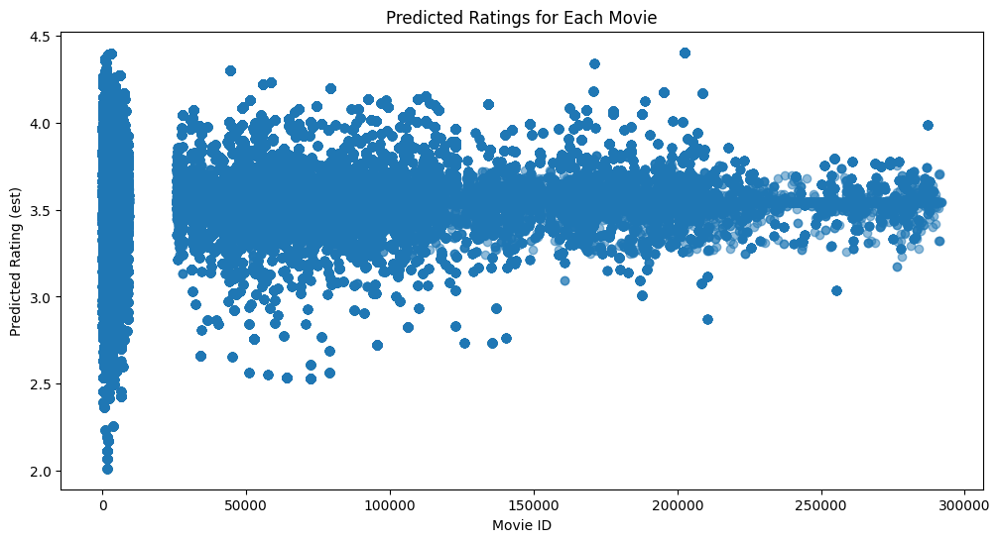

In [44]:
import matplotlib.pyplot as plt

# Extract movie IDs (iid) and predicted ratings (est)
movie_ids = [pred.iid for pred in predictions_list]
est_values = [pred.est for pred in predictions_list]

# Plot the predictions
plt.figure(figsize=(12, 6))
plt.scatter(movie_ids, est_values, alpha=0.5)
plt.xlabel("Movie ID")
plt.ylabel("Predicted Rating (est)")
plt.title("Predicted Ratings for Each Movie")
plt.show()

## Lenskit

In [ ]:
import os
from google.cloud import bigquery
import pandas as pd
from lenskit import crossfold
from lenskit.als import BiasedMFScorer # https://lkpy.lenskit.org/stable/guide/gettingstarted
from lenskit import util

# Initialize BigQuery client
client = bigquery.Client(project="film-wizard-453315")
print("Authenticated successfully!")

# Define batch size & dataset properties
BATCH_SIZE = 100_000  # 100k rows per batch
TOTAL_ROWS = 500_000  # Approximate total dataset size

# Fetch 500k ratings from BigQuery randomly (for the entire dataset)
sample_query = """
SELECT userId, movieId, rating
FROM film-wizard-453315.Grouplens.500k_ratings
ORDER BY RAND()
"""
sample_gl_df = client.query(sample_query).to_dataframe()

# Rename columns to match LensKit's expected column names
sample_gl_df = sample_gl_df.rename(columns={'userId': 'user_id', 'movieId': 'item_id'})
sample_gl_df

In [ ]:
# I ned to define cv, hyperparam grid and then do a gridsearch

# Train the model
model = als.BiasedMF(features=3, reg=0.01, rng_spec=42)

# Fit the model with your data
model.fit(sample_gl_df[['user_id', 'item_id', 'rating']])

# Create a scorer from the model
scorer = model.scorer()

# # ---------------------------

# # Prepare data for training
# train_data = sample_gl_df[['user', 'item', 'rating']]

# # Define cross-validation with LensKit
# folds = crossfold.sample_users(train_data, 5, size=0.2, method='random')  # 5-fold cross-validation

# # Define a function for ALS model training
# def train_als_model(train_data, factors=10, reg=0.01):
#     algo = als.ALS(factors=factors, reg=reg, random_state=42)
#     algo.fit(train_data)
#     return algo

# # Example hyperparameter grid (number of factors and regularization)
# param_grid = {
#     "factors": [5, 10, 50],
#     "reg": [0.001, 0.01, 0.05]
# }

# # Manually grid search
# best_rmse = float('inf')
# best_params = {}

# for factors in param_grid["factors"]:
#     for reg in param_grid["reg"]:
#         fold_rmse = []
        
#         for train, test in folds:
#             model = train_als_model(train, factors=factors, reg=reg)
            
#             # Ensure the test data is in the form of a list of tuples (user, item)
#             user_item_pairs = list(test[['user', 'item']].itertuples(index=False, name=None))
            
#             # Make predictions for these user-item pairs
#             pred = model.predict(user_item_pairs)
            
#             # Calculate RMSE
#             rmse_val = util.rmse(pred, test['rating'])
#             fold_rmse.append(rmse_val)
        
#         mean_rmse = sum(fold_rmse) / len(fold_rmse)
#         print(f"Factors: {factors}, Reg: {reg}, RMSE: {mean_rmse}")
        
#         if mean_rmse < best_rmse:
#             best_rmse = mean_rmse
#             best_params = {'factors': factors, 'reg': reg}

# print(f"Best Params: {best_params}")

In [ ]:
# Train the model using best hyperparameters from grid search
best_algo = train_als_model(train_data, best_params['factors'], best_params['reg'])

# Perform cross-validation to evaluate performance
fold_rmse = []

for train, test in folds:
    model = train_als_model(train, best_params['factors'], best_params['reg'])
    pred = model.predict(test[['userId', 'movieId']])
    rmse_val = util.rmse(pred, test['rating'])
    fold_rmse.append(rmse_val)

print(f"Cross-validation RMSE: {sum(fold_rmse)/len(fold_rmse)}")

In [ ]:
# Train on full dataset in batches
for offset in range(0, TOTAL_ROWS, BATCH_SIZE):
    batch_query = f"""
    SELECT userId, movieId, rating
    FROM film-wizard-453315.Grouplens.500k_ratings
    ORDER BY userId
    LIMIT {BATCH_SIZE} OFFSET {offset}
    """
    
    batch_df = client.query(batch_query).to_dataframe()
    
    if batch_df.empty:
        break  # Stop when there are no more rows
    
    train_data = batch_df[['userId', 'movieId', 'rating']]
    
    # Train the model on this batch
    best_algo.fit(train_data)
    print(f"✅ Processed {offset + BATCH_SIZE} rows")
    

In [ ]:
# Predict rating for a specific user and movie
user_id = 10531
movie_id = 100

# Make prediction using the trained ALS model
prediction = best_algo.predict(user_id, movie_id)
print(f"Predicted rating for user {user_id} and movie {movie_id}: {prediction}")

## Notes from original SVD jn

In [ ]:
# Path to your CSV file
csv_path = "/Users/oliverramsaygray/code/oliverramsaygray/film_wizard/raw_data/Adam films/9a884b4e-8993-4800-925a-bea11dcce39e.csv"

# Load the CSV into a DataFrame
movies_df = pd.read_csv(csv_path)

# Convert the 'date' column to datetime if it's not already
movies_df['Date'] = pd.to_datetime(movies_df['Date'])

# Filter out movies released in or after October 2023
movies_df = movies_df[movies_df['Date'] < '2023-10-01']

#Filter out movies that Grouplens later has an issue matching with
# Exclude specific movies by title
movies_to_exclude = ["Herod's Law", "Spirited Away", "Sing", "Living", "Fury"]  # Replace with actual movie titles
movies_df = movies_df[~movies_df['Name'].isin(movies_to_exclude)]

##### Half the ratings to be out of 5 - only for Adam #####
movies_df['Rating'] = movies_df['Rating']/2

# Sort by 'date' in descending order to get the most recent entries
oliver_recent_movies = movies_df.sort_values(by='Date', ascending=False).head(10)

# Show the most recent 10 movies and their ratings
display(oliver_recent_movies)

In [ ]:
from fuzzywuzzy import fuzz, process

# Set up BigQuery client
client = bigquery.Client(project="film-wizard-453315")

# Query to fetch the relevant data from BigQuery
query = """
SELECT movieId, title
FROM `film-wizard-453315.Grouplens.grouplens_movies`
"""
# Fetch data from BigQuery and load it into a DataFrame
grouplens_movies_df = client.query(query).to_dataframe()

# Show the first few rows of the DataFrame
display('grouplens_movies_df:')
display(grouplens_movies_df.head())

# Perform fuzzy matching between 'title' in 'oliver_recent_movies' and 'title' in 'grouplens_movies_df'
def get_best_match(title, choices, scorer=fuzz.ratio):
    """Fuzzy match using fuzz.ratio and return the best match."""
    match = process.extractOne(title, choices, scorer=scorer)
    return match[0] if match else None

# Apply fuzzy matching to the titles in 'oliver_recent_movies'
oliver_recent_movies['matched_title'] = oliver_recent_movies['Name'].apply(
    get_best_match, args=(grouplens_movies_df['title'],)
)

# Merge the original 'oliver_recent_movies' DataFrame with 'grouplens_movies_df' based on the 'matched_title'
test_movies_with_ids = pd.merge(
    oliver_recent_movies, 
    grouplens_movies_df[['title', 'movieId']], 
    left_on='matched_title', 
    right_on='title', 
    how='left'
)

##### Drop the 'matched_title' column and any other unnecessary columns - didn't use with Adam's csv
# test_movies_with_ids = test_movies_with_ids.drop(columns=['matched_title', 'Letterboxd URI', 'title', 'Date'])

In [ ]:
test_movies_with_ids.drop_duplicates(inplace=True)

# Show the final DataFrame
display(test_movies_with_ids)

In [ ]:
# Get all movie IDs in the GL dataset (this could be all movies in the system or a smaller list)
all_movie_ids = full_gl_df['movieId'].unique()

# Find unwatched movies for user 1 (exclude movies that user 1 has already rated)
unwatched_movie_ids = [i for i in all_movie_ids if i not in test_movies_with_ids['movieId'].values]

# Make predictions for the unwatched movies
predictions = [best_algo.predict(1, movie_id) for movie_id in unwatched_movie_ids]

# Sort the predictions by predicted rating (descending order)
predictions.sort(key=lambda x: x.est, reverse=True)

# Extract top X recommended movies with their predicted ratings
recommended_movies = [(pred.iid, pred.est) for pred in predictions[:10]]

# Convert to DataFrame
recommended_df = pd.DataFrame(recommended_movies, columns=["Movie ID", "Predicted Rating"])
display(recommended_df)

In [ ]:
display(recommended_df.info())
display(grouplens_movies_df.info())

# Bring back titles
final_recommendation = pd.merge(
    recommended_df, 
    grouplens_movies_df[['title', 'movieId']], 
    left_on='Movie ID', 
    right_on='movieId', 
    how='left'
)

final_recommendation

## Understanding the Grouplens dataset

In [ ]:
# Define BigQuery client
client = bigquery.Client(project="film-wizard-453315")

# Pull table from bq
sample_query = """
SELECT *
FROM `film-wizard-453315.Grouplens.grouplens_movies`
ORDER BY RAND()
LIMIT 1000  -- Adjust for ~1% of 32M rows
"""

test_df = client.query(sample_query).to_dataframe()
test_df.head(10)

In [ ]:
import pickle

with open('SVD_film_model.pkl', 'rb') as file:
    best_algo_test = pickle.load(file)

In [ ]:
# Make predictions for the unwatched movies
predictions = best_algo.predict(157707, 1)
predictions

# Sort the predictions by predicted rating (descending order)
# predictions.sort(key=lambda x: x.est, reverse=True)

In [ ]:
reader.

## Online example of Surprise

##### https://medium.com/@ckucewicz21/building-a-simple-movie-recommendation-system-with-surprise-6e61479e1e73

In [ ]:
from surprise import Dataset, Reader
from surprise import SVD
from surprise.model_selection import train_test_split
from surprise import accuracy

# Load the MovieLens 100k dataset (this is built into Surprise)
data = Dataset.load_builtin('ml-100k')

In [ ]:
# Split the data into a training and test set
trainset, testset = train_test_split(data, test_size=0.25)

# Create the SVD model and train it
model = SVD()
model.fit(trainset)

In [ ]:
# Define a function to get top 5 recommendations for a user
def get_top_n(predictions, n):
    top_n = {}
    for uid, iid, true_r, est, _ in predictions:
        if uid not in top_n:
            top_n[uid] = []
        top_n[uid].append((iid, est))

    # Sort the predictions for each user and return the top n
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]
    
    return top_n

# Get predictions for the testset
predictions = model.test(testset)

# Get the top 5 recommendations for each user
top_n = get_top_n(predictions, n=50)

#-------------------------------

# Get top recommendations for a specific user (e.g., user ID = 1)
user_id = '825'
user_top_n = top_n.get(user_id, [])

# Convert to DataFrame
df_user_top_825 = pd.DataFrame(user_top_n, columns=['Item ID', 'Estimated Rating'])

# Get top recommendations for a specific user (e.g., user ID = 1)
user_id = '253'
user_top_n = top_n.get(user_id, [])

# Convert to DataFrame
df_user_top_253 = pd.DataFrame(user_top_n, columns=['Item ID', 'Estimated Rating'])

# Find common Item IDs between the two DataFrames
common_item_ids = df_user_top_825[df_user_top_825['Item ID'].isin(df_user_top_253['Item ID'])]

# Display the common Item IDs
display(common_item_ids)

# Display the DataFrame
display(df_user_top_825, df_user_top_253)

# # Print the top 5 recommendations for a specific user (user_id = 1)
# print(f"Top 5 movie recommendations for user 825: {top_n.get('825')}")

In [ ]:
display(top_n)

In [ ]:
# Print the top 5 recommendations for a specific user (user_id = 1)
print(f"Top 5 movie recommendations for user 622: {top_n.get('622')}")